In [1]:
from IPython.core.display import display, HTML

import pandas as pd
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import os
import gc

from joblib import Parallel, delayed

from sklearn import preprocessing, model_selection
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.metrics import r2_score

import matplotlib.pyplot as plt 
import seaborn as sns
import numpy.matlib

pd.set_option('display.max_columns', 1000)
path_submissions = '/'

target_name = 'target'
scores_folds = {}

# 関数準備

In [2]:
# data directory
data_dir = '../input/optiver-realized-volatility-prediction/'

# Function to calculate first WAP
def calc_wap1(df):
    wap = (df['bid_price1'] * df['ask_size1'] + df['ask_price1'] * df['bid_size1']) / (df['bid_size1'] + df['ask_size1'])
    return wap

# Function to calculate second WAP
def calc_wap2(df):
    wap = (df['bid_price2'] * df['ask_size2'] + df['ask_price2'] * df['bid_size2']) / (df['bid_size2'] + df['ask_size2'])
    return wap

def calc_wap3(df):
    wap = (df['bid_price1'] * df['bid_size1'] + df['ask_price1'] * df['ask_size1']) / (df['bid_size1'] + df['ask_size1'])
    return wap

def calc_wap4(df):
    wap = (df['bid_price2'] * df['bid_size2'] + df['ask_price2'] * df['ask_size2']) / (df['bid_size2'] + df['ask_size2'])
    return wap

def calc_bollinger_band1(df):
    window=10
    wap_bol_upper = df["wap1"].rolling(window=window).mean() + (df["wap1"].rolling(window=window).std() * 2)
    wap_bol_lower = df["wap1"].rolling(window=window).mean() - (df["wap1"].rolling(window=window).std() * 2)
    wap_bol_balance = wap_bol_upper - wap_bol_lower
    return wap_bol_balance


# Function to calculate the log of the return
# Remember that logb(x / y) = logb(x) - logb(y)
def log_return(series):
    return np.log(series).diff()

# Calculate the realized volatility
def realized_volatility(series):
    return np.sqrt(np.sum(series**2))

# Function to count unique elements of a series
def count_unique(series):
    return len(np.unique(series))

# Function to read our base train and test set
def read_train_test():
    train = pd.read_csv('../input/optiver-realized-volatility-prediction/train.csv')
    test = pd.read_csv('../input/optiver-realized-volatility-prediction/test.csv')
    # Create a key to merge with book and trade data
    train['row_id'] = train['stock_id'].astype(str) + '-' + train['time_id'].astype(str)
    test['row_id'] = test['stock_id'].astype(str) + '-' + test['time_id'].astype(str)
    print(f'Our training set has {train.shape[0]} rows')
    return train, test

# Function to preprocess book data (for each stock id)
def book_preprocessor(file_path):
    df = pd.read_parquet(file_path)
    # Calculate Wap
    df['wap1'] = calc_wap1(df)
    df['wap2'] = calc_wap2(df)
    df['wap3'] = calc_wap3(df)
    df['wap4'] = calc_wap4(df)
    # Calculate log returns
    df['log_return1'] = df.groupby(['time_id'])['wap1'].apply(log_return)
    df['log_return2'] = df.groupby(['time_id'])['wap2'].apply(log_return)
    df['log_return3'] = df.groupby(['time_id'])['wap3'].apply(log_return)
    df['log_return4'] = df.groupby(['time_id'])['wap4'].apply(log_return)
    # Calculate wap balance
    df['wap_balance'] = abs(df['wap1'] - df['wap2'])
    # Calculate spread
    df['price_spread'] = (df['ask_price1'] - df['bid_price1']) / ((df['ask_price1'] + df['bid_price1']) / 2)
    df['price_spread2'] = (df['ask_price2'] - df['bid_price2']) / ((df['ask_price2'] + df['bid_price2']) / 2)
    df['bid_spread'] = df['bid_price1'] - df['bid_price2']
    df['ask_spread'] = df['ask_price1'] - df['ask_price2']
    df["bid_ask_spread"] = abs(df['bid_spread'] - df['ask_spread'])
    df['total_volume'] = (df['ask_size1'] + df['ask_size2']) + (df['bid_size1'] + df['bid_size2'])
    df['volume_imbalance'] = abs((df['ask_size1'] + df['ask_size2']) - (df['bid_size1'] + df['bid_size2']))
    
    df['bollinger_band_balance1'] = calc_bollinger_band1(df)
    
    # Dict for aggregations
    create_feature_dict = {
        'wap1': [np.sum, np.std],
        'wap2': [np.sum, np.std],
        'wap3': [np.sum, np.std],
        'wap4': [np.sum, np.std],
        'log_return1': [realized_volatility],
        'log_return2': [realized_volatility],
        'log_return3': [realized_volatility],
        'log_return4': [realized_volatility],
        'wap_balance': [np.sum, np.max],
        'price_spread':[np.sum, np.max],
        'price_spread2':[np.sum, np.max],
        'bid_spread':[np.sum, np.max],
        'ask_spread':[np.sum, np.max],
        'total_volume':[np.sum, np.max],
        'volume_imbalance':[np.sum, np.max],
        "bid_ask_spread":[np.sum,  np.max],
        'bollinger_band_balance1':[np.sum, np.max]
    }
    create_feature_dict_time = {
        'log_return1': [realized_volatility],
        'log_return2': [realized_volatility],
        'log_return3': [realized_volatility],
        'log_return4': [realized_volatility],
    }
    
    # Function to get group stats for different windows (seconds in bucket)
    def get_stats_window(fe_dict,seconds_in_bucket, add_suffix = False):
        # Group by the window
        df_feature = df[df['seconds_in_bucket'] >= seconds_in_bucket].groupby(['time_id']).agg(fe_dict).reset_index()
        # Rename columns joining suffix
        df_feature.columns = ['_'.join(col) for col in df_feature.columns]
        # Add a suffix to differentiate windows
        if add_suffix:
            df_feature = df_feature.add_suffix('_' + str(seconds_in_bucket))
        return df_feature
    
    # Get the stats for different windows
    df_feature = get_stats_window(create_feature_dict,seconds_in_bucket = 0, add_suffix = False)
    df_feature_500 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 500, add_suffix = True)
    df_feature_400 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 400, add_suffix = True)
    df_feature_300 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 300, add_suffix = True)
    df_feature_200 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 200, add_suffix = True)
    df_feature_100 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 100, add_suffix = True)

    # Merge all
    df_feature = df_feature.merge(df_feature_500, how = 'left', left_on = 'time_id_', right_on = 'time_id__500')
    df_feature = df_feature.merge(df_feature_400, how = 'left', left_on = 'time_id_', right_on = 'time_id__400')
    df_feature = df_feature.merge(df_feature_300, how = 'left', left_on = 'time_id_', right_on = 'time_id__300')
    df_feature = df_feature.merge(df_feature_200, how = 'left', left_on = 'time_id_', right_on = 'time_id__200')
    df_feature = df_feature.merge(df_feature_100, how = 'left', left_on = 'time_id_', right_on = 'time_id__100')
    # Drop unnecesary time_ids
    df_feature.drop(['time_id__500','time_id__400', 'time_id__300', 'time_id__200','time_id__100'], axis = 1, inplace = True)
    
    
    # Create row_id so we can merge
    stock_id = file_path.split('=')[1]
    df_feature['row_id'] = df_feature['time_id_'].apply(lambda x: f'{stock_id}-{x}')
    df_feature.drop(['time_id_'], axis = 1, inplace = True)
    return df_feature

# Function to preprocess trade data (for each stock id)
def trade_preprocessor(file_path):
    df = pd.read_parquet(file_path)
    df['log_return'] = df.groupby('time_id')['price'].apply(log_return)
    df['amount']=df['price']*df['size']
    # Dict for aggregations
    create_feature_dict = {
        'log_return':[realized_volatility],
        'seconds_in_bucket':[count_unique],
        'size':[np.sum, np.max, np.min],
        'order_count':[np.sum,np.max],
        'amount':[np.sum,np.max,np.min],
    }
    create_feature_dict_time = {
        'log_return':[realized_volatility],
        'seconds_in_bucket':[count_unique],
        'size':[np.sum],
        'order_count':[np.sum],
    }
    # Function to get group stats for different windows (seconds in bucket)
    def get_stats_window(fe_dict,seconds_in_bucket, add_suffix = False):
        # Group by the window
        df_feature = df[df['seconds_in_bucket'] >= seconds_in_bucket].groupby(['time_id']).agg(fe_dict).reset_index()
        # Rename columns joining suffix
        df_feature.columns = ['_'.join(col) for col in df_feature.columns]
        # Add a suffix to differentiate windows
        if add_suffix:
            df_feature = df_feature.add_suffix('_' + str(seconds_in_bucket))
        return df_feature
    

    # Get the stats for different windows
    df_feature = get_stats_window(create_feature_dict,seconds_in_bucket = 0, add_suffix = False)
    df_feature_500 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 500, add_suffix = True)
    df_feature_400 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 400, add_suffix = True)
    df_feature_300 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 300, add_suffix = True)
    df_feature_200 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 200, add_suffix = True)
    df_feature_100 = get_stats_window(create_feature_dict_time,seconds_in_bucket = 100, add_suffix = True)
    
    def tendency(price, vol):    
        df_diff = np.diff(price)
        val = (df_diff/price[1:])*100
        power = np.sum(val*vol[1:])
        return(power)
    
    lis = []
    for n_time_id in df['time_id'].unique():
        df_id = df[df['time_id'] == n_time_id]        
        tendencyV = tendency(df_id['price'].values, df_id['size'].values)      
        f_max = np.sum(df_id['price'].values > np.mean(df_id['price'].values))
        f_min = np.sum(df_id['price'].values < np.mean(df_id['price'].values))
        df_max =  np.sum(np.diff(df_id['price'].values) > 0)
        df_min =  np.sum(np.diff(df_id['price'].values) < 0)
        # new
        abs_diff = np.median(np.abs( df_id['price'].values - np.mean(df_id['price'].values)))        
        energy = np.mean(df_id['price'].values**2)
        iqr_p = np.percentile(df_id['price'].values,75) - np.percentile(df_id['price'].values,25)
        
        # vol vars
        
        abs_diff_v = np.median(np.abs( df_id['size'].values - np.mean(df_id['size'].values)))        
        energy_v = np.sum(df_id['size'].values**2)
        iqr_p_v = np.percentile(df_id['size'].values,75) - np.percentile(df_id['size'].values,25)
        
        lis.append({'time_id':n_time_id,'tendency':tendencyV,'f_max':f_max,'f_min':f_min,'df_max':df_max,'df_min':df_min,
                   'abs_diff':abs_diff,'energy':energy,'iqr_p':iqr_p,'abs_diff_v':abs_diff_v,'energy_v':energy_v,'iqr_p_v':iqr_p_v})
    
    df_lr = pd.DataFrame(lis)
        
   
    df_feature = df_feature.merge(df_lr, how = 'left', left_on = 'time_id_', right_on = 'time_id')
    
    # Merge all
    df_feature = df_feature.merge(df_feature_500, how = 'left', left_on = 'time_id_', right_on = 'time_id__500')
    df_feature = df_feature.merge(df_feature_400, how = 'left', left_on = 'time_id_', right_on = 'time_id__400')
    df_feature = df_feature.merge(df_feature_300, how = 'left', left_on = 'time_id_', right_on = 'time_id__300')
    df_feature = df_feature.merge(df_feature_200, how = 'left', left_on = 'time_id_', right_on = 'time_id__200')
    df_feature = df_feature.merge(df_feature_100, how = 'left', left_on = 'time_id_', right_on = 'time_id__100')
    # Drop unnecesary time_ids
    df_feature.drop(['time_id__500','time_id__400', 'time_id__300', 'time_id__200','time_id','time_id__100'], axis = 1, inplace = True)
    
    
    df_feature = df_feature.add_prefix('trade_')
    stock_id = file_path.split('=')[1]
    df_feature['row_id'] = df_feature['trade_time_id_'].apply(lambda x:f'{stock_id}-{x}')
    df_feature.drop(['trade_time_id_'], axis = 1, inplace = True)
    return df_feature

# Function to get group stats for the stock_id and time_id
def get_time_stock(df):
    vol_cols = ['log_return1_realized_volatility', 'log_return2_realized_volatility', 'log_return1_realized_volatility_400', 'log_return2_realized_volatility_400', 
                'log_return1_realized_volatility_300', 'log_return2_realized_volatility_300', 'log_return1_realized_volatility_200', 'log_return2_realized_volatility_200', 
                'trade_log_return_realized_volatility', 'trade_log_return_realized_volatility_400', 'trade_log_return_realized_volatility_300', 'trade_log_return_realized_volatility_200']


    # Group by the stock id
    df_stock_id = df.groupby(['stock_id'])[vol_cols].agg(['mean', 'std', 'max', 'min', ]).reset_index()
    # Rename columns joining suffix
    df_stock_id.columns = ['_'.join(col) for col in df_stock_id.columns]
    df_stock_id = df_stock_id.add_suffix('_' + 'stock')

    # Group by the stock id
    df_time_id = df.groupby(['time_id'])[vol_cols].agg(['mean', 'std', 'max', 'min', ]).reset_index()
    # Rename columns joining suffix
    df_time_id.columns = ['_'.join(col) for col in df_time_id.columns]
    df_time_id = df_time_id.add_suffix('_' + 'time')
    
    # Merge with original dataframe
    df = df.merge(df_stock_id, how = 'left', left_on = ['stock_id'], right_on = ['stock_id__stock'])
    df = df.merge(df_time_id, how = 'left', left_on = ['time_id'], right_on = ['time_id__time'])
    df.drop(['stock_id__stock', 'time_id__time'], axis = 1, inplace = True)
    return df
    
# Funtion to make preprocessing function in parallel (for each stock id)
def preprocessor(list_stock_ids, is_train = True):
    
    # Parrallel for loop
    def for_joblib(stock_id):
        # Train
        if is_train:
            file_path_book = data_dir + "book_train.parquet/stock_id=" + str(stock_id)
            file_path_trade = data_dir + "trade_train.parquet/stock_id=" + str(stock_id)
        # Test
        else:
            file_path_book = data_dir + "book_test.parquet/stock_id=" + str(stock_id)
            file_path_trade = data_dir + "trade_test.parquet/stock_id=" + str(stock_id)
    
        # Preprocess book and trade data and merge them
        df_tmp = pd.merge(book_preprocessor(file_path_book), trade_preprocessor(file_path_trade), on = 'row_id', how = 'left')
        
        # Return the merge dataframe
        return df_tmp
    
    # Use parallel api to call paralle for loop
    df = Parallel(n_jobs = -1, verbose = 1)(delayed(for_joblib)(stock_id) for stock_id in list_stock_ids)
    # Concatenate all the dataframes that return from Parallel
    df = pd.concat(df, ignore_index = True)
    return df

# Function to calculate the root mean squared percentage error
def rmspe(y_true, y_pred):
    return np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))

# Function to early stop with root mean squared percentage error
def feval_rmspe(y_pred, lgb_train):
    y_true = lgb_train.get_label()
    return 'RMSPE', rmspe(y_true, y_pred), False

# データ準備

In [3]:
# Read train and test
train, test = read_train_test()

Our training set has 428932 rows


## 学習データ

In [4]:
# Get unique stock ids 
train_stock_ids = train['stock_id'].unique()
# Preprocess them using Parallel and our single stock id functions
train_ = preprocessor(train_stock_ids, is_train = True)
train = train.merge(train_, on = ['row_id'], how = 'left')
# Get group stats of time_id and stock_id
train = get_time_stock(train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 112 out of 112 | elapsed: 40.8min finished


## テストデータ

In [5]:
# Get unique stock ids 
test_stock_ids = test['stock_id'].unique()
# Preprocess them using Parallel and our single stock id functions
test_ = preprocessor(test_stock_ids, is_train = False)
test = test.merge(test_, on = ['row_id'], how = 'left')

# Get group stats of time_id and stock_id
test = get_time_stock(test)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.3s finished


In [6]:
test.to_pickle('test_base.pkl')
train.to_pickle('train_base.pkl')

## +データ追加１

In [7]:
# replace by order sum (tau)
train['size_tau'] = np.sqrt( 1/ train['trade_seconds_in_bucket_count_unique'] )
test['size_tau'] = np.sqrt( 1/ test['trade_seconds_in_bucket_count_unique'] )
#train['size_tau_450'] = np.sqrt( 1/ train['trade_seconds_in_bucket_count_unique_450'] )
#test['size_tau_450'] = np.sqrt( 1/ test['trade_seconds_in_bucket_count_unique_450'] )
train['size_tau_400'] = np.sqrt( 1/ train['trade_seconds_in_bucket_count_unique_400'] )
test['size_tau_400'] = np.sqrt( 1/ test['trade_seconds_in_bucket_count_unique_400'] )
train['size_tau_300'] = np.sqrt( 1/ train['trade_seconds_in_bucket_count_unique_300'] )
test['size_tau_300'] = np.sqrt( 1/ test['trade_seconds_in_bucket_count_unique_300'] )
#train['size_tau_150'] = np.sqrt( 1/ train['trade_seconds_in_bucket_count_unique_150'] )
#test['size_tau_150'] = np.sqrt( 1/ test['trade_seconds_in_bucket_count_unique_150'] )
train['size_tau_200'] = np.sqrt( 1/ train['trade_seconds_in_bucket_count_unique_200'] )
test['size_tau_200'] = np.sqrt( 1/ test['trade_seconds_in_bucket_count_unique_200'] )

In [8]:
train['size_tau2'] = np.sqrt( 1/ train['trade_order_count_sum'] )
test['size_tau2'] = np.sqrt( 1/ test['trade_order_count_sum'] )
#train['size_tau2_450'] = np.sqrt( 0.25/ train['trade_order_count_sum'] )
#test['size_tau2_450'] = np.sqrt( 0.25/ test['trade_order_count_sum'] )
train['size_tau2_400'] = np.sqrt( 0.33/ train['trade_order_count_sum'] )
test['size_tau2_400'] = np.sqrt( 0.33/ test['trade_order_count_sum'] )
train['size_tau2_300'] = np.sqrt( 0.5/ train['trade_order_count_sum'] )
test['size_tau2_300'] = np.sqrt( 0.5/ test['trade_order_count_sum'] )
#train['size_tau2_150'] = np.sqrt( 0.75/ train['trade_order_count_sum'] )
#test['size_tau2_150'] = np.sqrt( 0.75/ test['trade_order_count_sum'] )
train['size_tau2_200'] = np.sqrt( 0.66/ train['trade_order_count_sum'] )
test['size_tau2_200'] = np.sqrt( 0.66/ test['trade_order_count_sum'] )

# delta tau
train['size_tau2_d'] = train['size_tau2_400'] - train['size_tau2']
test['size_tau2_d'] = test['size_tau2_400'] - test['size_tau2']

In [9]:
colNames = [col for col in list(train.columns)
            if col not in {"stock_id", "time_id", "target", "row_id"}]
len(colNames)

196

## データ追加2
stock_idによるクラスタリング

In [10]:
from sklearn.cluster import KMeans
# making agg features

train_p = pd.read_csv('../input/optiver-realized-volatility-prediction/train.csv')
train_p = train_p.pivot(index='time_id', columns='stock_id', values='target')

corr = train_p.corr()

ids = corr.index

kmeans = KMeans(n_clusters=7, random_state=0).fit(corr.values)
print(kmeans.labels_)

l = []
for n in range(7):
    l.append ( [ (x-1) for x in ( (ids+1)*(kmeans.labels_ == n)) if x > 0] )
    

mat = []
matTest = []

n = 0
for ind in l:
    print(ind)
    newDf = train.loc[train['stock_id'].isin(ind) ]
    newDf = newDf.groupby(['time_id']).agg(np.nanmean)
    newDf.loc[:,'stock_id'] = str(n)+'c1'
    mat.append ( newDf )
    
    newDf = test.loc[test['stock_id'].isin(ind) ]    
    newDf = newDf.groupby(['time_id']).agg(np.nanmean)
    newDf.loc[:,'stock_id'] = str(n)+'c1'
    matTest.append ( newDf )
    
    n+=1
    
mat1 = pd.concat(mat).reset_index()
mat1.drop(columns=['target'],inplace=True)

mat2 = pd.concat(matTest).reset_index()

[1 0 4 2 1 1 2 4 6 2 1 0 4 4 1 1 1 2 4 4 4 0 1 1 3 1 1 4 3 4 3 4 4 1 3 3 4
 3 4 1 4 1 4 4 1 0 4 4 1 0 0 3 3 3 2 0 2 4 1 4 4 1 4 1 0 3 3 0 3 0 6 5 3 3
 0 1 2 0 3 3 3 4 1 1 0 2 3 3 1 0 1 4 4 4 4 4 1 3 1 0 1 4 1 0 1 4 1 0 4 0 4
 0]
[1, 11, 22, 50, 55, 56, 62, 73, 76, 78, 84, 87, 96, 101, 112, 116, 122, 124, 126]
[0, 4, 5, 10, 15, 16, 17, 23, 26, 28, 29, 36, 42, 44, 48, 53, 66, 69, 72, 85, 94, 95, 100, 102, 109, 111, 113, 115, 118, 120]
[3, 6, 9, 18, 61, 63, 86, 97]
[27, 31, 33, 37, 38, 40, 58, 59, 60, 74, 75, 77, 82, 83, 88, 89, 90, 98, 99, 110]
[2, 7, 13, 14, 19, 20, 21, 30, 32, 34, 35, 39, 41, 43, 46, 47, 51, 52, 64, 67, 68, 70, 93, 103, 104, 105, 107, 108, 114, 119, 123, 125]
[81]
[8, 80]


In [11]:
mat2 = pd.concat([mat2,mat1.loc[mat1.time_id==5]])
mat1 = mat1.pivot(index='time_id', columns='stock_id')
mat1.columns = ["_".join(x) for x in mat1.columns.ravel()]
mat1.reset_index(inplace=True)

mat2 = mat2.pivot(index='time_id', columns='stock_id')
mat2.columns = ["_".join(x) for x in mat2.columns.ravel()]
mat2.reset_index(inplace=True)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  import sys


In [12]:
nnn = ['time_id',
     'log_return1_realized_volatility_0c1',
     'log_return1_realized_volatility_1c1',     
     'log_return1_realized_volatility_3c1',
     'log_return1_realized_volatility_4c1',     
     'log_return1_realized_volatility_6c1',
     'total_volume_sum_0c1',
     'total_volume_sum_1c1', 
     'total_volume_sum_3c1',
     'total_volume_sum_4c1', 
     'total_volume_sum_6c1',
     'trade_size_sum_0c1',
     'trade_size_sum_1c1', 
     'trade_size_sum_3c1',
     'trade_size_sum_4c1', 
     'trade_size_sum_6c1',
     'trade_order_count_sum_0c1',
     'trade_order_count_sum_1c1',
     'trade_order_count_sum_3c1',
     'trade_order_count_sum_4c1',
     'trade_order_count_sum_6c1',      
     'price_spread_sum_0c1',
     'price_spread_sum_1c1',
     'price_spread_sum_3c1',
     'price_spread_sum_4c1',
     'price_spread_sum_6c1',   
     'bid_spread_sum_0c1',
     'bid_spread_sum_1c1',
     'bid_spread_sum_3c1',
     'bid_spread_sum_4c1',
     'bid_spread_sum_6c1',       
     'ask_spread_sum_0c1',
     'ask_spread_sum_1c1',
     'ask_spread_sum_3c1',
     'ask_spread_sum_4c1',
     'ask_spread_sum_6c1',   
     'volume_imbalance_sum_0c1',
     'volume_imbalance_sum_1c1',
     'volume_imbalance_sum_3c1',
     'volume_imbalance_sum_4c1',
     'volume_imbalance_sum_6c1',       
     'bid_ask_spread_sum_0c1',
     'bid_ask_spread_sum_1c1',
     'bid_ask_spread_sum_3c1',
     'bid_ask_spread_sum_4c1',
     'bid_ask_spread_sum_6c1',
     'size_tau2_0c1',
     'size_tau2_1c1',
     'size_tau2_3c1',
     'size_tau2_4c1',
     'size_tau2_6c1'] 
train = pd.merge(train,mat1[nnn],how='left',on='time_id')
test = pd.merge(test,mat2[nnn],how='left',on='time_id')

In [13]:
import gc
del mat1,mat2
gc.collect()

20

In [14]:
test.to_pickle('test.pkl')
train.to_pickle('train.pkl')

In [15]:
train_temp = train
test_temp = test

In [16]:
train_temp.head()

,stock_id,time_id,target,row_id,wap1_sum,wap1_std,wap2_sum,wap2_std,wap3_sum,wap3_std,wap4_sum,wap4_std,log_return1_realized_volatility,log_return2_realized_volatility,log_return3_realized_volatility,log_return4_realized_volatility,wap_balance_sum,wap_balance_amax,price_spread_sum,price_spread_amax,price_spread2_sum,price_spread2_amax,bid_spread_sum,bid_spread_amax,ask_spread_sum,ask_spread_amax,total_volume_sum,total_volume_amax,volume_imbalance_sum,volume_imbalance_amax,bid_ask_spread_sum,bid_ask_spread_amax,bollinger_band_balance1_sum,bollinger_band_balance1_amax,log_return1_realized_volatility_500,log_return2_realized_volatility_500,log_return3_realized_volatility_500,log_return4_realized_volatility_500,log_return1_realized_volatility_400,log_return2_realized_volatility_400,log_return3_realized_volatility_400,log_return4_realized_volatility_400,log_return1_realized_volatility_300,log_return2_realized_volatility_300,log_return3_realized_volatility_300,log_return4_realized_volatility_300,log_return1_realized_volatility_200,log_return2_realized_volatility_200,log_return3_realized_volatility_200,log_return4_realized_volatility_200,log_return1_realized_volatility_100,log_return2_realized_volatility_100,log_return3_realized_volatility_100,log_return4_realized_volatility_100,trade_log_return_realized_volatility,trade_seconds_in_bucket_count_unique,trade_size_sum,trade_size_amax,trade_size_amin,trade_order_count_sum,trade_order_count_amax,trade_amount_sum,trade_amount_amax,trade_amount_amin,trade_tendency,trade_f_max,trade_f_min,trade_df_max,trade_df_min,trade_abs_diff,trade_energy,trade_iqr_p,trade_abs_diff_v,trade_energy_v,trade_iqr_p_v,trade_log_return_realized_volatility_500,trade_seconds_in_bucket_count_unique_500,trade_size_sum_500,trade_order_count_sum_500,trade_log_return_realized_volatility_400,trade_seconds_in_bucket_count_unique_400,trade_size_sum_400,trade_order_count_sum_400,trade_log_return_realized_volatility_300,trade_seconds_in_bucket_count_unique_300,trade_size_sum_300,trade_order_count_sum_300,trade_log_return_realized_volatility_200,trade_seconds_in_bucket_count_unique_200,trade_size_sum_200,trade_order_count_sum_200,trade_log_return_realized_volatility_100,trade_seconds_in_bucket_count_unique_100,trade_size_sum_100,trade_order_count_sum_100,log_return1_realized_volatility_mean_stock,log_return1_realized_volatility_std_stock,log_return1_realized_volatility_max_stock,log_return1_realized_volatility_min_stock,log_return2_realized_volatility_mean_stock,log_return2_realized_volatility_std_stock,log_return2_realized_volatility_max_stock,log_return2_realized_volatility_min_stock,log_return1_realized_volatility_400_mean_stock,log_return1_realized_volatility_400_std_stock,log_return1_realized_volatility_400_max_stock,log_return1_realized_volatility_400_min_stock,log_return2_realized_volatility_400_mean_stock,log_return2_realized_volatility_400_std_stock,log_return2_realized_volatility_400_max_stock,log_return2_realized_volatility_400_min_stock,log_return1_realized_volatility_300_mean_stock,log_return1_realized_volatility_300_std_stock,log_return1_realized_volatility_300_max_stock,log_return1_realized_volatility_300_min_stock,log_return2_realized_volatility_300_mean_stock,log_return2_realized_volatility_300_std_stock,log_return2_realized_volatility_300_max_stock,log_return2_realized_volatility_300_min_stock,log_return1_realized_volatility_200_mean_stock,log_return1_realized_volatility_200_std_stock,log_return1_realized_volatility_200_max_stock,log_return1_realized_volatility_200_min_stock,log_return2_realized_volatility_200_mean_stock,log_return2_realized_volatility_200_std_stock,log_return2_realized_volatility_200_max_stock,log_return2_realized_volatility_200_min_stock,trade_log_return_realized_volatility_mean_stock,trade_log_return_realized_volatility_std_stock,trade_log_return_realized_volatility_max_stock,trade_log_return_realized_volatility_min_stock,trade_log_return_realized_volatility_400_mean_stock,trade_log_ret

In [17]:
test_temp.head()

,stock_id,time_id,row_id,wap1_sum,wap1_std,wap2_sum,wap2_std,wap3_sum,wap3_std,wap4_sum,wap4_std,log_return1_realized_volatility,log_return2_realized_volatility,log_return3_realized_volatility,log_return4_realized_volatility,wap_balance_sum,wap_balance_amax,price_spread_sum,price_spread_amax,price_spread2_sum,price_spread2_amax,bid_spread_sum,bid_spread_amax,ask_spread_sum,ask_spread_amax,total_volume_sum,total_volume_amax,volume_imbalance_sum,volume_imbalance_amax,bid_ask_spread_sum,bid_ask_spread_amax,bollinger_band_balance1_sum,bollinger_band_balance1_amax,log_return1_realized_volatility_500,log_return2_realized_volatility_500,log_return3_realized_volatility_500,log_return4_realized_volatility_500,log_return1_realized_volatility_400,log_return2_realized_volatility_400,log_return3_realized_volatility_400,log_return4_realized_volatility_400,log_return1_realized_volatility_300,log_return2_realized_volatility_300,log_return3_realized_volatility_300,log_return4_realized_volatility_300,log_return1_realized_volatility_200,log_return2_realized_volatility_200,log_return3_realized_volatility_200,log_return4_realized_volatility_200,log_return1_realized_volatility_100,log_return2_realized_volatility_100,log_return3_realized_volatility_100,log_return4_realized_volatility_100,trade_log_return_realized_volatility,trade_seconds_in_bucket_count_unique,trade_size_sum,trade_size_amax,trade_size_amin,trade_order_count_sum,trade_order_count_amax,trade_amount_sum,trade_amount_amax,trade_amount_amin,trade_tendency,trade_f_max,trade_f_min,trade_df_max,trade_df_min,trade_abs_diff,trade_energy,trade_iqr_p,trade_abs_diff_v,trade_energy_v,trade_iqr_p_v,trade_log_return_realized_volatility_500,trade_seconds_in_bucket_count_unique_500,trade_size_sum_500,trade_order_count_sum_500,trade_log_return_realized_volatility_400,trade_seconds_in_bucket_count_unique_400,trade_size_sum_400,trade_order_count_sum_400,trade_log_return_realized_volatility_300,trade_seconds_in_bucket_count_unique_300,trade_size_sum_300,trade_order_count_sum_300,trade_log_return_realized_volatility_200,trade_seconds_in_bucket_count_unique_200,trade_size_sum_200,trade_order_count_sum_200,trade_log_return_realized_volatility_100,trade_seconds_in_bucket_count_unique_100,trade_size_sum_100,trade_order_count_sum_100,log_return1_realized_volatility_mean_stock,log_return1_realized_volatility_std_stock,log_return1_realized_volatility_max_stock,log_return1_realized_volatility_min_stock,log_return2_realized_volatility_mean_stock,log_return2_realized_volatility_std_stock,log_return2_realized_volatility_max_stock,log_return2_realized_volatility_min_stock,log_return1_realized_volatility_400_mean_stock,log_return1_realized_volatility_400_std_stock,log_return1_realized_volatility_400_max_stock,log_return1_realized_volatility_400_min_stock,log_return2_realized_volatility_400_mean_stock,log_return2_realized_volatility_400_std_stock,log_return2_realized_volatility_400_max_stock,log_return2_realized_volatility_400_min_stock,log_return1_realized_volatility_300_mean_stock,log_return1_realized_volatility_300_std_stock,log_return1_realized_volatility_300_max_stock,log_return1_realized_volatility_300_min_stock,log_return2_realized_volatility_300_mean_stock,log_return2_realized_volatility_300_std_stock,log_return2_realized_volatility_300_max_stock,log_return2_realized_volatility_300_min_stock,log_return1_realized_volatility_200_mean_stock,log_return1_realized_volatility_200_std_stock,log_return1_realized_volatility_200_max_stock,log_return1_realized_volatility_200_min_stock,log_return2_realized_volatility_200_mean_stock,log_return2_realized_volatility_200_std_stock,log_return2_realized_volatility_200_max_stock,log_return2_realized_volatility_200_min_stock,trade_log_return_realized_volatility_mean_stock,trade_log_return_realized_volatility_std_stock,trade_log_return_realized_volatility_max_stock,trade_log_return_realized_volatility_min_stock,trade_log_return_realized_volatility_400_mean_stock,trade_log_return_rea

# LightLGB

## 学習

In [18]:
from sklearn.model_selection import KFold
import lightgbm as lgb

seed0=2021
params0 = {
    'objective': 'rmse',
    'boosting_type': 'gbdt',
    'max_depth': -1,
    'max_bin':100,
    'min_data_in_leaf':500,
    'learning_rate': 0.05,
    'subsample': 0.72,
    'subsample_freq': 4,
    'feature_fraction': 0.5,
    'lambda_l1': 0.5,
    'lambda_l2': 1.0,
    'categorical_column':[0],
    'seed':seed0,
    'feature_fraction_seed': seed0,
    'bagging_seed': seed0,
    'drop_seed': seed0,
    'data_random_seed': seed0,
    'n_jobs':-1,
    'verbose': -1}
seed1=42
params1 = {
        'learning_rate': 0.1,        
        'lambda_l1': 2,
        'lambda_l2': 7,
        'num_leaves': 800,
        'min_sum_hessian_in_leaf': 20,
        'feature_fraction': 0.8,
        'feature_fraction_bynode': 0.8,
        'bagging_fraction': 0.9,
        'bagging_freq': 42,
        'min_data_in_leaf': 700,
        'max_depth': 4,
        'categorical_column':[0],
        'seed': seed1,
        'feature_fraction_seed': seed1,
        'bagging_seed': seed1,
        'drop_seed': seed1,
        'data_random_seed': seed1,
        'objective': 'rmse',
        'boosting': 'gbdt',
        'verbosity': -1,
        'n_jobs':-1,
    }
seed2 = 29
params2 = {
        'learning_rate': 0.15,        
        'lambda_l1': 2.154360665259325,
        'lambda_l2': 6.711089761523827,
        'num_leaves': 2769,
        'min_sum_hessian_in_leaf': 20.44437160769411,
        'feature_fraction': 0.7921473067441019,
        'feature_fraction_bynode': 0.8083803860191322,
        'bagging_fraction': 0.9726755660563261,
        'bagging_freq': 42,
        'min_data_in_leaf': 1690,
        'max_depth': 4,
        'seed': seed2,
        'feature_fraction_seed': seed2,
        'bagging_seed': seed2,
        'drop_seed': seed2,
        'data_random_seed': seed2,
        'objective': 'rmse',
        'boosting': 'gbdt',
        'verbosity': -1,
        'n_jobs': -1,
    } 
# Function to early stop with root mean squared percentage error
def rmspe(y_true, y_pred):
    return np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))

def feval_rmspe(y_pred, lgb_train):
    y_true = lgb_train.get_label()
    return 'RMSPE', rmspe(y_true, y_pred), False

def train_and_evaluate_lgb(train, test, params,boost=1000):
    # Hyperparammeters (just basic)
    evals_result = {}
    features = [col for col in train.columns if col not in {"time_id", "target", "row_id"}]
    y = train['target']
    # Create out of folds array
    oof_predictions = np.zeros(train.shape[0])
    # Create test array to store predictions
    test_predictions = np.zeros(test.shape[0])
    # Create a KFold object
    kfold = KFold(n_splits = 5, random_state = 2021, shuffle = True)
    # Iterate through each fold
    for fold, (trn_ind, val_ind) in enumerate(kfold.split(train)):
        print(f'Training fold {fold + 1}')
        x_train, x_val = train.iloc[trn_ind], train.iloc[val_ind]
        y_train, y_val = y.iloc[trn_ind], y.iloc[val_ind]
        # Root mean squared percentage error weights
        train_weights = 1 / np.square(y_train)
        val_weights = 1 / np.square(y_val)
        train_dataset = lgb.Dataset(x_train[features], y_train, weight = train_weights)
        val_dataset = lgb.Dataset(x_val[features], y_val, weight = val_weights)
        model = lgb.train(params = params,
                          num_boost_round=boost,
                          train_set = train_dataset, 
                          valid_sets = [train_dataset, val_dataset], 
                          verbose_eval = 250,
                          early_stopping_rounds=50,
                          feval = feval_rmspe,
                         evals_result =evals_result)
        # Add predictions to the out of folds array
        oof_predictions[val_ind] = model.predict(x_val[features])
        # Predict the test set
        test_predictions += model.predict(test[features]) / 5
    rmspe_score = rmspe(y, oof_predictions)
    print(f'Our out of folds RMSPE is {rmspe_score}')
    lgb.plot_importance(model,max_num_features=20)
    # Return test predictions
    return test_predictions,model,evals_result

### モデル１

Training fold 1
Training until validation scores don't improve for 50 rounds
[250]	training's rmse: 0.000428241	training's RMSPE: 0.198053	valid_1's rmse: 0.000440904	valid_1's RMSPE: 0.204643
[500]	training's rmse: 0.000406285	training's RMSPE: 0.187898	valid_1's rmse: 0.000427139	valid_1's RMSPE: 0.198254
[750]	training's rmse: 0.000393186	training's RMSPE: 0.18184	valid_1's rmse: 0.000420404	valid_1's RMSPE: 0.195128
[1000]	training's rmse: 0.000383154	training's RMSPE: 0.177201	valid_1's rmse: 0.000415898	valid_1's RMSPE: 0.193036
Did not meet early stopping. Best iteration is:
[1000]	training's rmse: 0.000383154	training's RMSPE: 0.177201	valid_1's rmse: 0.000415898	valid_1's RMSPE: 0.193036
Training fold 2
Training until validation scores don't improve for 50 rounds
[250]	training's rmse: 0.000428309	training's RMSPE: 0.198431	valid_1's rmse: 0.00044051	valid_1's RMSPE: 0.203034
[500]	training's rmse: 0.000406337	training's RMSPE: 0.188251	valid_1's rmse: 0.000425479	valid_1's RM

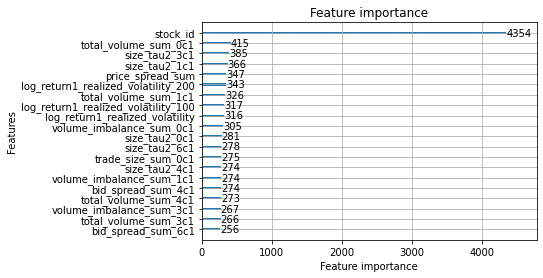

In [19]:
# Traing and evaluate
predictions_lgb1,model1,evals_result1 = train_and_evaluate_lgb(train, test,params0)

### モデル２

Training fold 1
Training until validation scores don't improve for 50 rounds
[250]	training's rmse: 0.000429959	training's RMSPE: 0.198847	valid_1's rmse: 0.000442731	valid_1's RMSPE: 0.205491
[500]	training's rmse: 0.000410972	training's RMSPE: 0.190066	valid_1's rmse: 0.000428395	valid_1's RMSPE: 0.198837
[750]	training's rmse: 0.000399776	training's RMSPE: 0.184888	valid_1's rmse: 0.000421006	valid_1's RMSPE: 0.195407
[1000]	training's rmse: 0.000391345	training's RMSPE: 0.180989	valid_1's rmse: 0.000415687	valid_1's RMSPE: 0.192938
[1250]	training's rmse: 0.000385377	training's RMSPE: 0.178229	valid_1's rmse: 0.000413246	valid_1's RMSPE: 0.191805
[1500]	training's rmse: 0.000380207	training's RMSPE: 0.175838	valid_1's rmse: 0.000411725	valid_1's RMSPE: 0.191099
[1750]	training's rmse: 0.000375708	training's RMSPE: 0.173757	valid_1's rmse: 0.000410539	valid_1's RMSPE: 0.190549
[2000]	training's rmse: 0.000371706	training's RMSPE: 0.171907	valid_1's rmse: 0.00040907	valid_1's RMSPE: 

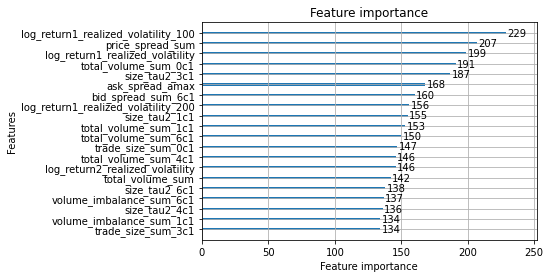

In [20]:
predictions_lgb2,model2,evals_result2= train_and_evaluate_lgb(train, test,params2,boost=10000)

In [21]:
train.shape

(428932, 250)

## NN用データ準備

In [22]:
from numpy.random import seed
seed(42)
import tensorflow as tf
tf.random.set_seed(42)
from tensorflow import keras
import numpy as np
from keras import backend as K
def root_mean_squared_per_error(y_true, y_pred):
         return K.sqrt(K.mean(K.square( (y_true - y_pred)/ y_true )))
    
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=20, verbose=0,
    mode='min',restore_best_weights=True)

plateau = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.2, patience=7, verbose=0,
    mode='min')

In [23]:
## kfold based on the knn++ algorithm

out_train = pd.read_csv('../input/optiver-realized-volatility-prediction/train.csv')
out_train = out_train.pivot(index='time_id', columns='stock_id', values='target')

#out_train[out_train.isna().any(axis=1)]
out_train = out_train.fillna(out_train.mean())
out_train.head()

# code to add the just the read data after first execution

# data separation based on knn ++
nfolds = 5 # number of folds
index = []
totDist = []
values = []
# generates a matriz with the values of 
mat = out_train.values

scaler = MinMaxScaler(feature_range=(-1, 1))
mat = scaler.fit_transform(mat)

nind = int(mat.shape[0]/nfolds) # number of individuals

# adds index in the last column
mat = np.c_[mat,np.arange(mat.shape[0])]


lineNumber = np.random.choice(np.array(mat.shape[0]), size=nfolds, replace=False)

lineNumber = np.sort(lineNumber)[::-1]

for n in range(nfolds):
    totDist.append(np.zeros(mat.shape[0]-nfolds))

# saves index
for n in range(nfolds):
    
    values.append([lineNumber[n]])    


s=[]
for n in range(nfolds):
    s.append(mat[lineNumber[n],:])
    
    mat = np.delete(mat, obj=lineNumber[n], axis=0)

for n in range(nind-1):    

    luck = np.random.uniform(0,1,nfolds)
    
    for cycle in range(nfolds):
         # saves the values of index           

        s[cycle] = np.matlib.repmat(s[cycle], mat.shape[0], 1)

        sumDist = np.sum( (mat[:,:-1] - s[cycle][:,:-1])**2 , axis=1)   
        totDist[cycle] += sumDist        
                
        # probabilities
        f = totDist[cycle]/np.sum(totDist[cycle]) # normalizing the totdist
        j = 0
        kn = 0
        for val in f:
            j += val        
            if (j > luck[cycle]): # the column was selected
                break
            kn +=1
        lineNumber[cycle] = kn
        
        # delete line of the value added    
        for n_iter in range(nfolds):
            
            totDist[n_iter] = np.delete(totDist[n_iter],obj=lineNumber[cycle], axis=0)
            j= 0
        
        s[cycle] = mat[lineNumber[cycle],:]
        values[cycle].append(int(mat[lineNumber[cycle],-1]))
        mat = np.delete(mat, obj=lineNumber[cycle], axis=0)


for n_mod in range(nfolds):
    values[n_mod] = out_train.index[values[n_mod]]

In [24]:
#colNames.remove('row_id')
train.replace([np.inf, -np.inf], np.nan,inplace=True)
test.replace([np.inf, -np.inf], np.nan,inplace=True)
qt_train = []
train_nn=train[colNames].copy()
test_nn=test[colNames].copy()
for col in colNames:
    #print(col)
    qt = QuantileTransformer(random_state=21,n_quantiles=2000, output_distribution='normal')
    train_nn[col] = qt.fit_transform(train_nn[[col]])
    test_nn[col] = qt.transform(test_nn[[col]])    
    qt_train.append(qt)

In [25]:
train_nn[['stock_id','time_id','target']]=train[['stock_id','time_id','target']]
test_nn[['stock_id','time_id']]=test[['stock_id','time_id']]

In [26]:
# making agg features
from sklearn.cluster import KMeans
train_p = pd.read_csv('../input/optiver-realized-volatility-prediction/train.csv')
train_p = train_p.pivot(index='time_id', columns='stock_id', values='target')

corr = train_p.corr()

ids = corr.index

kmeans = KMeans(n_clusters=7, random_state=0).fit(corr.values)
print(kmeans.labels_)

l = []
for n in range(7):
    l.append ( [ (x-1) for x in ( (ids+1)*(kmeans.labels_ == n)) if x > 0] )
    

mat = []
matTest = []

n = 0
for ind in l:
    print(ind)
    newDf = train_nn.loc[train_nn['stock_id'].isin(ind) ]
    newDf = newDf.groupby(['time_id']).agg(np.nanmean)
    newDf.loc[:,'stock_id'] = str(n)+'c1'
    mat.append ( newDf )
    
    newDf = test_nn.loc[test_nn['stock_id'].isin(ind) ]    
    newDf = newDf.groupby(['time_id']).agg(np.nanmean)
    newDf.loc[:,'stock_id'] = str(n)+'c1'
    matTest.append ( newDf )
    
    n+=1
    
mat1 = pd.concat(mat).reset_index()
mat1.drop(columns=['target'],inplace=True)

mat2 = pd.concat(matTest).reset_index()
mat2 = pd.concat([mat2,mat1.loc[mat1.time_id==5]])

[1 0 4 2 1 1 2 4 6 2 1 0 4 4 1 1 1 2 4 4 4 0 1 1 3 1 1 4 3 4 3 4 4 1 3 3 4
 3 4 1 4 1 4 4 1 0 4 4 1 0 0 3 3 3 2 0 2 4 1 4 4 1 4 1 0 3 3 0 3 0 6 5 3 3
 0 1 2 0 3 3 3 4 1 1 0 2 3 3 1 0 1 4 4 4 4 4 1 3 1 0 1 4 1 0 1 4 1 0 4 0 4
 0]
[1, 11, 22, 50, 55, 56, 62, 73, 76, 78, 84, 87, 96, 101, 112, 116, 122, 124, 126]
[0, 4, 5, 10, 15, 16, 17, 23, 26, 28, 29, 36, 42, 44, 48, 53, 66, 69, 72, 85, 94, 95, 100, 102, 109, 111, 113, 115, 118, 120]
[3, 6, 9, 18, 61, 63, 86, 97]
[27, 31, 33, 37, 38, 40, 58, 59, 60, 74, 75, 77, 82, 83, 88, 89, 90, 98, 99, 110]
[2, 7, 13, 14, 19, 20, 21, 30, 32, 34, 35, 39, 41, 43, 46, 47, 51, 52, 64, 67, 68, 70, 93, 103, 104, 105, 107, 108, 114, 119, 123, 125]
[81]
[8, 80]


In [27]:
nnn = ['time_id',
     'log_return1_realized_volatility_0c1',
     'log_return1_realized_volatility_1c1',     
     'log_return1_realized_volatility_3c1',
     'log_return1_realized_volatility_4c1',     
     'log_return1_realized_volatility_6c1',
     'total_volume_sum_0c1',
     'total_volume_sum_1c1', 
     'total_volume_sum_3c1',
     'total_volume_sum_4c1', 
     'total_volume_sum_6c1',
     'trade_size_sum_0c1',
     'trade_size_sum_1c1', 
     'trade_size_sum_3c1',
     'trade_size_sum_4c1', 
     'trade_size_sum_6c1',
     'trade_order_count_sum_0c1',
     'trade_order_count_sum_1c1',
     'trade_order_count_sum_3c1',
     'trade_order_count_sum_4c1',
     'trade_order_count_sum_6c1',      
     'price_spread_sum_0c1',
     'price_spread_sum_1c1',
     'price_spread_sum_3c1',
     'price_spread_sum_4c1',
     'price_spread_sum_6c1',   
     'bid_spread_sum_0c1',
     'bid_spread_sum_1c1',
     'bid_spread_sum_3c1',
     'bid_spread_sum_4c1',
     'bid_spread_sum_6c1',       
     'ask_spread_sum_0c1',
     'ask_spread_sum_1c1',
     'ask_spread_sum_3c1',
     'ask_spread_sum_4c1',
     'ask_spread_sum_6c1',   
     'volume_imbalance_sum_0c1',
     'volume_imbalance_sum_1c1',
     'volume_imbalance_sum_3c1',
     'volume_imbalance_sum_4c1',
     'volume_imbalance_sum_6c1',       
     'bid_ask_spread_sum_0c1',
     'bid_ask_spread_sum_1c1',
     'bid_ask_spread_sum_3c1',
     'bid_ask_spread_sum_4c1',
     'bid_ask_spread_sum_6c1',
     'size_tau2_0c1',
     'size_tau2_1c1',
     'size_tau2_3c1',
     'size_tau2_4c1',
     'size_tau2_6c1'] 

In [28]:
mat1 = mat1.pivot(index='time_id', columns='stock_id')
mat1.columns = ["_".join(x) for x in mat1.columns.ravel()]
mat1.reset_index(inplace=True)

mat2 = mat2.pivot(index='time_id', columns='stock_id')
mat2.columns = ["_".join(x) for x in mat2.columns.ravel()]
mat2.reset_index(inplace=True)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  


In [29]:
import gc
train_nn = pd.merge(train_nn,mat1[nnn],how='left',on='time_id')
test_nn = pd.merge(test_nn,mat2[nnn],how='left',on='time_id')
del mat1,mat2
del train,test
gc.collect()

22

In [30]:
test_nn.to_pickle('test_nn.pkl')
train_nn.to_pickle('train_nn.pkl')

## NN準備

In [31]:
#https://bignerdranch.com/blog/implementing-swish-activation-function-in-keras/
from keras.backend import sigmoid
def swish(x, beta = 1):
    return (x * sigmoid(beta * x))

from keras.utils.generic_utils import get_custom_objects
from keras.layers import Activation
get_custom_objects().update({'swish': Activation(swish)})

hidden_units = (128,64,32)
stock_embedding_size = 24

cat_data = train_nn['stock_id']

def base_model():
    
    # Each instance will consist of two inputs: a single user id, and a single movie id
    stock_id_input = keras.Input(shape=(1,), name='stock_id')
    num_input = keras.Input(shape=(246,), name='num_data')


    #embedding, flatenning and concatenating
    stock_embedded = keras.layers.Embedding(max(cat_data)+1, stock_embedding_size, 
                                           input_length=1, name='stock_embedding')(stock_id_input)
    stock_flattened = keras.layers.Flatten()(stock_embedded)
    out = keras.layers.Concatenate()([stock_flattened, num_input])
    
    # Add one or more hidden layers
    for n_hidden in hidden_units:

        out = keras.layers.Dense(n_hidden, activation='swish')(out)
        

    #out = keras.layers.Concatenate()([out, num_input])

    # A single output: our predicted rating
    out = keras.layers.Dense(1, activation='linear', name='prediction')(out)
    
    model = keras.Model(
    inputs = [stock_id_input, num_input],
    outputs = out,
    )
    
    return model

In [32]:
# Function to calculate the root mean squared percentage error
def rmspe(y_true, y_pred):
    return np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))

# Function to early stop with root mean squared percentage error
def feval_rmspe(y_pred, lgb_train):
    y_true = lgb_train.get_label()
    return 'RMSPE', rmspe(y_true, y_pred), False

### NN学習

In [33]:
target_name='target'
scores_folds = {}
model_name = 'NN'
pred_name = 'pred_{}'.format(model_name)

n_folds = 5
kf = model_selection.KFold(n_splits=n_folds, shuffle=True, random_state=2020)
scores_folds[model_name] = []
counter = 1

features_to_consider = list(train_nn)

features_to_consider.remove('time_id')
features_to_consider.remove('target')
try:
    features_to_consider.remove('pred_NN')
except:
    pass


train_nn[features_to_consider] = train_nn[features_to_consider].fillna(train_nn[features_to_consider].mean())
test_nn[features_to_consider] = test_nn[features_to_consider].fillna(train_nn[features_to_consider].mean())

train_nn[pred_name] = 0
test_nn[target_name] = 0
test_predictions_nn = np.zeros(test_nn.shape[0])

for n_count in range(n_folds):
    print('CV {}/{}'.format(counter, n_folds))
    
    indexes = np.arange(nfolds).astype(int)    
    indexes = np.delete(indexes,obj=n_count, axis=0) 
    
    indexes = np.r_[values[indexes[0]],values[indexes[1]],values[indexes[2]],values[indexes[3]]]
    
    X_train = train_nn.loc[train_nn.time_id.isin(indexes), features_to_consider]
    y_train = train_nn.loc[train_nn.time_id.isin(indexes), target_name]
    X_test = train_nn.loc[train_nn.time_id.isin(values[n_count]), features_to_consider]
    y_test = train_nn.loc[train_nn.time_id.isin(values[n_count]), target_name]
    
    #############################################################################################
    # NN
    #############################################################################################
    
    model = base_model()
    
    model.compile(
        keras.optimizers.Adam(learning_rate=0.006),
        loss=root_mean_squared_per_error
    )
    
    try:
        features_to_consider.remove('stock_id')
    except:
        pass
    
    num_data = X_train[features_to_consider]
    
    scaler = MinMaxScaler(feature_range=(-1, 1))         
    num_data = scaler.fit_transform(num_data.values)    
    
    cat_data = X_train['stock_id']    
    target =  y_train
    
    num_data_test = X_test[features_to_consider]
    num_data_test = scaler.transform(num_data_test.values)
    cat_data_test = X_test['stock_id']

    model.fit([cat_data, num_data], 
              target,               
              batch_size=2048,
              epochs=1000,
              validation_data=([cat_data_test, num_data_test], y_test),
              callbacks=[es, plateau],
              validation_batch_size=len(y_test),
              shuffle=True,
              verbose = 1)

    preds = model.predict([cat_data_test, num_data_test]).reshape(1,-1)[0]
    
    score = round(rmspe(y_true = y_test, y_pred = preds),5)
    print('Fold {} {}: {}'.format(counter, model_name, score))
    scores_folds[model_name].append(score)
    
    tt =scaler.transform(test_nn[features_to_consider].values)
    #test_nn[target_name] += model.predict([test_nn['stock_id'], tt]).reshape(1,-1)[0].clip(0,1e10)
    test_predictions_nn += model.predict([test_nn['stock_id'], tt]).reshape(1,-1)[0].clip(0,1e10)/n_folds
    #test[target_name] += model.predict([test['stock_id'], test[features_to_consider]]).reshape(1,-1)[0].clip(0,1e10)
       
    counter += 1
    features_to_consider.append('stock_id')

CV 1/5
Epoch 1/1000
168/168 [==============================] - 4s 20ms/step - loss: 20.5948 - val_loss: 1.1052
Epoch 2/1000
168/168 [==============================] - 3s 15ms/step - loss: 0.7277 - val_loss: 0.3305
Epoch 3/1000
168/168 [==============================] - 3s 18ms/step - loss: 0.5365 - val_loss: 0.4122
Epoch 4/1000
168/168 [==============================] - 3s 16ms/step - loss: 0.6615 - val_loss: 0.7144
Epoch 5/1000
168/168 [==============================] - 3s 16ms/step - loss: 0.6594 - val_loss: 0.7230
Epoch 6/1000
168/168 [==============================] - 3s 15ms/step - loss: 0.5760 - val_loss: 0.5564
Epoch 7/1000
168/168 [==============================] - 3s 15ms/step - loss: 0.6465 - val_loss: 0.2274
Epoch 8/1000
168/168 [==============================] - 3s 15ms/step - loss: 0.2509 - val_loss: 0.4112
Epoch 9/1000
168/168 [==============================] - 3s 15ms/step - loss: 0.3512 - val_loss: 0.2236
Epoch 10/1000
168/168 [==============================] - 3s 16ms/

# モデルアンサンブル

In [34]:
test_nn["row_id"] = test_nn["stock_id"].astype(str) + "-" + test_nn["time_id"].astype(str)

In [35]:
pred_lgb_m = predictions_lgb1*0.615+predictions_lgb2*0.385

In [36]:
test_nn[target_name] = test_predictions_nn*0.585 + pred_lgb_m*0.415

In [37]:
score = round(rmspe(y_true = train_nn[target_name].values, y_pred = train_nn[pred_name].values),5)
print('RMSPE {}: {} - Folds: {}'.format(model_name, score, scores_folds[model_name]))

RMSPE NN: 1.0 - Folds: [0.20694, 0.21313, 0.20903, 0.21494, 0.2128]


In [38]:
del pred_lgb_m
del predictions_lgb1
del predictions_lgb2
del test_predictions_nn

# 提出用データ準備

In [39]:
display(test_nn[['row_id', target_name]].head(3))
test_nn[['row_id', target_name]].to_csv('submission.csv',index = False)
#test[['row_id', target_name]].to_csv('submission.csv',index = False)
#kmeans N=5 [0.2101, 0.21399, 0.20923, 0.21398, 0.21175]

,row_id,target
0,0-4,0.003528
1,0-32,0.002189
2,0-34,0.002189


# 分析

## 学習データ相関係数

In [40]:
train_temp.head()

,stock_id,time_id,target,row_id,wap1_sum,wap1_std,wap2_sum,wap2_std,wap3_sum,wap3_std,wap4_sum,wap4_std,log_return1_realized_volatility,log_return2_realized_volatility,log_return3_realized_volatility,log_return4_realized_volatility,wap_balance_sum,wap_balance_amax,price_spread_sum,price_spread_amax,price_spread2_sum,price_spread2_amax,bid_spread_sum,bid_spread_amax,ask_spread_sum,ask_spread_amax,total_volume_sum,total_volume_amax,volume_imbalance_sum,volume_imbalance_amax,bid_ask_spread_sum,bid_ask_spread_amax,bollinger_band_balance1_sum,bollinger_band_balance1_amax,log_return1_realized_volatility_500,log_return2_realized_volatility_500,log_return3_realized_volatility_500,log_return4_realized_volatility_500,log_return1_realized_volatility_400,log_return2_realized_volatility_400,log_return3_realized_volatility_400,log_return4_realized_volatility_400,log_return1_realized_volatility_300,log_return2_realized_volatility_300,log_return3_realized_volatility_300,log_return4_realized_volatility_300,log_return1_realized_volatility_200,log_return2_realized_volatility_200,log_return3_realized_volatility_200,log_return4_realized_volatility_200,log_return1_realized_volatility_100,log_return2_realized_volatility_100,log_return3_realized_volatility_100,log_return4_realized_volatility_100,trade_log_return_realized_volatility,trade_seconds_in_bucket_count_unique,trade_size_sum,trade_size_amax,trade_size_amin,trade_order_count_sum,trade_order_count_amax,trade_amount_sum,trade_amount_amax,trade_amount_amin,trade_tendency,trade_f_max,trade_f_min,trade_df_max,trade_df_min,trade_abs_diff,trade_energy,trade_iqr_p,trade_abs_diff_v,trade_energy_v,trade_iqr_p_v,trade_log_return_realized_volatility_500,trade_seconds_in_bucket_count_unique_500,trade_size_sum_500,trade_order_count_sum_500,trade_log_return_realized_volatility_400,trade_seconds_in_bucket_count_unique_400,trade_size_sum_400,trade_order_count_sum_400,trade_log_return_realized_volatility_300,trade_seconds_in_bucket_count_unique_300,trade_size_sum_300,trade_order_count_sum_300,trade_log_return_realized_volatility_200,trade_seconds_in_bucket_count_unique_200,trade_size_sum_200,trade_order_count_sum_200,trade_log_return_realized_volatility_100,trade_seconds_in_bucket_count_unique_100,trade_size_sum_100,trade_order_count_sum_100,log_return1_realized_volatility_mean_stock,log_return1_realized_volatility_std_stock,log_return1_realized_volatility_max_stock,log_return1_realized_volatility_min_stock,log_return2_realized_volatility_mean_stock,log_return2_realized_volatility_std_stock,log_return2_realized_volatility_max_stock,log_return2_realized_volatility_min_stock,log_return1_realized_volatility_400_mean_stock,log_return1_realized_volatility_400_std_stock,log_return1_realized_volatility_400_max_stock,log_return1_realized_volatility_400_min_stock,log_return2_realized_volatility_400_mean_stock,log_return2_realized_volatility_400_std_stock,log_return2_realized_volatility_400_max_stock,log_return2_realized_volatility_400_min_stock,log_return1_realized_volatility_300_mean_stock,log_return1_realized_volatility_300_std_stock,log_return1_realized_volatility_300_max_stock,log_return1_realized_volatility_300_min_stock,log_return2_realized_volatility_300_mean_stock,log_return2_realized_volatility_300_std_stock,log_return2_realized_volatility_300_max_stock,log_return2_realized_volatility_300_min_stock,log_return1_realized_volatility_200_mean_stock,log_return1_realized_volatility_200_std_stock,log_return1_realized_volatility_200_max_stock,log_return1_realized_volatility_200_min_stock,log_return2_realized_volatility_200_mean_stock,log_return2_realized_volatility_200_std_stock,log_return2_realized_volatility_200_max_stock,log_return2_realized_volatility_200_min_stock,trade_log_return_realized_volatility_mean_stock,trade_log_return_realized_volatility_std_stock,trade_log_return_realized_volatility_max_stock,trade_log_return_realized_volatility_min_stock,trade_log_return_realized_volatility_400_mean_stock,trade_log_ret

<AxesSubplot:>

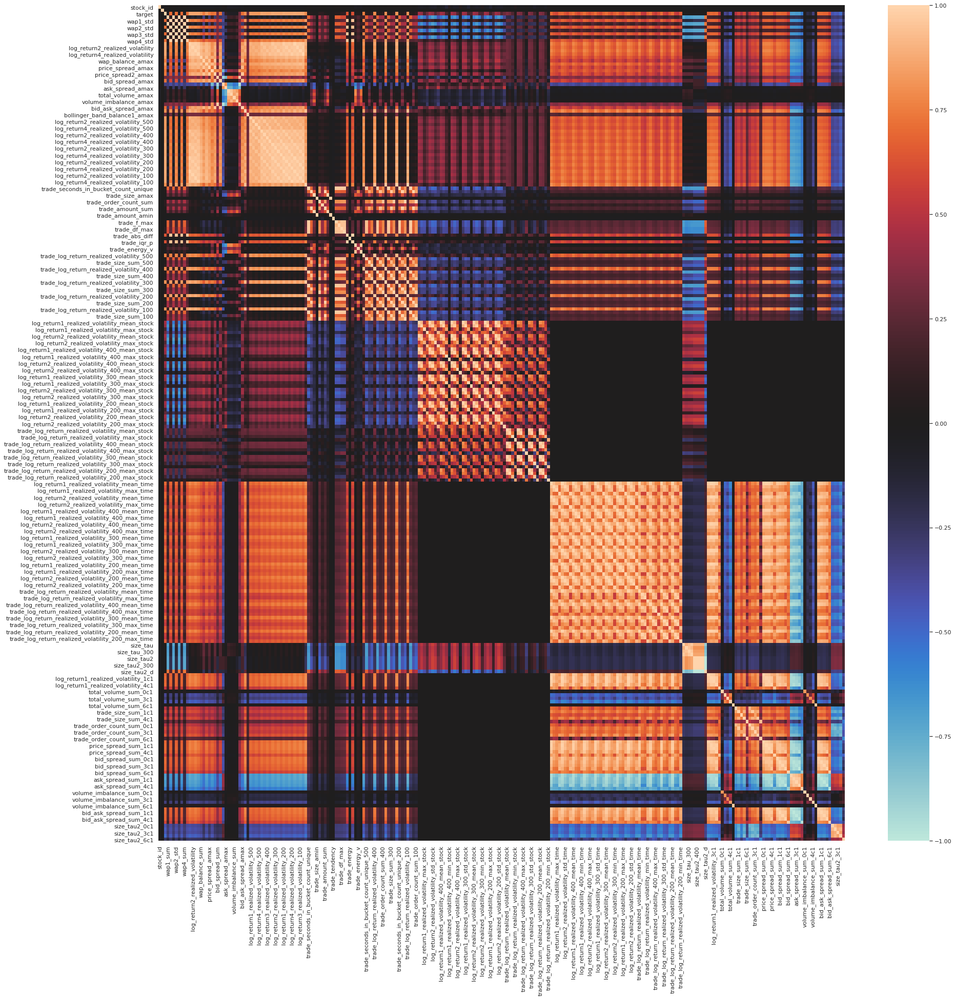

In [41]:
corr = train_temp.corr()
sns.set(rc = {'figure.figsize':(30,30)})
sns.heatmap(corr,center=0)

In [42]:
corr.head()

,stock_id,time_id,target,wap1_sum,wap1_std,wap2_sum,wap2_std,wap3_sum,wap3_std,wap4_sum,wap4_std,log_return1_realized_volatility,log_return2_realized_volatility,log_return3_realized_volatility,log_return4_realized_volatility,wap_balance_sum,wap_balance_amax,price_spread_sum,price_spread_amax,price_spread2_sum,price_spread2_amax,bid_spread_sum,bid_spread_amax,ask_spread_sum,ask_spread_amax,total_volume_sum,total_volume_amax,volume_imbalance_sum,volume_imbalance_amax,bid_ask_spread_sum,bid_ask_spread_amax,bollinger_band_balance1_sum,bollinger_band_balance1_amax,log_return1_realized_volatility_500,log_return2_realized_volatility_500,log_return3_realized_volatility_500,log_return4_realized_volatility_500,log_return1_realized_volatility_400,log_return2_realized_volatility_400,log_return3_realized_volatility_400,log_return4_realized_volatility_400,log_return1_realized_volatility_300,log_return2_realized_volatility_300,log_return3_realized_volatility_300,log_return4_realized_volatility_300,log_return1_realized_volatility_200,log_return2_realized_volatility_200,log_return3_realized_volatility_200,log_return4_realized_volatility_200,log_return1_realized_volatility_100,log_return2_realized_volatility_100,log_return3_realized_volatility_100,log_return4_realized_volatility_100,trade_log_return_realized_volatility,trade_seconds_in_bucket_count_unique,trade_size_sum,trade_size_amax,trade_size_amin,trade_order_count_sum,trade_order_count_amax,trade_amount_sum,trade_amount_amax,trade_amount_amin,trade_tendency,trade_f_max,trade_f_min,trade_df_max,trade_df_min,trade_abs_diff,trade_energy,trade_iqr_p,trade_abs_diff_v,trade_energy_v,trade_iqr_p_v,trade_log_return_realized_volatility_500,trade_seconds_in_bucket_count_unique_500,trade_size_sum_500,trade_order_count_sum_500,trade_log_return_realized_volatility_400,trade_seconds_in_bucket_count_unique_400,trade_size_sum_400,trade_order_count_sum_400,trade_log_return_realized_volatility_300,trade_seconds_in_bucket_count_unique_300,trade_size_sum_300,trade_order_count_sum_300,trade_log_return_realized_volatility_200,trade_seconds_in_bucket_count_unique_200,trade_size_sum_200,trade_order_count_sum_200,trade_log_return_realized_volatility_100,trade_seconds_in_bucket_count_unique_100,trade_size_sum_100,trade_order_count_sum_100,log_return1_realized_volatility_mean_stock,log_return1_realized_volatility_std_stock,log_return1_realized_volatility_max_stock,log_return1_realized_volatility_min_stock,log_return2_realized_volatility_mean_stock,log_return2_realized_volatility_std_stock,log_return2_realized_volatility_max_stock,log_return2_realized_volatility_min_stock,log_return1_realized_volatility_400_mean_stock,log_return1_realized_volatility_400_std_stock,log_return1_realized_volatility_400_max_stock,log_return1_realized_volatility_400_min_stock,log_return2_realized_volatility_400_mean_stock,log_return2_realized_volatility_400_std_stock,log_return2_realized_volatility_400_max_stock,log_return2_realized_volatility_400_min_stock,log_return1_realized_volatility_300_mean_stock,log_return1_realized_volatility_300_std_stock,log_return1_realized_volatility_300_max_stock,log_return1_realized_volatility_300_min_stock,log_return2_realized_volatility_300_mean_stock,log_return2_realized_volatility_300_std_stock,log_return2_realized_volatility_300_max_stock,log_return2_realized_volatility_300_min_stock,log_return1_realized_volatility_200_mean_stock,log_return1_realized_volatility_200_std_stock,log_return1_realized_volatility_200_max_stock,log_return1_realized_volatility_200_min_stock,log_return2_realized_volatility_200_mean_stock,log_return2_realized_volatility_200_std_stock,log_return2_realized_volatility_200_max_stock,log_return2_realized_volatility_200_min_stock,trade_log_return_realized_volatility_mean_stock,trade_log_return_realized_volatility_std_stock,trade_log_return_realized_volatility_max_stock,trade_log_return_realized_volatility_min_stock,trade_log_return_realized_volatility_400_mean_stock,trade_log_return_rea

In [43]:
corr_temp = pd.DataFrame()
corr_temp["target"] = corr["target"]
corr_temp["targe_abs"] = corr["target"].abs()
corr_temp.to_pickle('train_target_corr.pkl')
corr_temp.head()

,target,targe_abs
stock_id,-0.021637,0.021637
time_id,-0.010331,0.010331
target,1.000000,1.000000
wap1_sum,-0.054740,0.054740
wap1_std,0.698705,0.698705


In [44]:
pd.set_option('display.max_rows', 80)
corr_temp[corr_temp["targe_abs"] < 0.1].sort_values

<bound method DataFrame.sort_values of                                                       target  targe_abs
stock_id                                           -0.021637   0.021637
time_id                                            -0.010331   0.010331
wap1_sum                                           -0.054740   0.054740
wap2_sum                                           -0.054748   0.054748
wap3_sum                                           -0.054720   0.054720
wap4_sum                                           -0.054706   0.054706
ask_spread_amax                                     0.099377   0.099377
total_volume_sum                                   -0.063976   0.063976
total_volume_amax                                  -0.050596   0.050596
volume_imbalance_sum                               -0.049170   0.049170
volume_imbalance_amax                              -0.031500   0.031500
trade_seconds_in_bucket_count_unique                0.043729   0.043729
trade_size_sum           

In [45]:
del corr_temp
del corr

## LightGMBモデル１

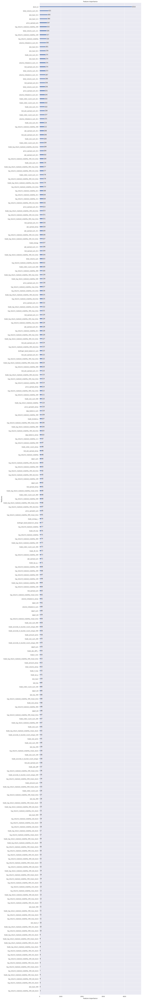

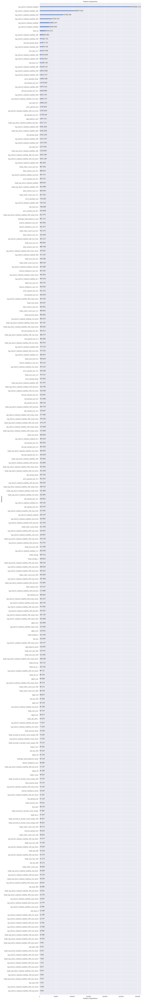

In [46]:
import matplotlib.pyplot as plt
fig,ax =plt.subplots(figsize=(15,150))
lgb.plot_importance(model1,ax=ax)
plt.show()
fig,ax =plt.subplots(figsize=(15,150))
lgb.plot_importance(model1,ax=ax,importance_type="gain")
plt.show()

Plotting metrics recorded during training...


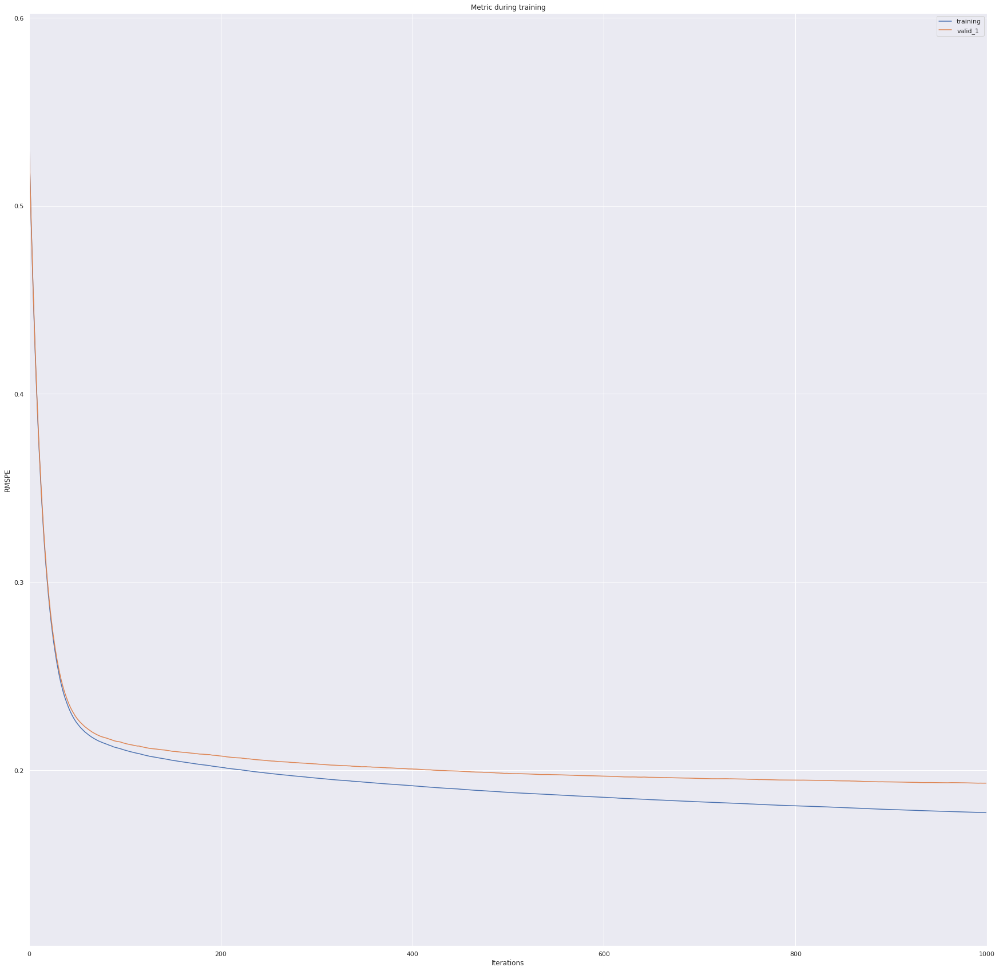

Plotting metrics recorded during training...


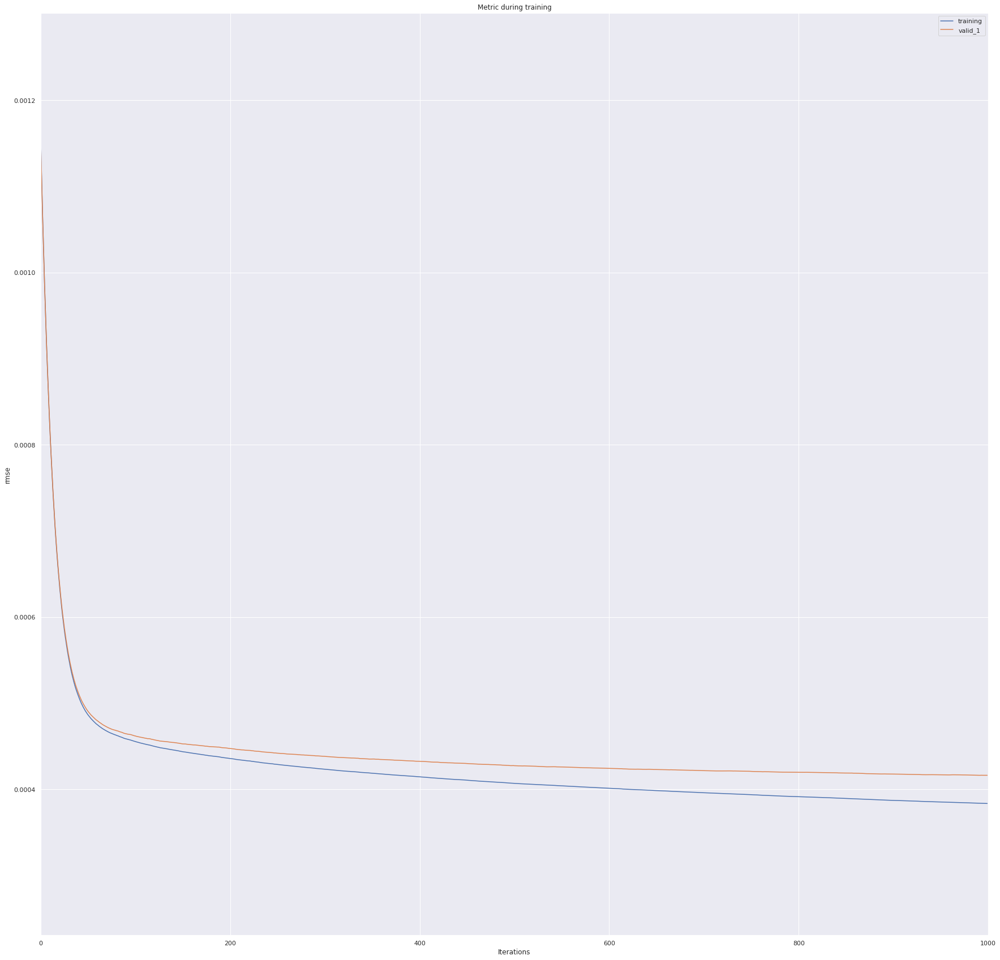

In [47]:
print('Plotting metrics recorded during training...')
ax = lgb.plot_metric(evals_result1, metric='RMSPE')
plt.show()
print('Plotting metrics recorded during training...')
ax = lgb.plot_metric(evals_result1, metric='rmse')
plt.show()

In [48]:
features = [col for col in train_temp.columns if col not in {"time_id", "target", "row_id"}]
# feature importanceを表示
importance = pd.DataFrame(model1.feature_importance(importance_type='split'), index=features, columns=['importance'])
importance = importance.sort_values('importance', ascending=False)
importance.to_pickle('lightGBM_model1_importance_split.pkl')
importance.head()

,importance
stock_id,4354
total_volume_sum_0c1,415
size_tau2_3c1,385
size_tau2_1c1,366
price_spread_sum,347


In [49]:
features = [col for col in train_temp.columns if col not in {"time_id", "target", "row_id"}]
# feature importanceを表示
importance = pd.DataFrame(model1.feature_importance(importance_type='gain'), index=features, columns=['importance'])
importance = importance.sort_values('importance', ascending=False)
importance.to_pickle('lightGBM_model1_importance_gain.pkl')
importance.head()

,importance
log_return1_realized_volatility,282868.218863
log_return1_realized_volatility_100,106971.624084
log_return1_realized_volatility_200,72708.779738
log_return1_realized_volatility_300,37126.227150
log_return2_realized_volatility,29683.246623


## LightGMBモデル2

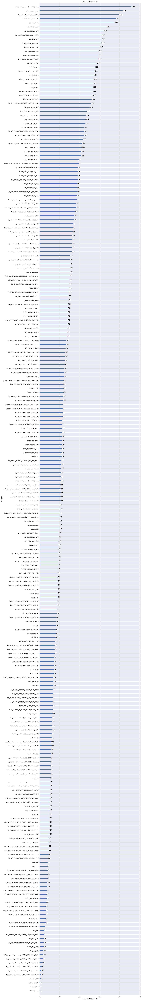

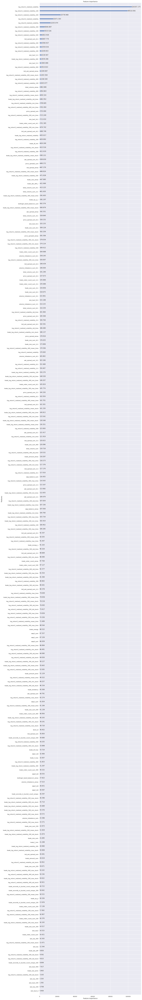

In [50]:
fig,ax =plt.subplots(figsize=(15,150))
lgb.plot_importance(model2,ax=ax)
plt.show()
fig,ax =plt.subplots(figsize=(15,150))
lgb.plot_importance(model2,ax=ax,importance_type="gain")
plt.show()


Plotting metrics recorded during training...


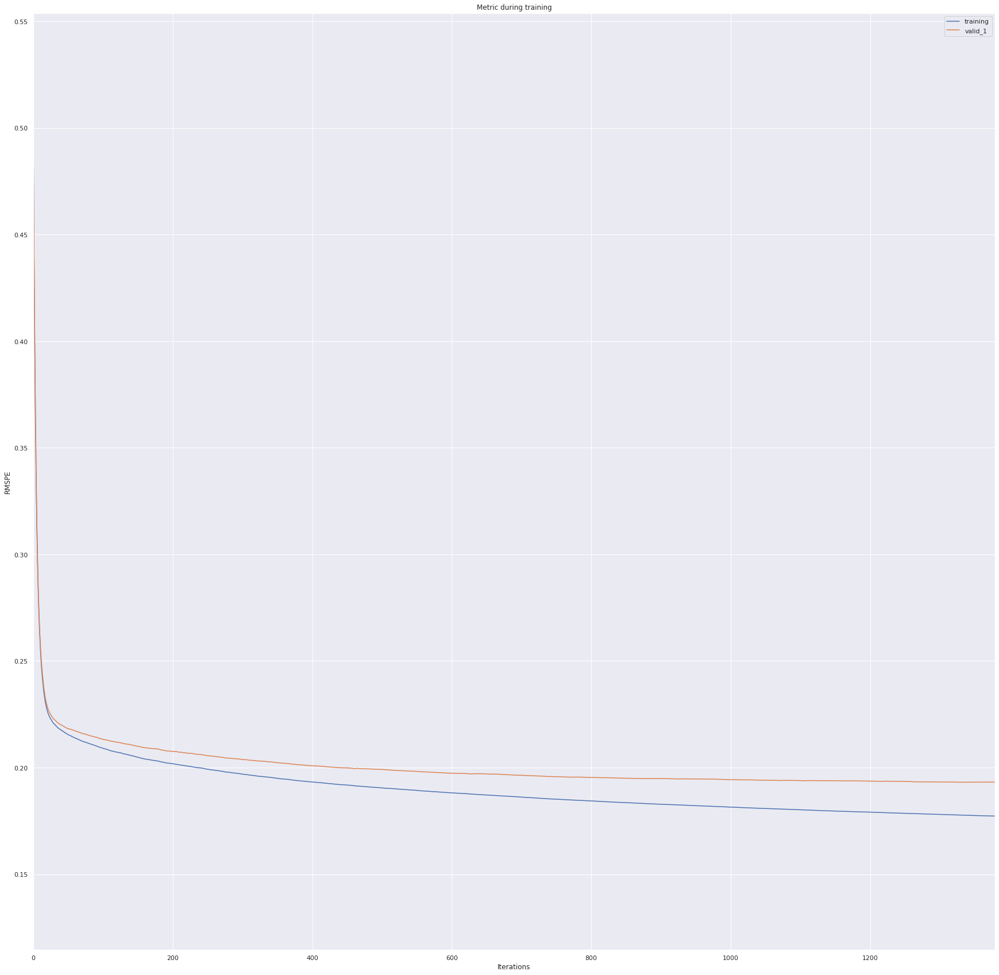

Plotting metrics recorded during training...


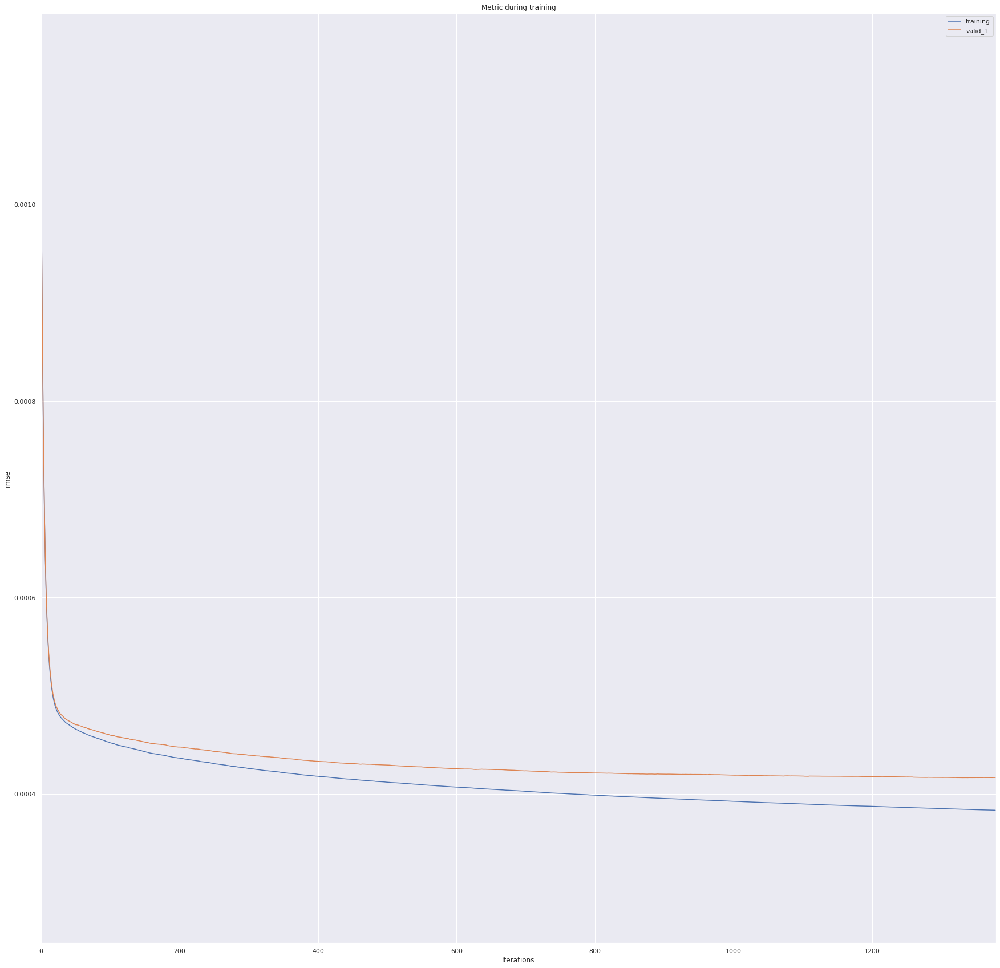

In [51]:
print('Plotting metrics recorded during training...')
ax = lgb.plot_metric(evals_result2, metric='RMSPE')
plt.show()
print('Plotting metrics recorded during training...')
ax = lgb.plot_metric(evals_result2, metric='rmse')
plt.show()

In [52]:
features = [col for col in train_temp.columns if col not in {"time_id", "target", "row_id"}]
# feature importanceを表示
importance = pd.DataFrame(model2.feature_importance(importance_type='split'), index=features, columns=['importance'])
importance = importance.sort_values('importance', ascending=False)
importance.to_pickle('lightGBM_model2_importance_split.pkl')
importance.head()

,importance
log_return1_realized_volatility_100,229
price_spread_sum,207
log_return1_realized_volatility,199
total_volume_sum_0c1,191
size_tau2_3c1,187


In [53]:
importance = pd.DataFrame(model2.feature_importance(importance_type='gain'), index=features, columns=['importance'])
importance = importance.sort_values('importance', ascending=False)
importance.to_pickle('lightGBM_model2_importance_gain.pkl')
display(importance)


,importance
log_return1_realized_volatility,104307.274681
log_return1_realized_volatility_100,99510.056423
log_return1_realized_volatility_200,23778.908468
log_return2_realized_volatility,15471.303451
log_return4_realized_volatility,12203.069962
...,...
size_tau_300,1.520229
size_tau2_200,1.391896
size_tau_200,0.768462
size_tau2_d,0.463877


In [54]:
del importance

## shap分析

In [55]:
import shap
shap.initjs()
explainer = shap.TreeExplainer(model1)
explainer2 = shap.TreeExplainer(model2)

In [56]:
del model1
del model2

In [57]:
features = [col for col in train_temp.columns if col not in {"time_id", "target", "row_id"}]
train_temp1 = train_temp[features]

In [58]:
del train_temp
del test_temp

In [59]:
%%time
shap_values = explainer.shap_values(train_temp1)
#shap_values2 = explainer.shap_values(train_temp1) 

CPU times: user 1h 37min 48s, sys: 4.67 s, total: 1h 37min 53s
Wall time: 49min 2s


### summery plot

LightGBM model1


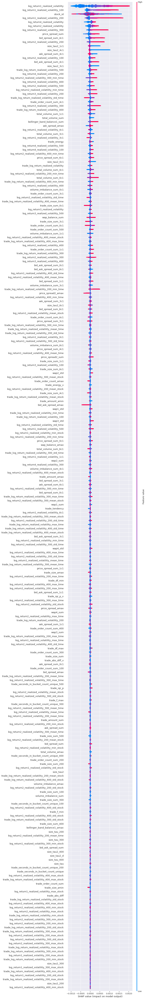

In [60]:
print("LightGBM model1")
shap.summary_plot(shap_values=shap_values,
                  features=train_temp1,
                  feature_names=train_temp1.columns,
                  max_display=train_temp1.shape[1])
#print("LightGBM model2")
#shap.summary_plot(shap_values=shap_values,
#                  features=train_temp1,
#                  feature_names=train_temp1.columns,
#                  max_display=train_temp1.shape[1])

### summery plot2

LightGBM model1


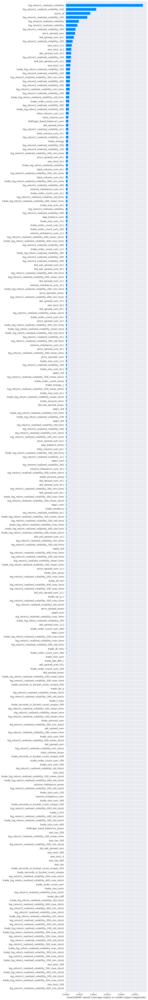

In [61]:
print("LightGBM model1")
shap.summary_plot(shap_values=shap_values,
                  features=train_temp1,
                  feature_names=train_temp1.columns,
                  plot_type='bar',
                  max_display=train_temp1.shape[1])
#prnt("LightGBM model2")
#shap.summary_plot(shap_values=shap_values2,
#                  features=train_temp1,
#                  feature_names=train_temp1.columns,
#                  plot_type='bar',
#                  max_display=train_temp1.shape[1])

### dependence plot(shap_value vs features)

features =  stock_id
LightGBM model1


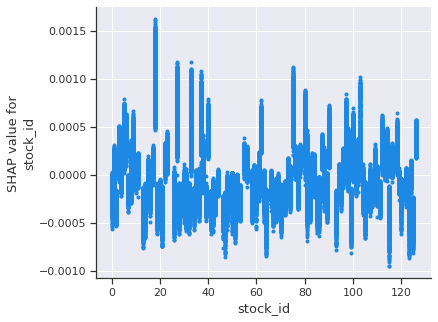

features =  wap1_sum
LightGBM model1


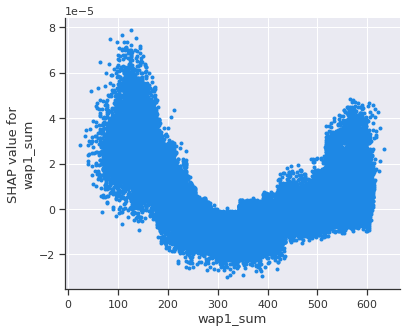

features =  wap1_std
LightGBM model1


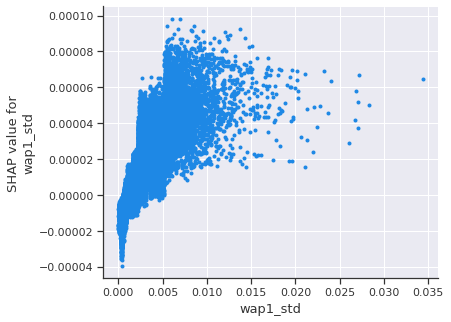

features =  wap2_sum
LightGBM model1


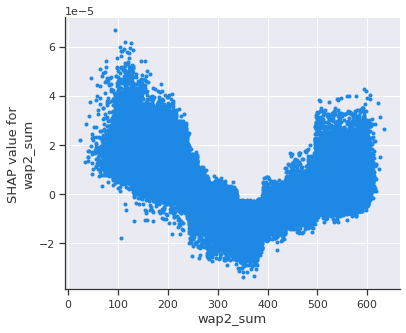

features =  wap2_std
LightGBM model1


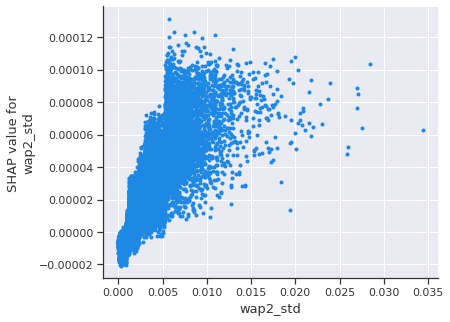

features =  wap3_sum
LightGBM model1


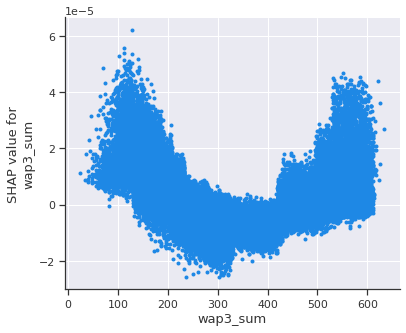

features =  wap3_std
LightGBM model1


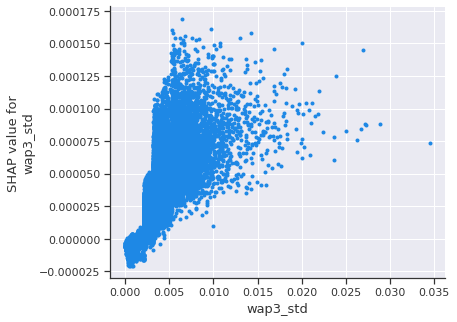

features =  wap4_sum
LightGBM model1


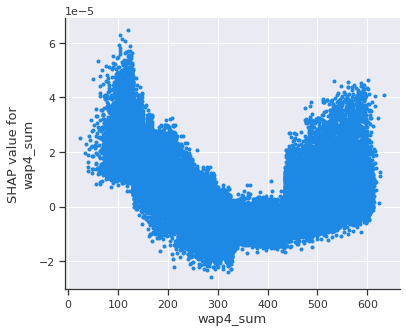

features =  wap4_std
LightGBM model1


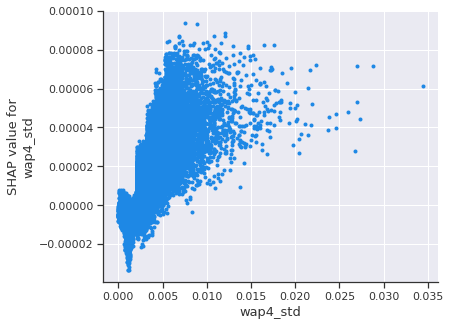

features =  log_return1_realized_volatility
LightGBM model1


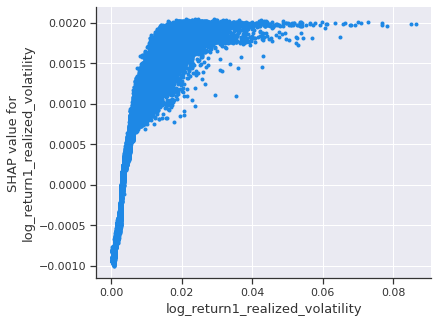

features =  log_return2_realized_volatility
LightGBM model1


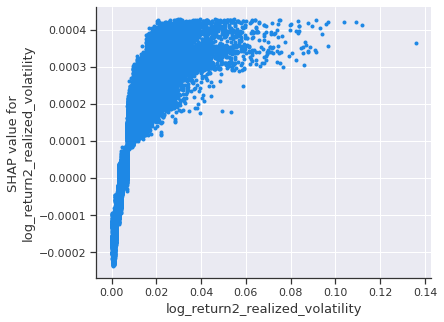

features =  log_return3_realized_volatility
LightGBM model1


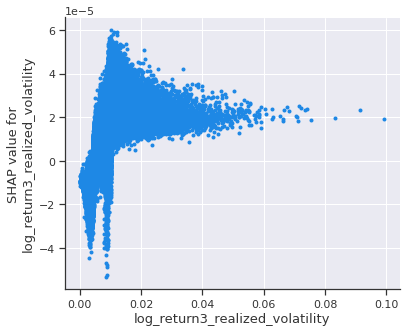

features =  log_return4_realized_volatility
LightGBM model1


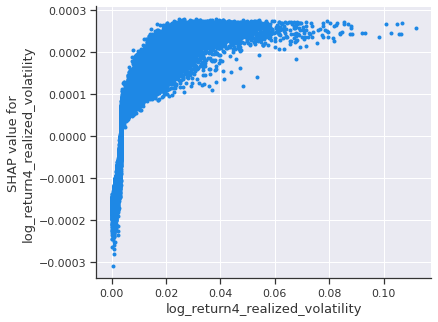

features =  wap_balance_sum
LightGBM model1


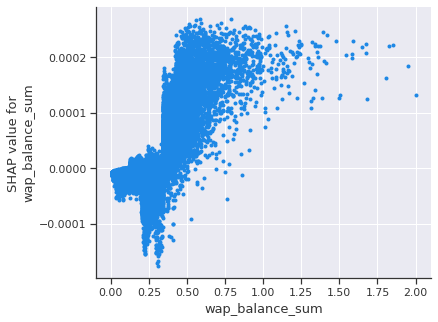

features =  wap_balance_amax
LightGBM model1


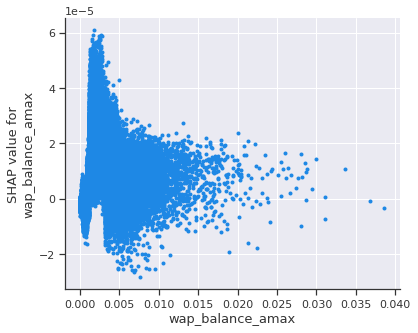

features =  price_spread_sum
LightGBM model1


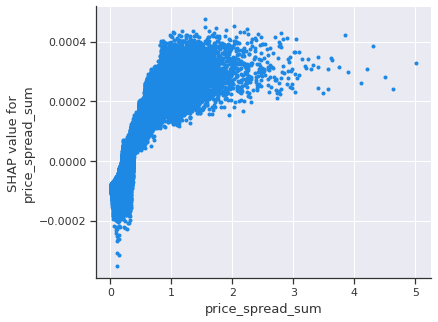

features =  price_spread_amax
LightGBM model1


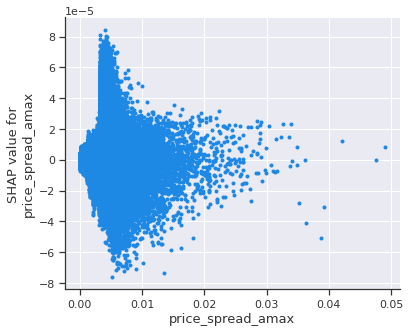

features =  price_spread2_sum
LightGBM model1


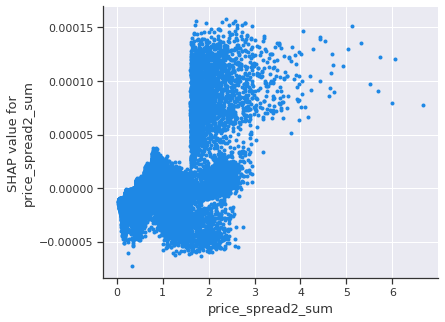

features =  price_spread2_amax
LightGBM model1


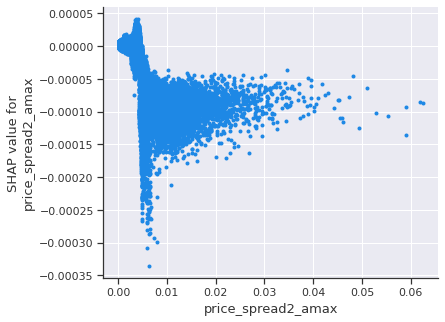

features =  bid_spread_sum
LightGBM model1


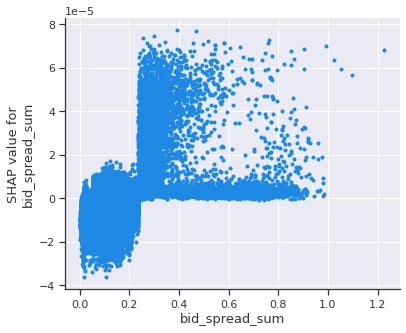

features =  bid_spread_amax
LightGBM model1


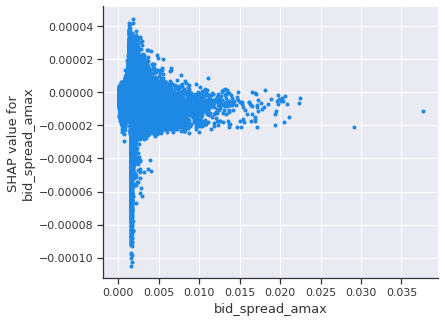

features =  ask_spread_sum
LightGBM model1


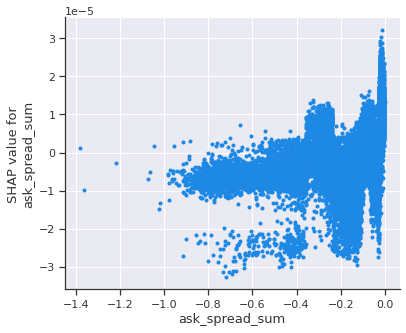

features =  ask_spread_amax
LightGBM model1


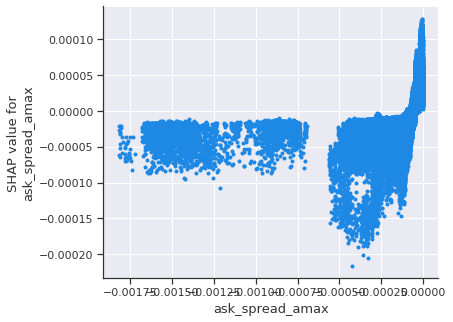

features =  total_volume_sum
LightGBM model1


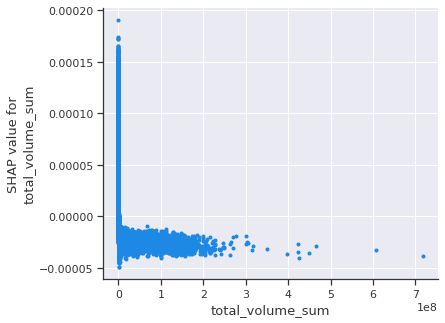

features =  total_volume_amax
LightGBM model1


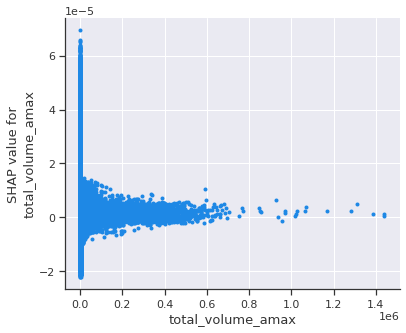

features =  volume_imbalance_sum
LightGBM model1


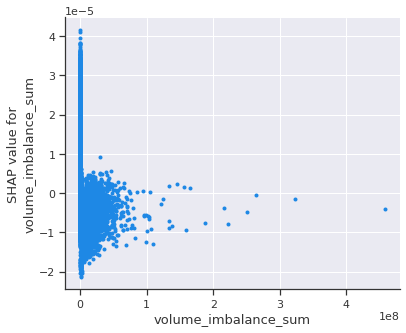

features =  volume_imbalance_amax
LightGBM model1


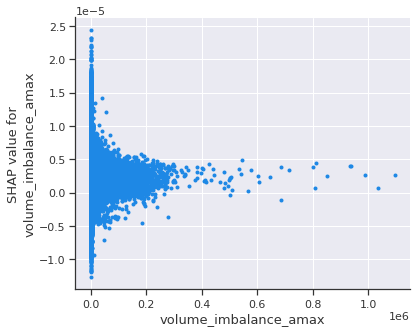

features =  bid_ask_spread_sum
LightGBM model1


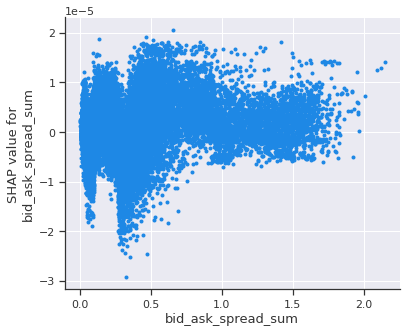

features =  bid_ask_spread_amax
LightGBM model1


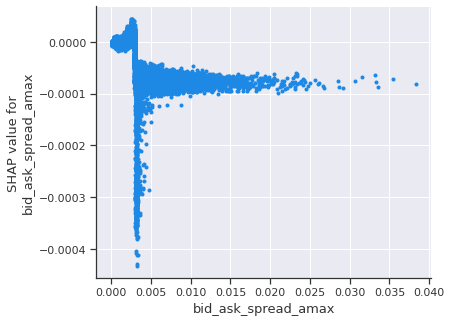

features =  bollinger_band_balance1_sum
LightGBM model1


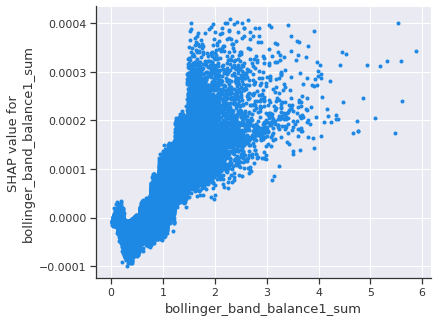

features =  bollinger_band_balance1_amax
LightGBM model1


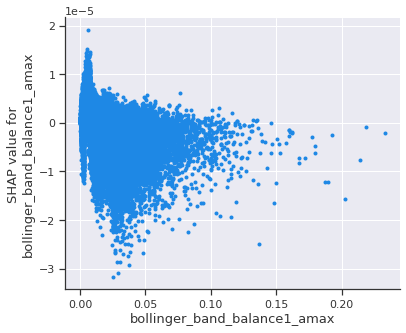

features =  log_return1_realized_volatility_500
LightGBM model1


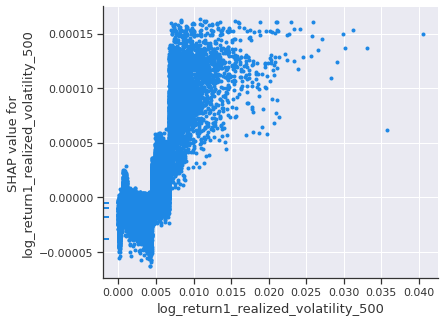

features =  log_return2_realized_volatility_500
LightGBM model1


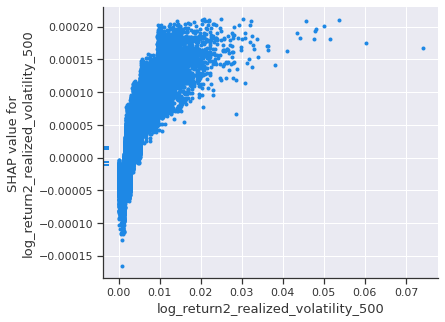

features =  log_return3_realized_volatility_500
LightGBM model1


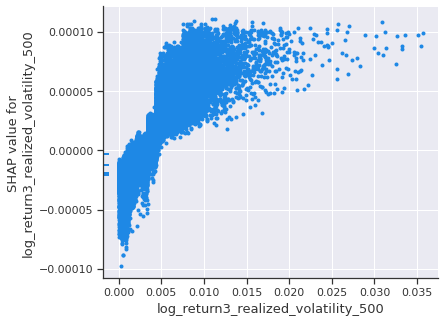

features =  log_return4_realized_volatility_500
LightGBM model1


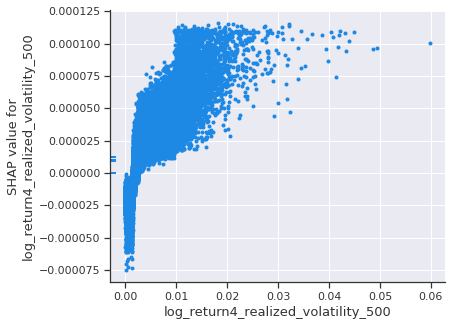

features =  log_return1_realized_volatility_400
LightGBM model1


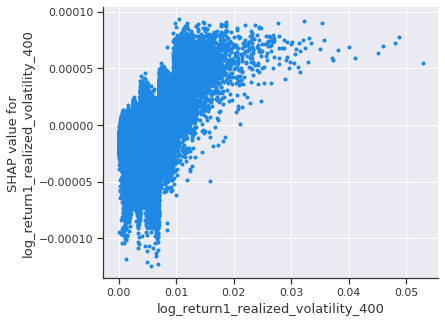

features =  log_return2_realized_volatility_400
LightGBM model1


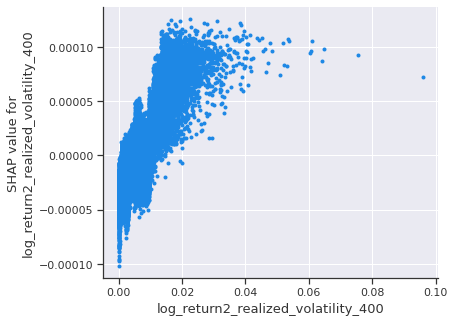

features =  log_return3_realized_volatility_400
LightGBM model1


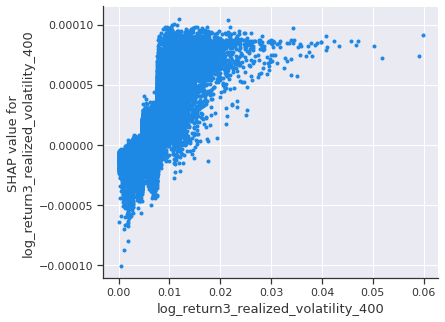

features =  log_return4_realized_volatility_400
LightGBM model1


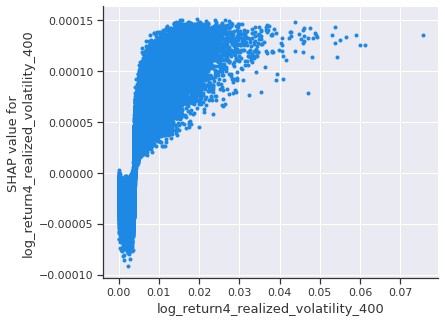

features =  log_return1_realized_volatility_300
LightGBM model1


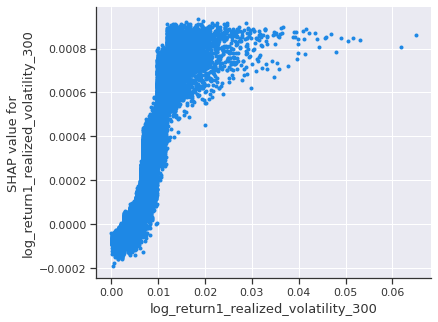

features =  log_return2_realized_volatility_300
LightGBM model1


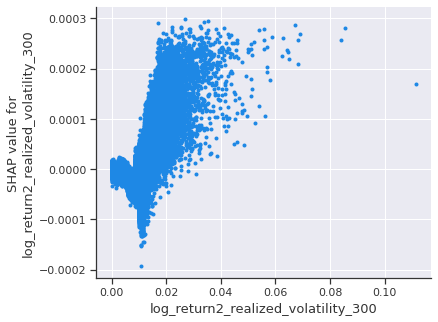

features =  log_return3_realized_volatility_300
LightGBM model1


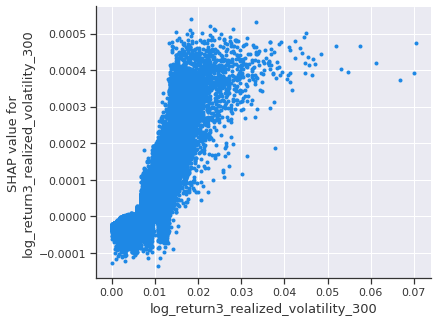

features =  log_return4_realized_volatility_300
LightGBM model1


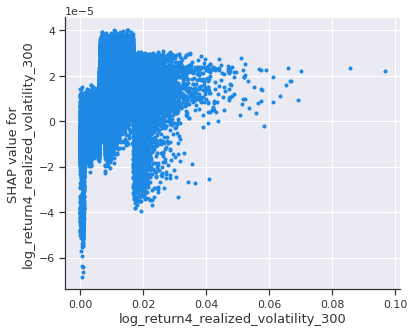

features =  log_return1_realized_volatility_200
LightGBM model1


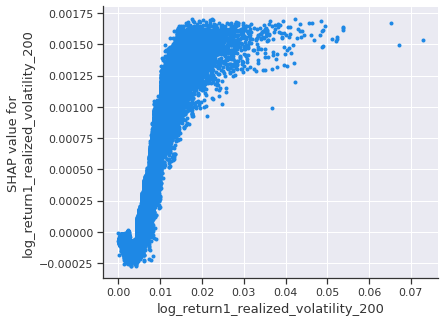

features =  log_return2_realized_volatility_200
LightGBM model1


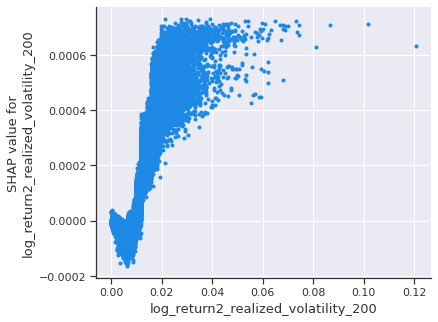

features =  log_return3_realized_volatility_200
LightGBM model1


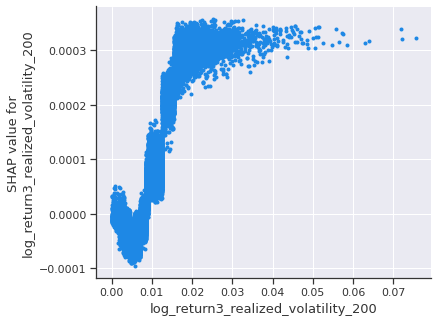

features =  log_return4_realized_volatility_200
LightGBM model1


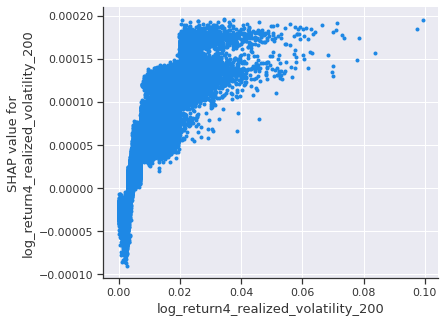

features =  log_return1_realized_volatility_100
LightGBM model1


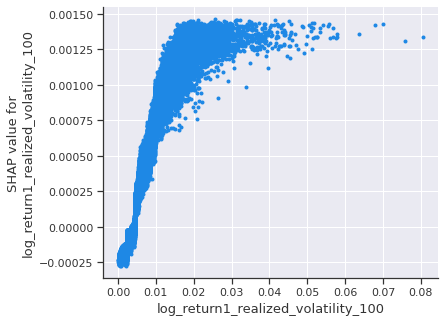

features =  log_return2_realized_volatility_100
LightGBM model1


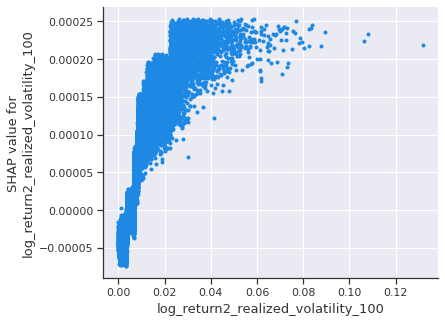

features =  log_return3_realized_volatility_100
LightGBM model1


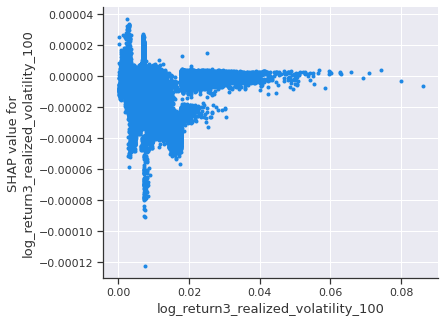

features =  log_return4_realized_volatility_100
LightGBM model1


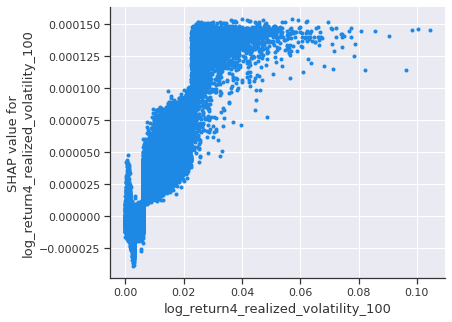

features =  trade_log_return_realized_volatility
LightGBM model1


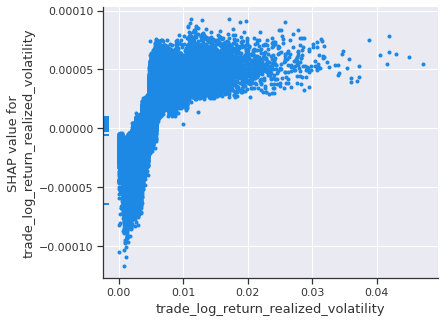

features =  trade_seconds_in_bucket_count_unique
LightGBM model1


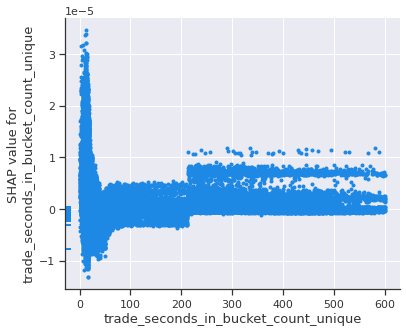

features =  trade_size_sum
LightGBM model1


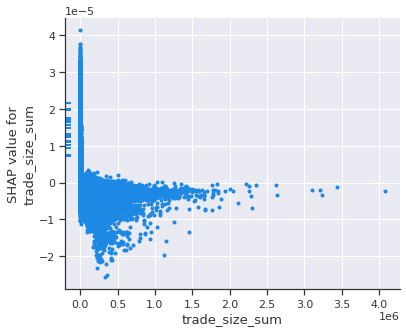

features =  trade_size_amax
LightGBM model1


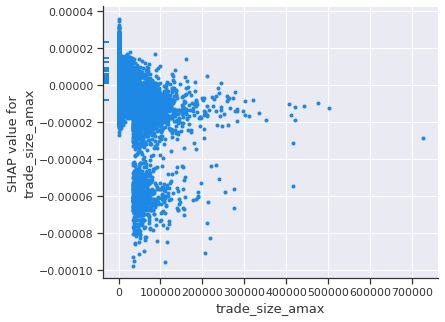

features =  trade_size_amin
LightGBM model1


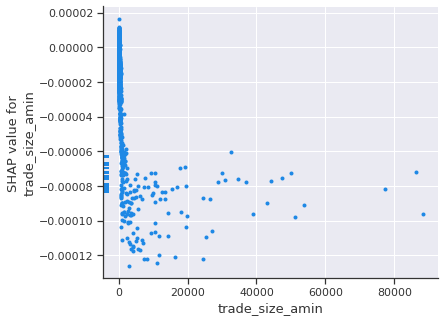

features =  trade_order_count_sum
LightGBM model1


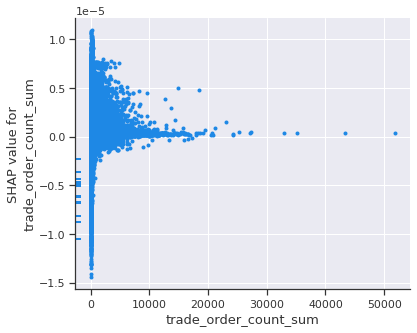

features =  trade_order_count_amax
LightGBM model1


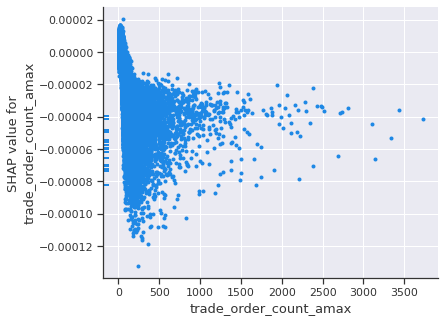

features =  trade_amount_sum
LightGBM model1


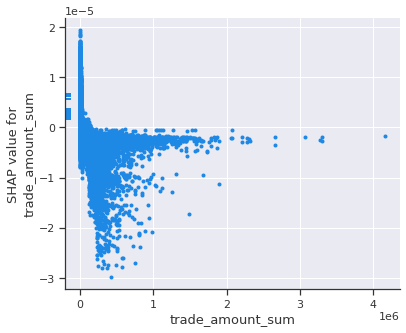

features =  trade_amount_amax
LightGBM model1


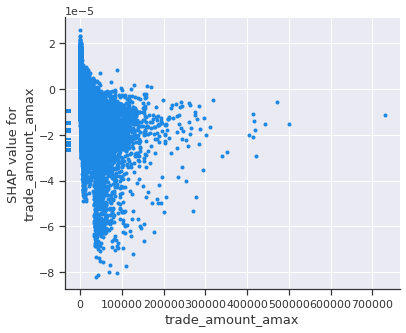

features =  trade_amount_amin
LightGBM model1


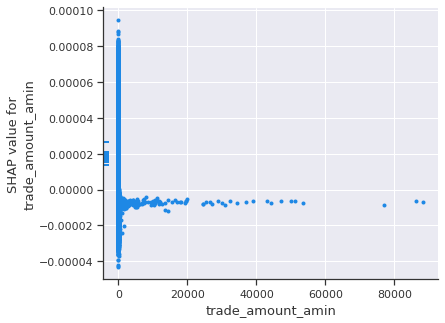

features =  trade_tendency
LightGBM model1


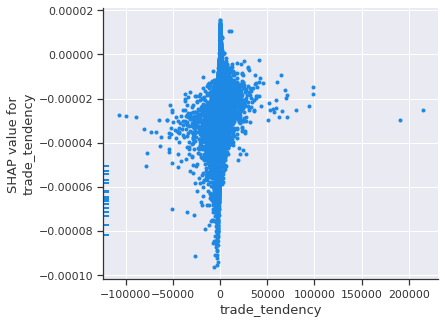

features =  trade_f_max
LightGBM model1


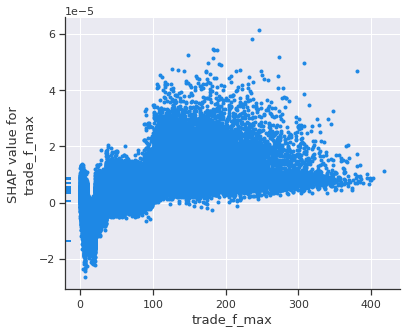

features =  trade_f_min
LightGBM model1


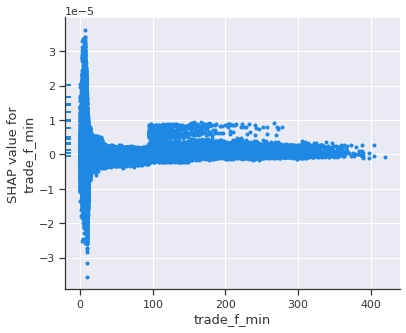

features =  trade_df_max
LightGBM model1


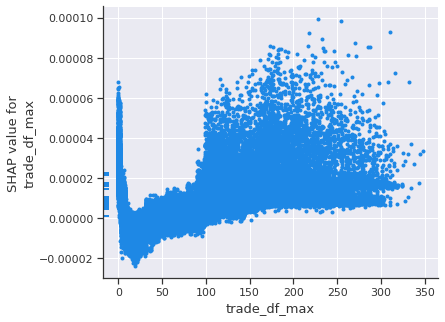

features =  trade_df_min
LightGBM model1


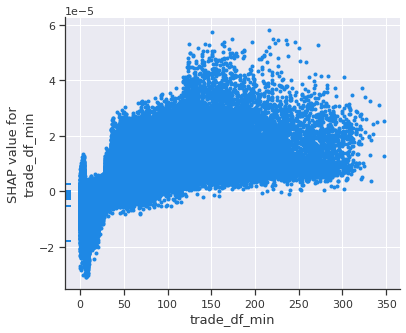

features =  trade_abs_diff
LightGBM model1


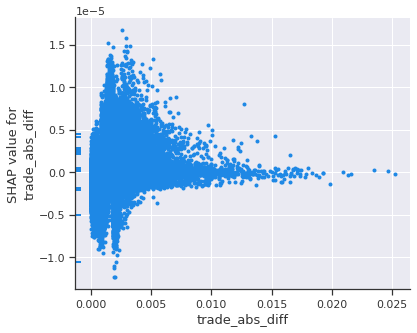

features =  trade_energy
LightGBM model1


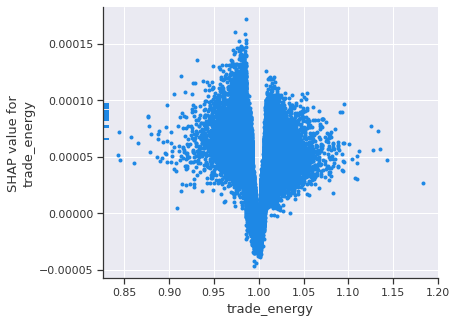

features =  trade_iqr_p
LightGBM model1


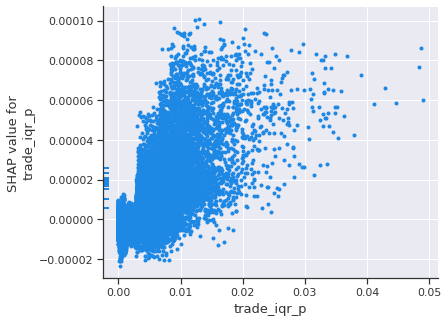

features =  trade_abs_diff_v
LightGBM model1


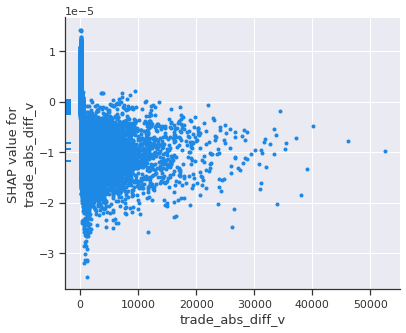

features =  trade_energy_v
LightGBM model1


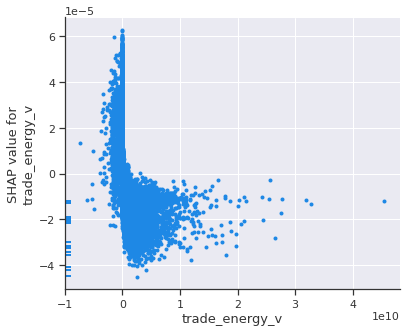

features =  trade_iqr_p_v
LightGBM model1


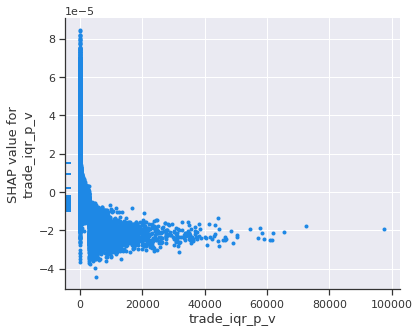

features =  trade_log_return_realized_volatility_500
LightGBM model1


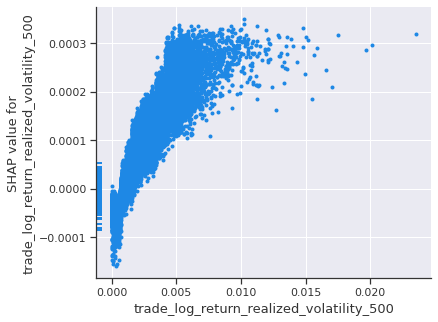

features =  trade_seconds_in_bucket_count_unique_500
LightGBM model1


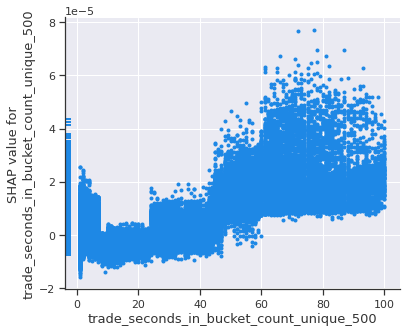

features =  trade_size_sum_500
LightGBM model1


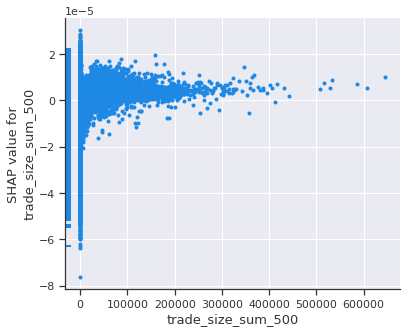

features =  trade_order_count_sum_500
LightGBM model1


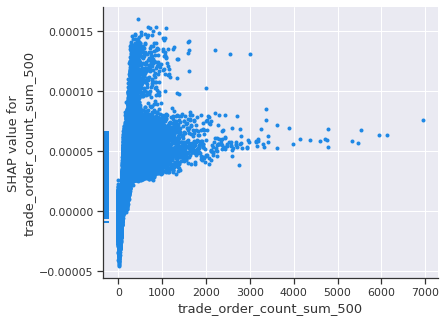

features =  trade_log_return_realized_volatility_400
LightGBM model1


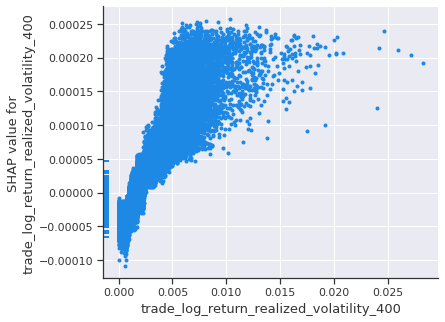

features =  trade_seconds_in_bucket_count_unique_400
LightGBM model1


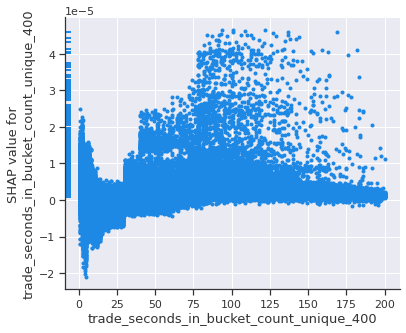

features =  trade_size_sum_400
LightGBM model1


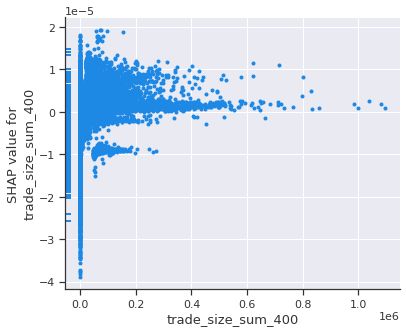

features =  trade_order_count_sum_400
LightGBM model1


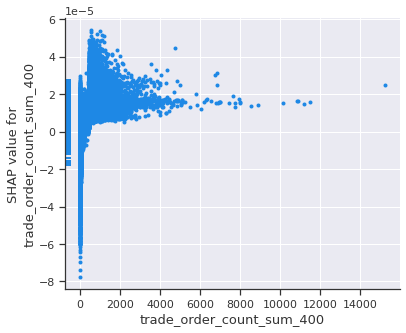

features =  trade_log_return_realized_volatility_300
LightGBM model1


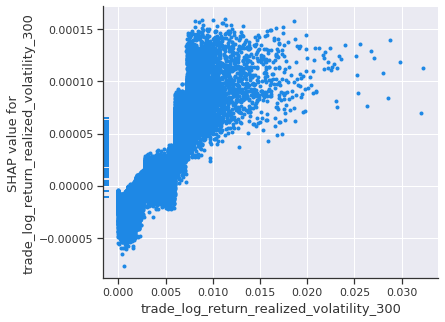

features =  trade_seconds_in_bucket_count_unique_300
LightGBM model1


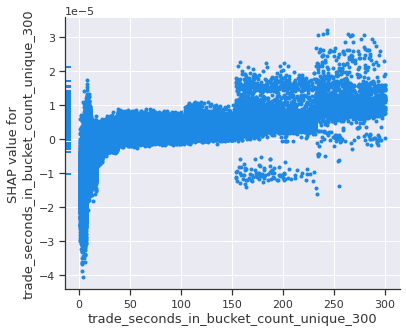

features =  trade_size_sum_300
LightGBM model1


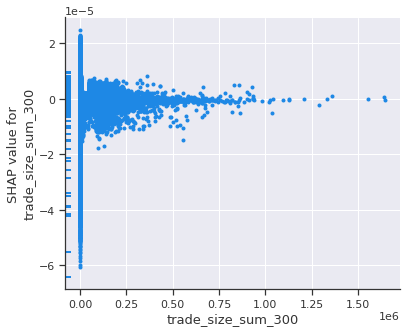

features =  trade_order_count_sum_300
LightGBM model1


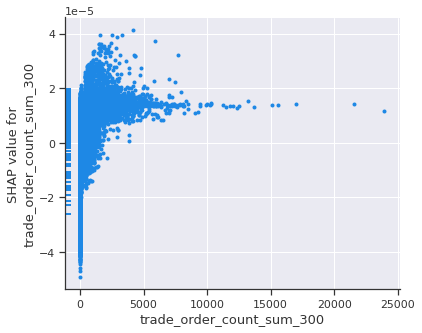

features =  trade_log_return_realized_volatility_200
LightGBM model1


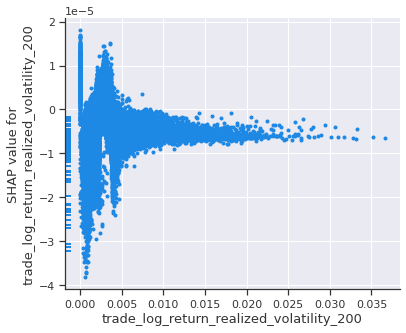

features =  trade_seconds_in_bucket_count_unique_200
LightGBM model1


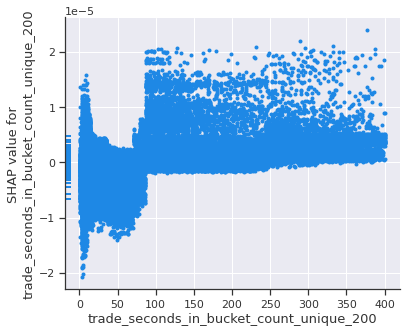

features =  trade_size_sum_200
LightGBM model1


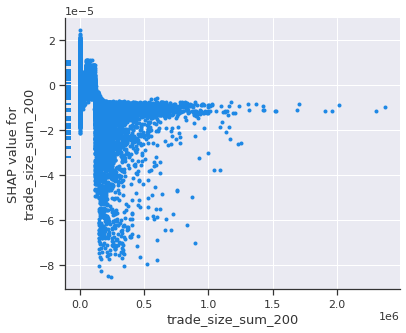

features =  trade_order_count_sum_200
LightGBM model1


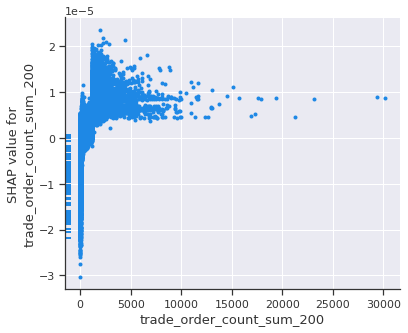

features =  trade_log_return_realized_volatility_100
LightGBM model1


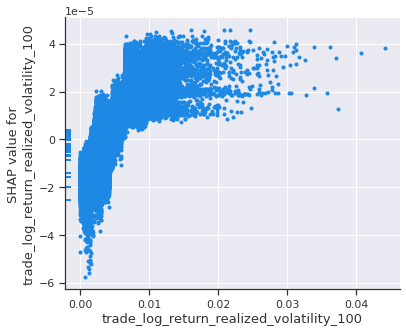

features =  trade_seconds_in_bucket_count_unique_100
LightGBM model1


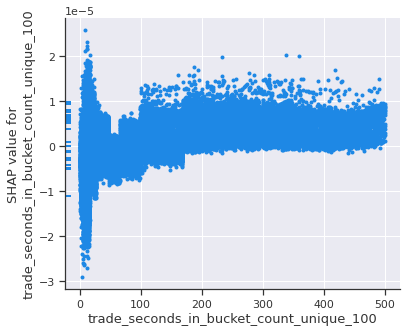

features =  trade_size_sum_100
LightGBM model1


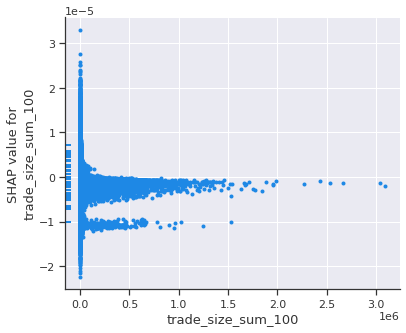

features =  trade_order_count_sum_100
LightGBM model1


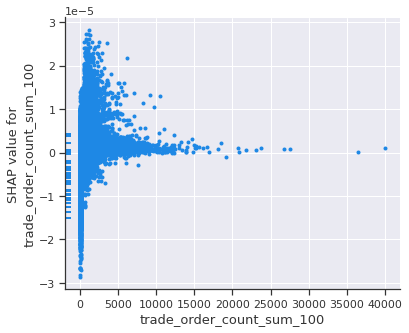

features =  log_return1_realized_volatility_mean_stock
LightGBM model1


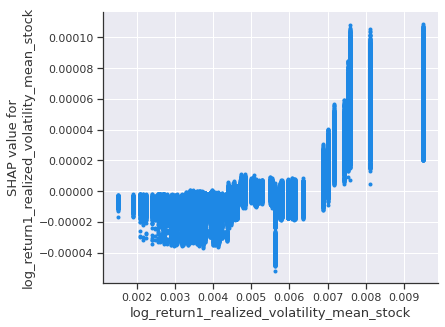

features =  log_return1_realized_volatility_std_stock
LightGBM model1


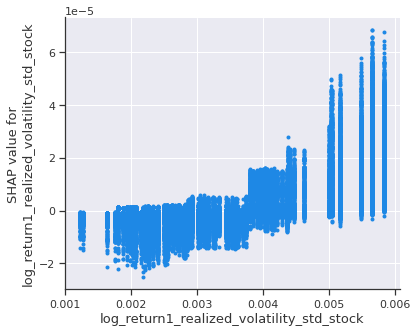

features =  log_return1_realized_volatility_max_stock
LightGBM model1


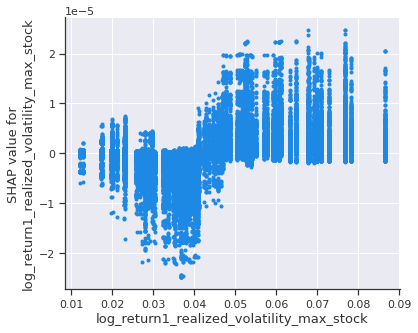

features =  log_return1_realized_volatility_min_stock
LightGBM model1


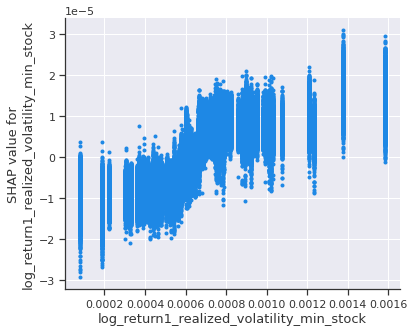

features =  log_return2_realized_volatility_mean_stock
LightGBM model1


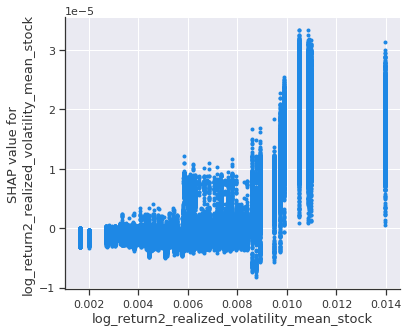

features =  log_return2_realized_volatility_std_stock
LightGBM model1


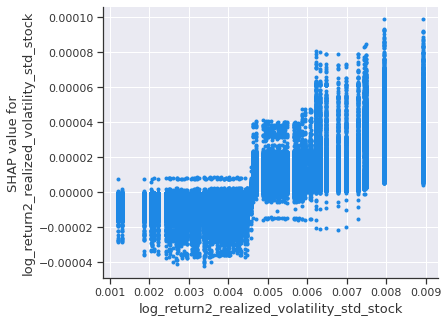

features =  log_return2_realized_volatility_max_stock
LightGBM model1


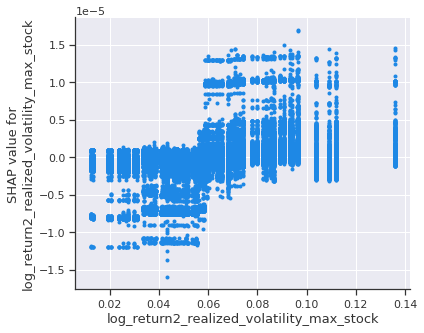

features =  log_return2_realized_volatility_min_stock
LightGBM model1


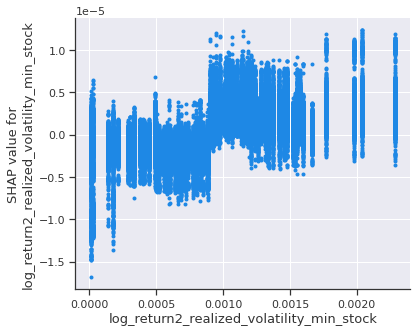

features =  log_return1_realized_volatility_400_mean_stock
LightGBM model1


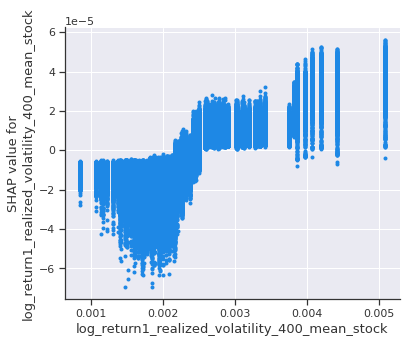

features =  log_return1_realized_volatility_400_std_stock
LightGBM model1


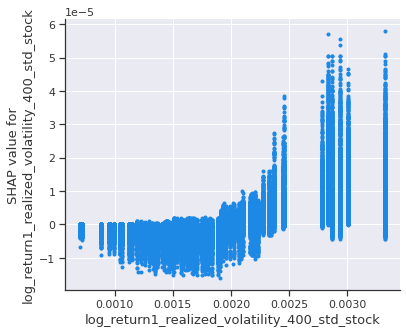

features =  log_return1_realized_volatility_400_max_stock
LightGBM model1


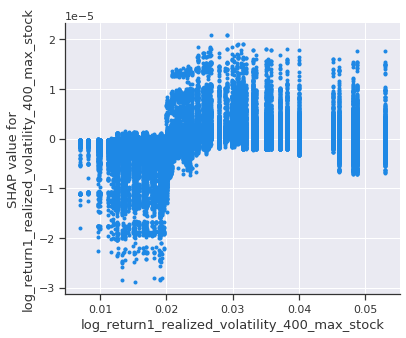

features =  log_return1_realized_volatility_400_min_stock
LightGBM model1


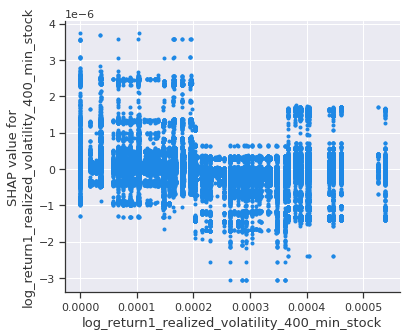

features =  log_return2_realized_volatility_400_mean_stock
LightGBM model1


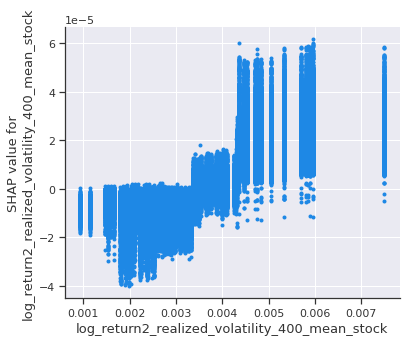

features =  log_return2_realized_volatility_400_std_stock
LightGBM model1


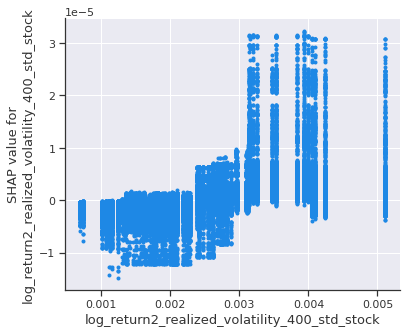

features =  log_return2_realized_volatility_400_max_stock
LightGBM model1


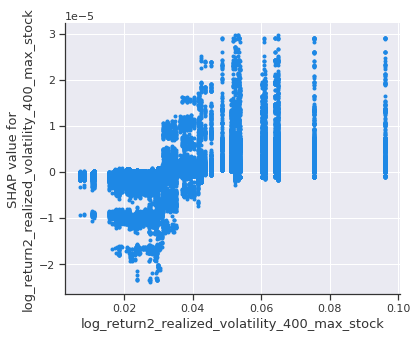

features =  log_return2_realized_volatility_400_min_stock
LightGBM model1


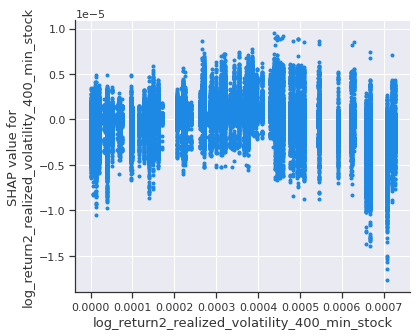

features =  log_return1_realized_volatility_300_mean_stock
LightGBM model1


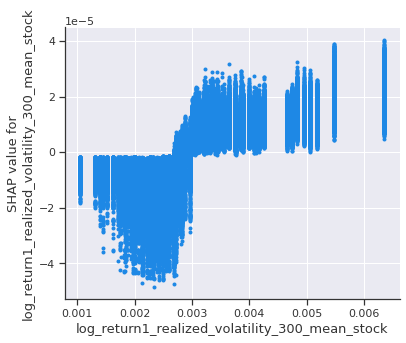

features =  log_return1_realized_volatility_300_std_stock
LightGBM model1


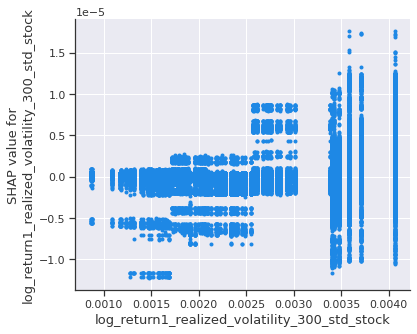

features =  log_return1_realized_volatility_300_max_stock
LightGBM model1


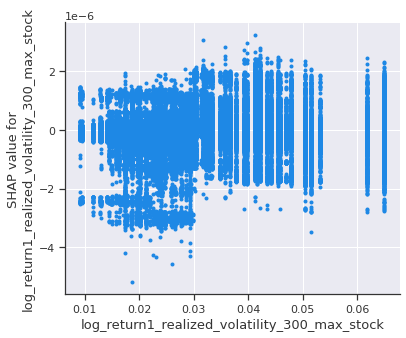

features =  log_return1_realized_volatility_300_min_stock
LightGBM model1


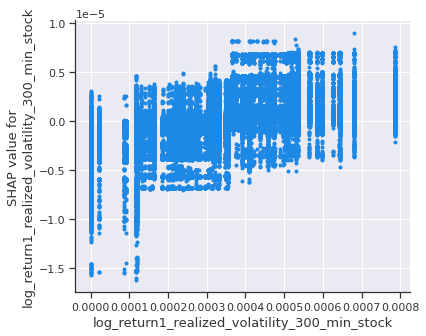

features =  log_return2_realized_volatility_300_mean_stock
LightGBM model1


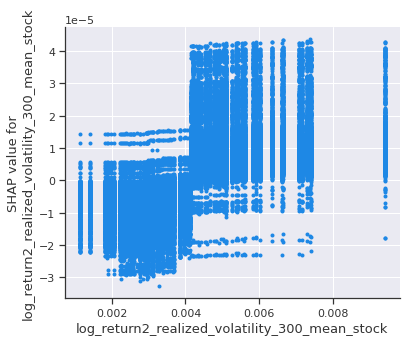

features =  log_return2_realized_volatility_300_std_stock
LightGBM model1


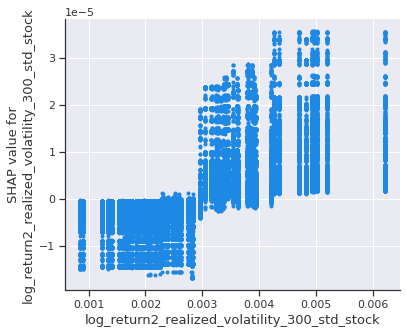

features =  log_return2_realized_volatility_300_max_stock
LightGBM model1


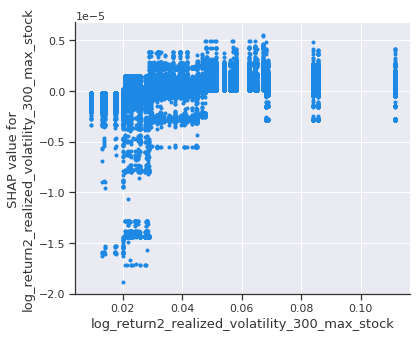

features =  log_return2_realized_volatility_300_min_stock
LightGBM model1


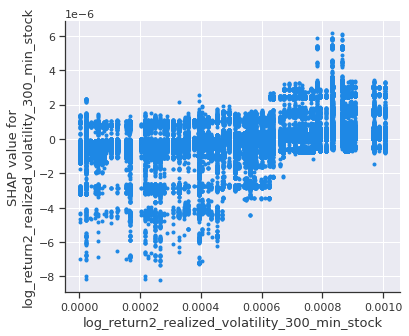

features =  log_return1_realized_volatility_200_mean_stock
LightGBM model1


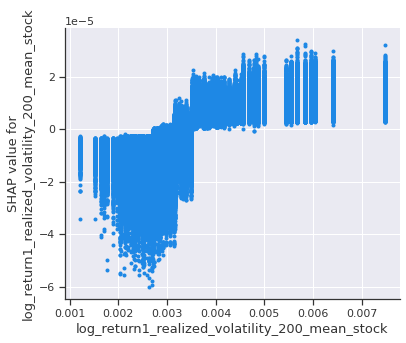

features =  log_return1_realized_volatility_200_std_stock
LightGBM model1


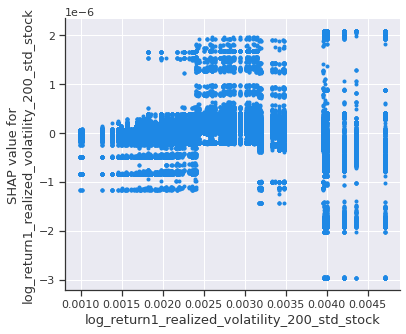

features =  log_return1_realized_volatility_200_max_stock
LightGBM model1


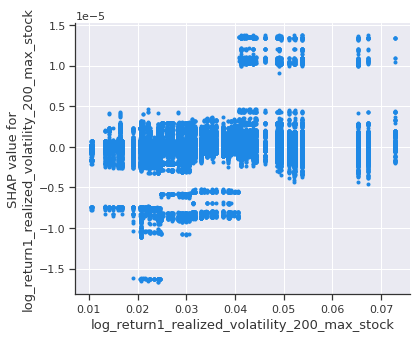

features =  log_return1_realized_volatility_200_min_stock
LightGBM model1


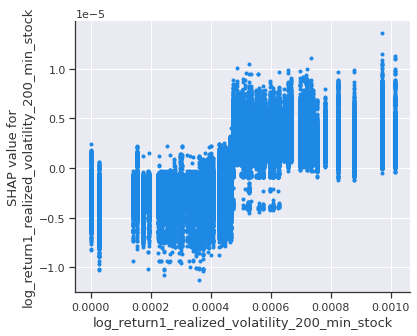

features =  log_return2_realized_volatility_200_mean_stock
LightGBM model1


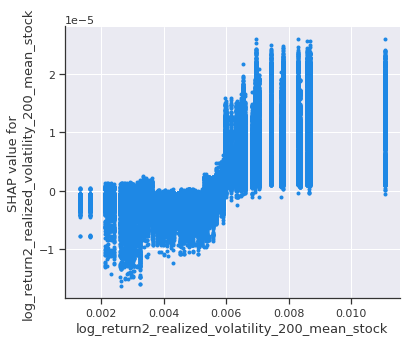

features =  log_return2_realized_volatility_200_std_stock
LightGBM model1


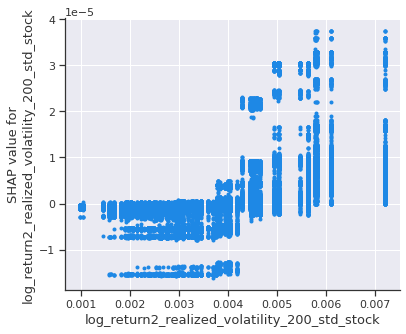

features =  log_return2_realized_volatility_200_max_stock
LightGBM model1


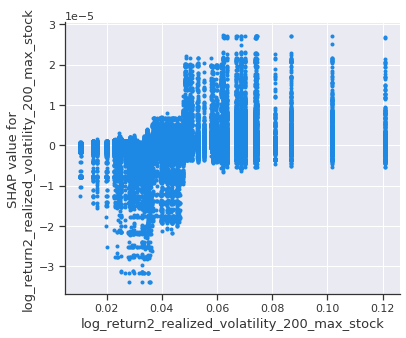

features =  log_return2_realized_volatility_200_min_stock
LightGBM model1


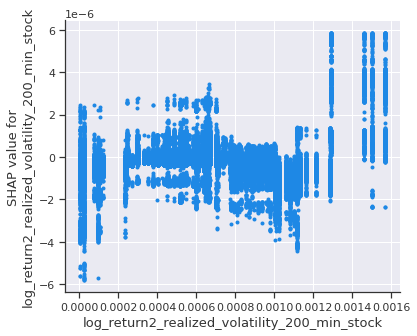

features =  trade_log_return_realized_volatility_mean_stock
LightGBM model1


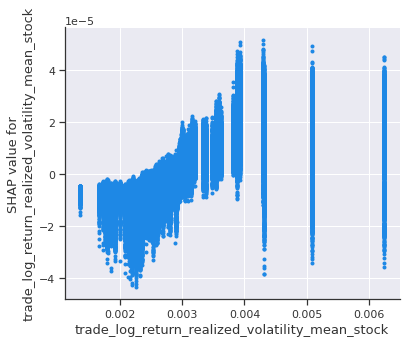

features =  trade_log_return_realized_volatility_std_stock
LightGBM model1


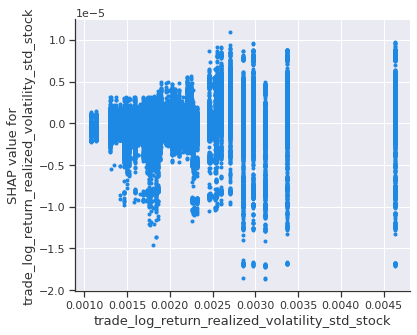

features =  trade_log_return_realized_volatility_max_stock
LightGBM model1


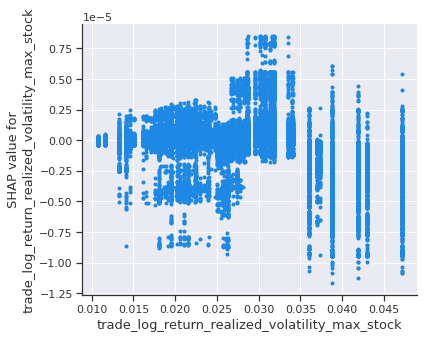

features =  trade_log_return_realized_volatility_min_stock
LightGBM model1


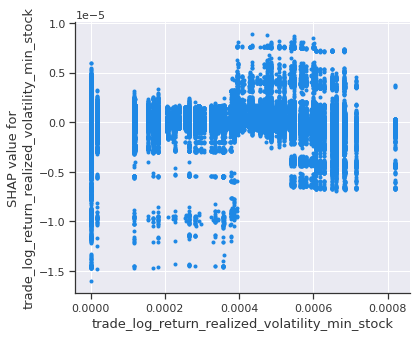

features =  trade_log_return_realized_volatility_400_mean_stock
LightGBM model1


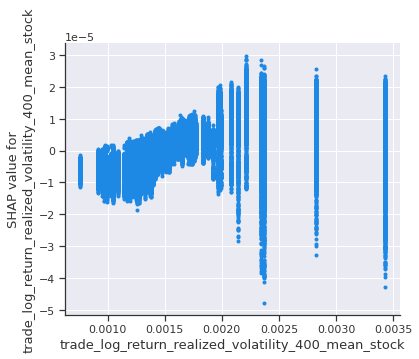

features =  trade_log_return_realized_volatility_400_std_stock
LightGBM model1


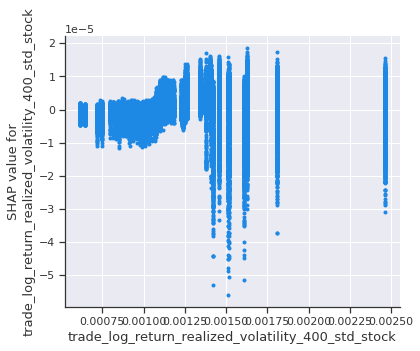

features =  trade_log_return_realized_volatility_400_max_stock
LightGBM model1


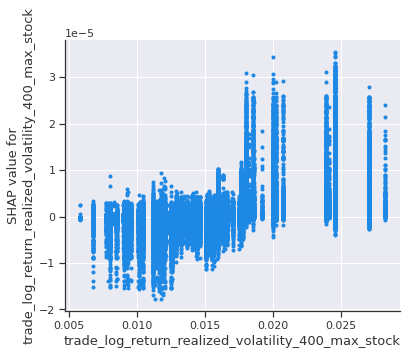

features =  trade_log_return_realized_volatility_400_min_stock
LightGBM model1


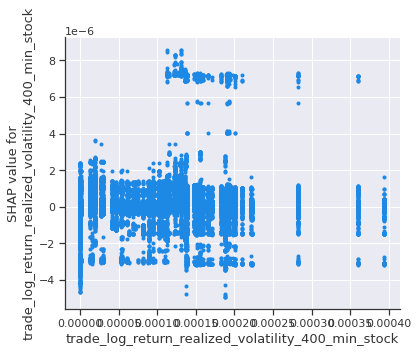

features =  trade_log_return_realized_volatility_300_mean_stock
LightGBM model1


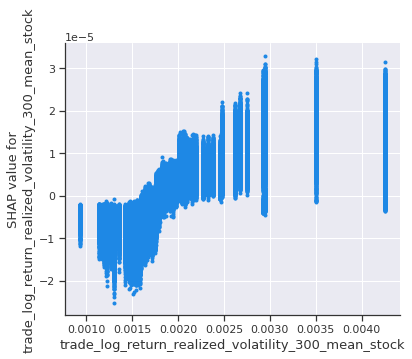

features =  trade_log_return_realized_volatility_300_std_stock
LightGBM model1


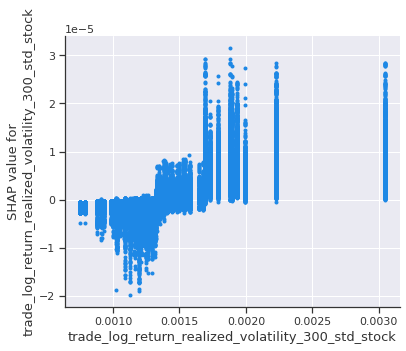

features =  trade_log_return_realized_volatility_300_max_stock
LightGBM model1


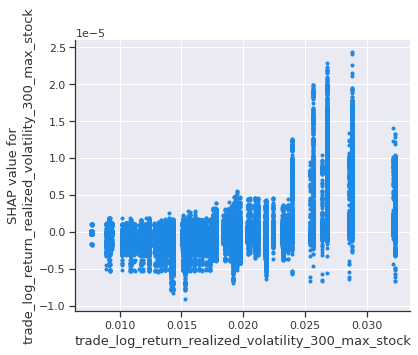

features =  trade_log_return_realized_volatility_300_min_stock
LightGBM model1


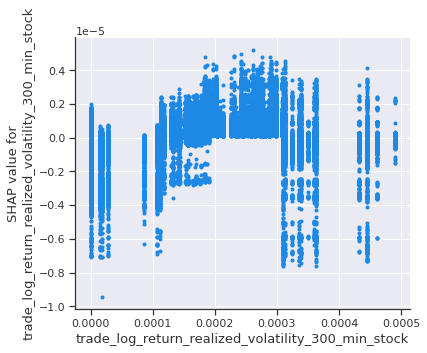

features =  trade_log_return_realized_volatility_200_mean_stock
LightGBM model1


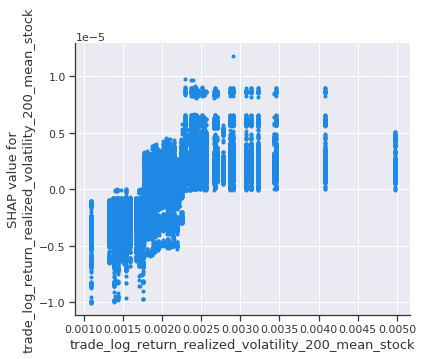

features =  trade_log_return_realized_volatility_200_std_stock
LightGBM model1


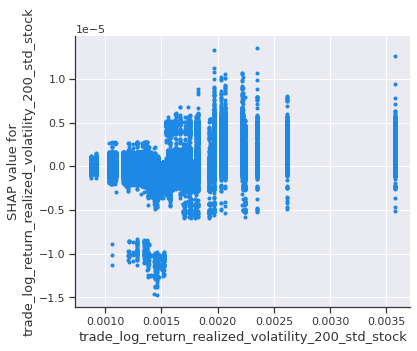

features =  trade_log_return_realized_volatility_200_max_stock
LightGBM model1


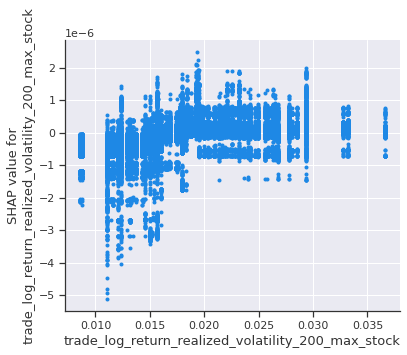

features =  trade_log_return_realized_volatility_200_min_stock
LightGBM model1


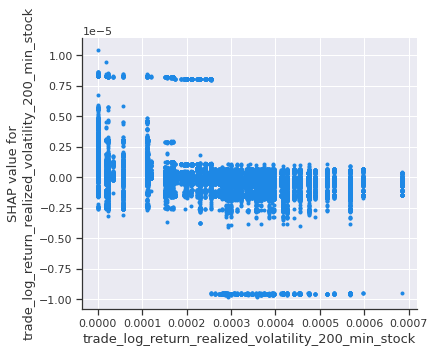

features =  log_return1_realized_volatility_mean_time
LightGBM model1


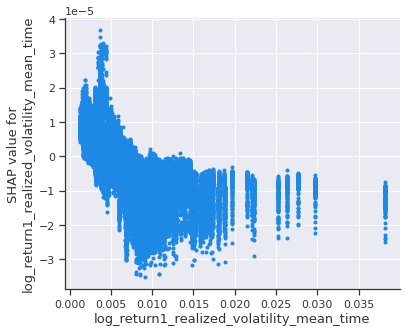

features =  log_return1_realized_volatility_std_time
LightGBM model1


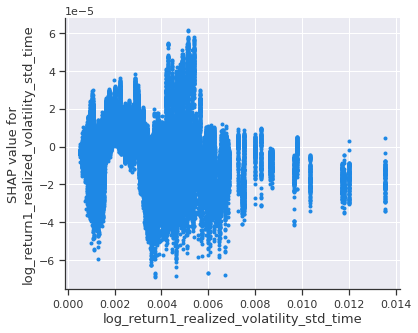

features =  log_return1_realized_volatility_max_time
LightGBM model1


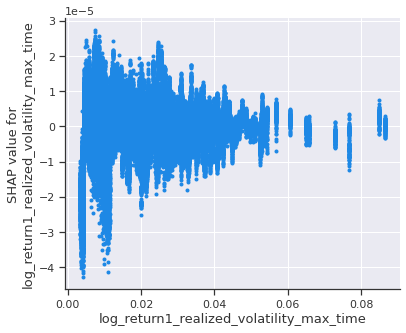

features =  log_return1_realized_volatility_min_time
LightGBM model1


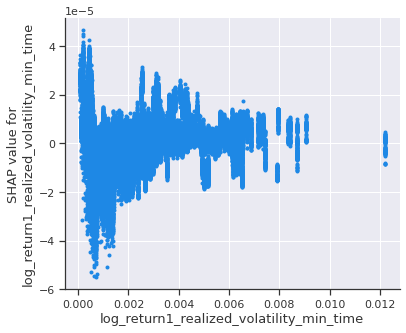

features =  log_return2_realized_volatility_mean_time
LightGBM model1


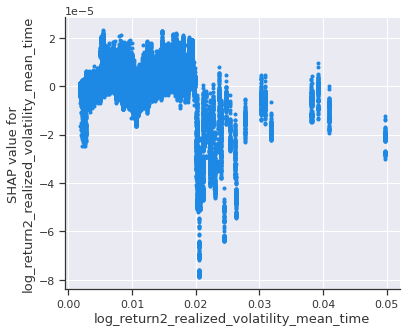

features =  log_return2_realized_volatility_std_time
LightGBM model1


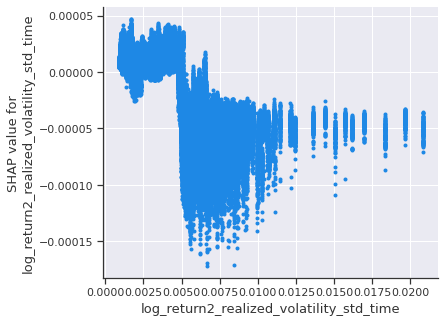

features =  log_return2_realized_volatility_max_time
LightGBM model1


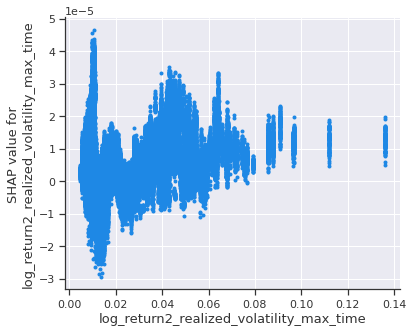

features =  log_return2_realized_volatility_min_time
LightGBM model1


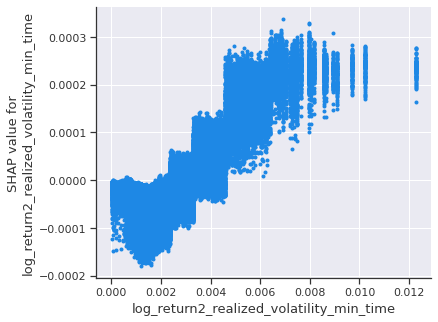

features =  log_return1_realized_volatility_400_mean_time
LightGBM model1


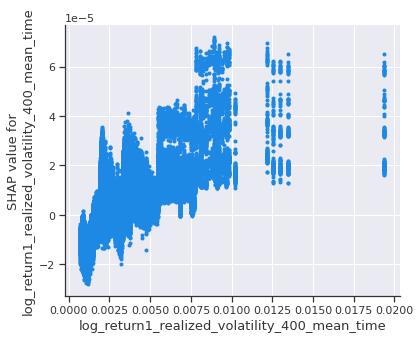

features =  log_return1_realized_volatility_400_std_time
LightGBM model1


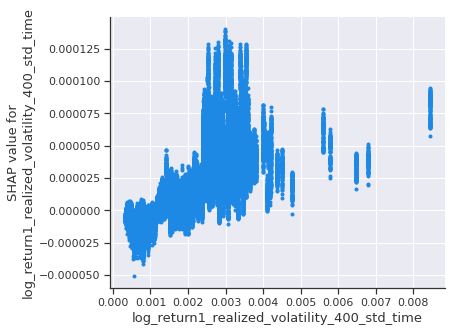

features =  log_return1_realized_volatility_400_max_time
LightGBM model1


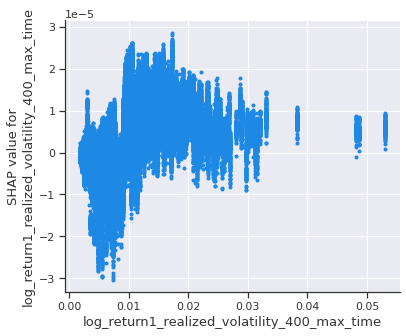

features =  log_return1_realized_volatility_400_min_time
LightGBM model1


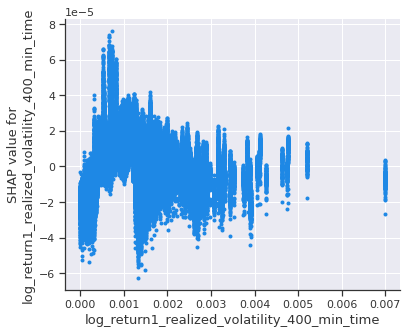

features =  log_return2_realized_volatility_400_mean_time
LightGBM model1


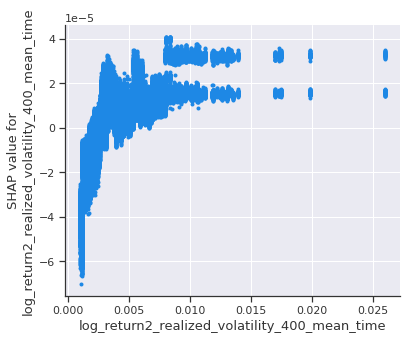

features =  log_return2_realized_volatility_400_std_time
LightGBM model1


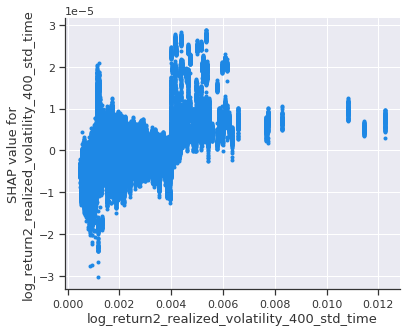

features =  log_return2_realized_volatility_400_max_time
LightGBM model1


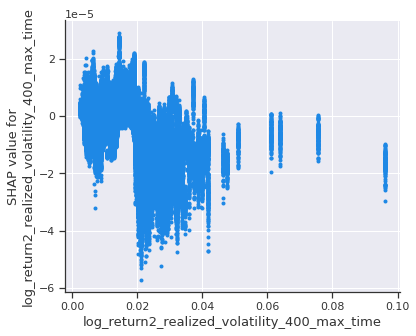

features =  log_return2_realized_volatility_400_min_time
LightGBM model1


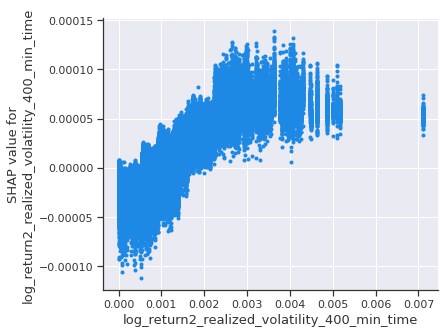

features =  log_return1_realized_volatility_300_mean_time
LightGBM model1


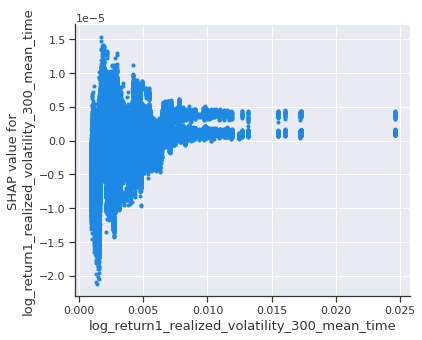

features =  log_return1_realized_volatility_300_std_time
LightGBM model1


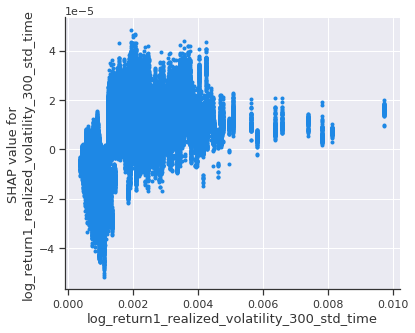

features =  log_return1_realized_volatility_300_max_time
LightGBM model1


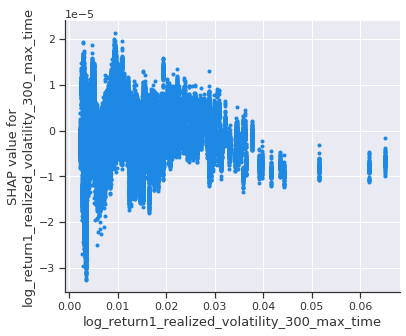

features =  log_return1_realized_volatility_300_min_time
LightGBM model1


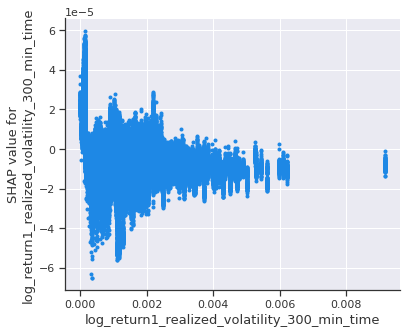

features =  log_return2_realized_volatility_300_mean_time
LightGBM model1


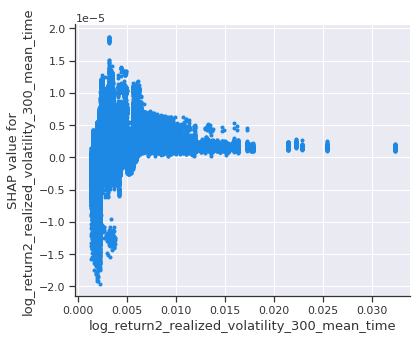

features =  log_return2_realized_volatility_300_std_time
LightGBM model1


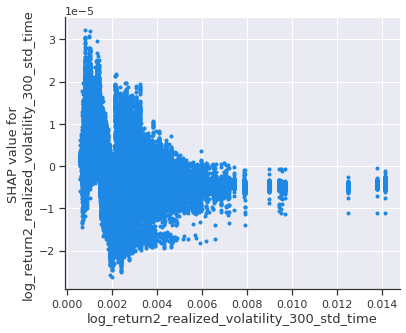

features =  log_return2_realized_volatility_300_max_time
LightGBM model1


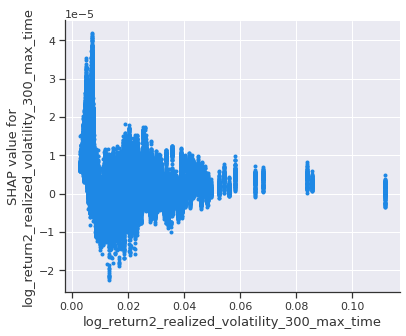

features =  log_return2_realized_volatility_300_min_time
LightGBM model1


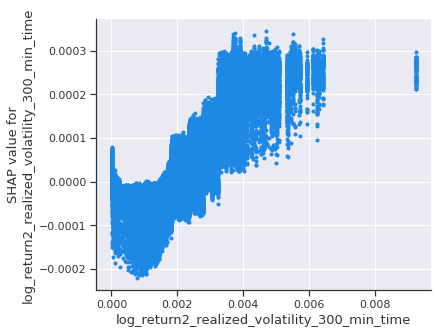

features =  log_return1_realized_volatility_200_mean_time
LightGBM model1


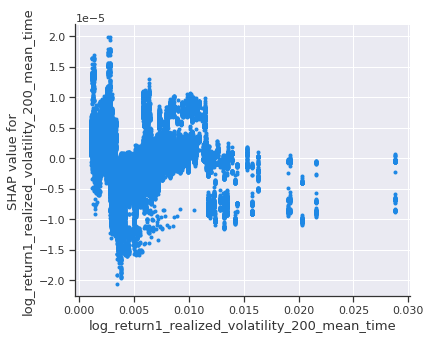

features =  log_return1_realized_volatility_200_std_time
LightGBM model1


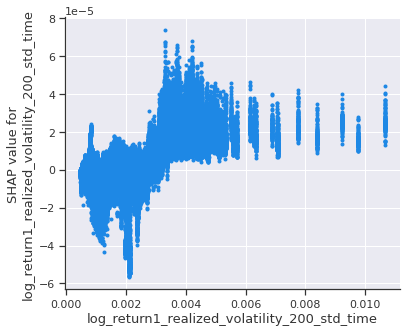

features =  log_return1_realized_volatility_200_max_time
LightGBM model1


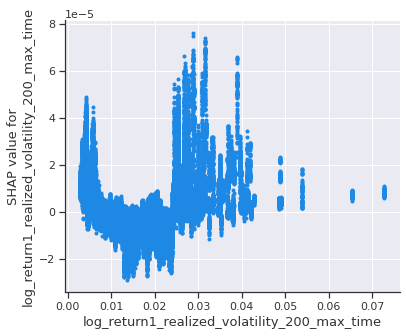

features =  log_return1_realized_volatility_200_min_time
LightGBM model1


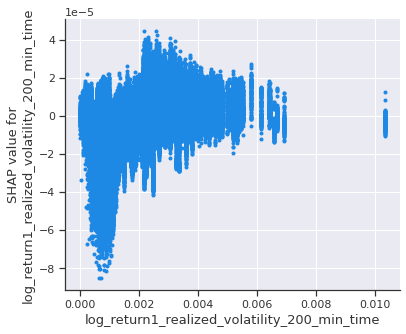

features =  log_return2_realized_volatility_200_mean_time
LightGBM model1


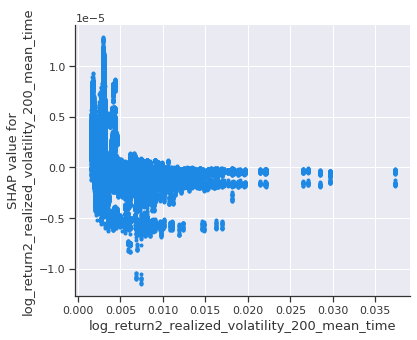

features =  log_return2_realized_volatility_200_std_time
LightGBM model1


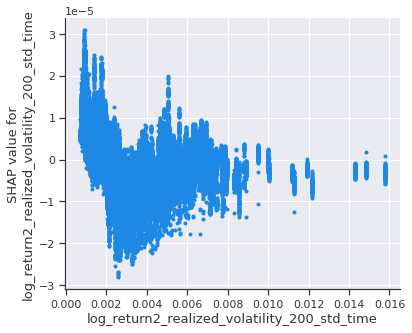

features =  log_return2_realized_volatility_200_max_time
LightGBM model1


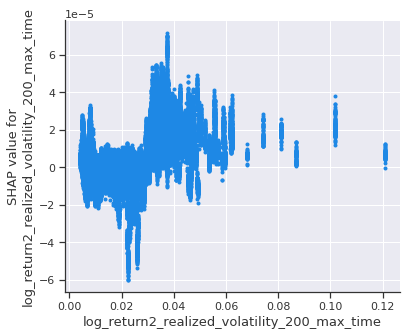

features =  log_return2_realized_volatility_200_min_time
LightGBM model1


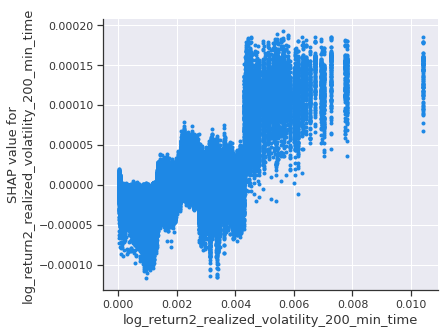

features =  trade_log_return_realized_volatility_mean_time
LightGBM model1


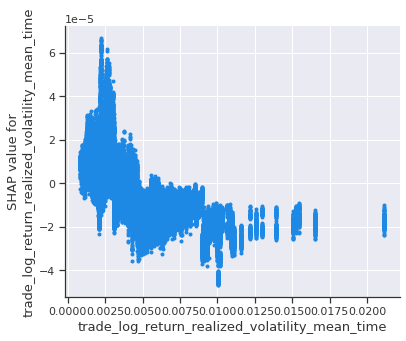

features =  trade_log_return_realized_volatility_std_time
LightGBM model1


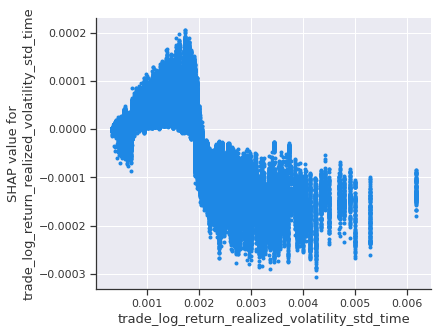

features =  trade_log_return_realized_volatility_max_time
LightGBM model1


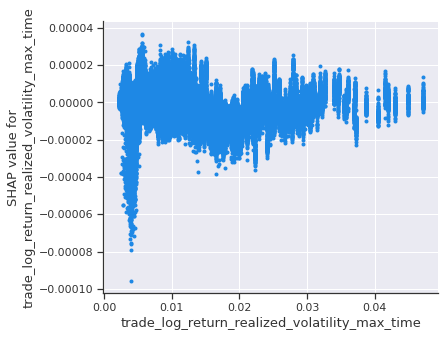

features =  trade_log_return_realized_volatility_min_time
LightGBM model1


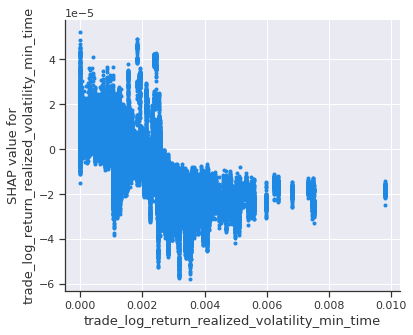

features =  trade_log_return_realized_volatility_400_mean_time
LightGBM model1


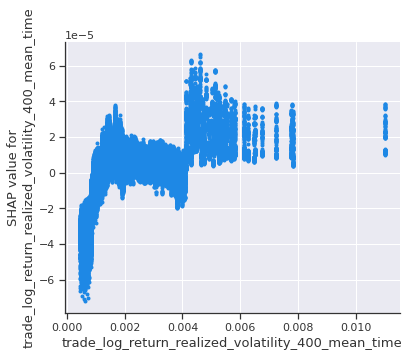

features =  trade_log_return_realized_volatility_400_std_time
LightGBM model1


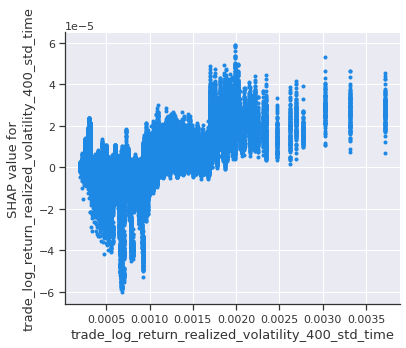

features =  trade_log_return_realized_volatility_400_max_time
LightGBM model1


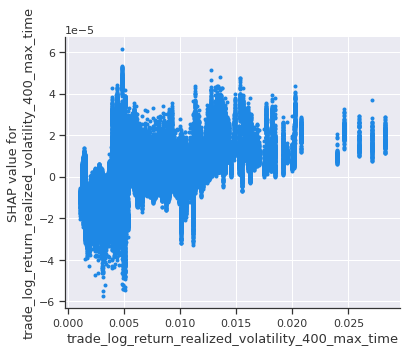

features =  trade_log_return_realized_volatility_400_min_time
LightGBM model1


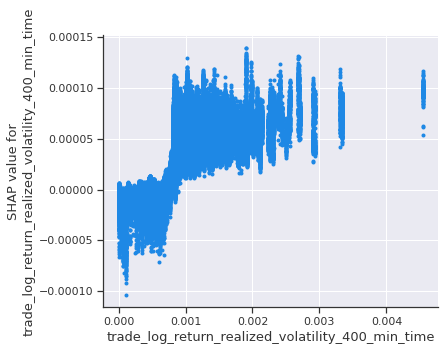

features =  trade_log_return_realized_volatility_300_mean_time
LightGBM model1


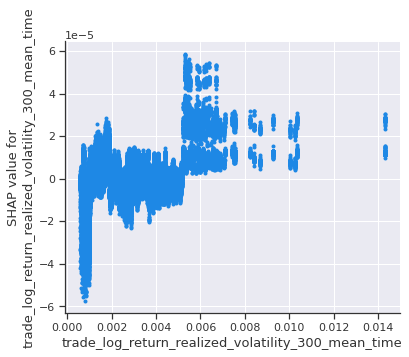

features =  trade_log_return_realized_volatility_300_std_time
LightGBM model1


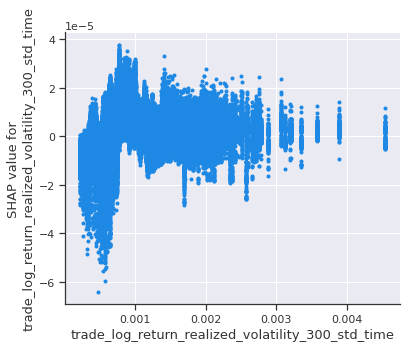

features =  trade_log_return_realized_volatility_300_max_time
LightGBM model1


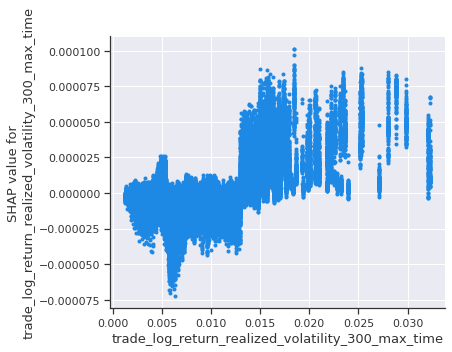

features =  trade_log_return_realized_volatility_300_min_time
LightGBM model1


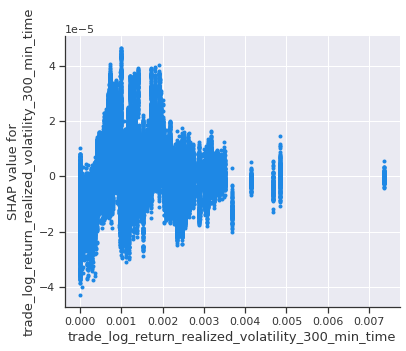

features =  trade_log_return_realized_volatility_200_mean_time
LightGBM model1


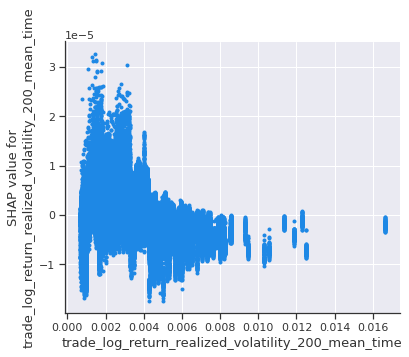

features =  trade_log_return_realized_volatility_200_std_time
LightGBM model1


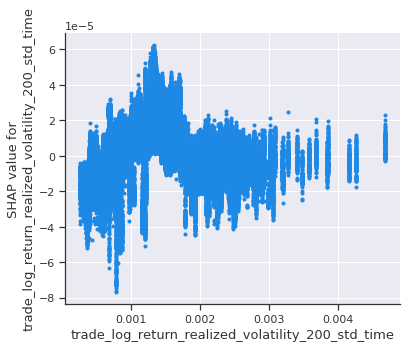

features =  trade_log_return_realized_volatility_200_max_time
LightGBM model1


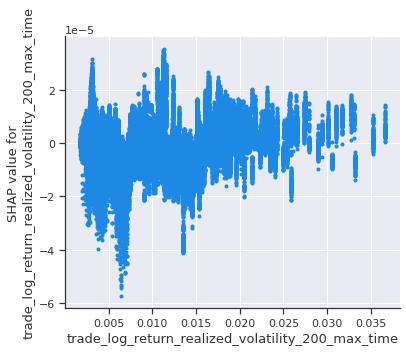

features =  trade_log_return_realized_volatility_200_min_time
LightGBM model1


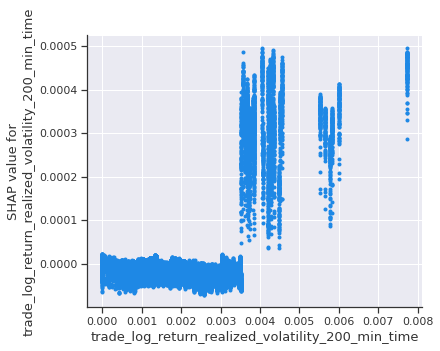

features =  size_tau
LightGBM model1


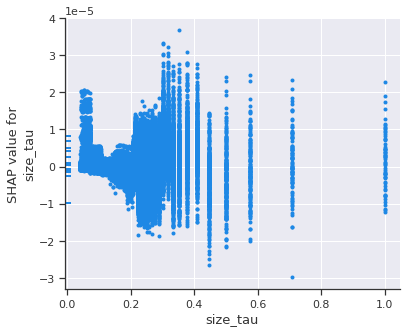

features =  size_tau_400
LightGBM model1


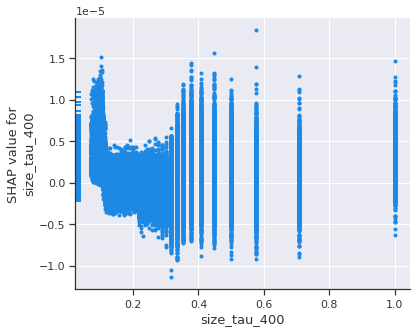

features =  size_tau_300
LightGBM model1


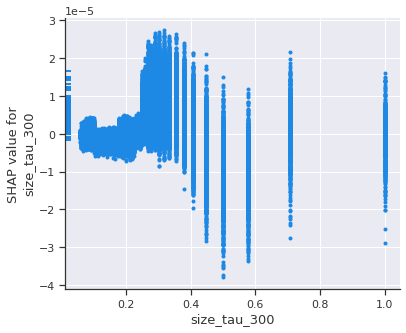

features =  size_tau_200
LightGBM model1


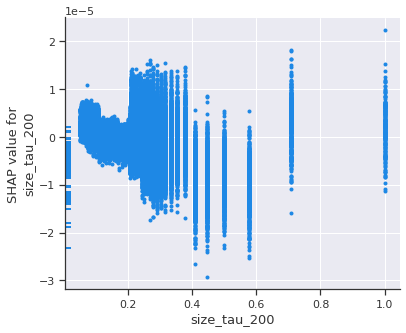

features =  size_tau2
LightGBM model1


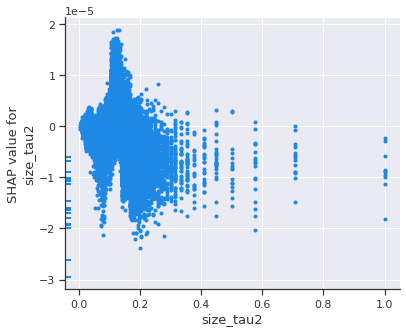

features =  size_tau2_400
LightGBM model1


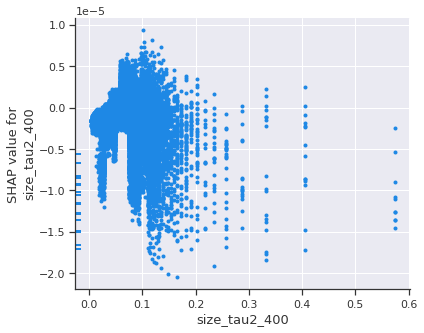

features =  size_tau2_300
LightGBM model1


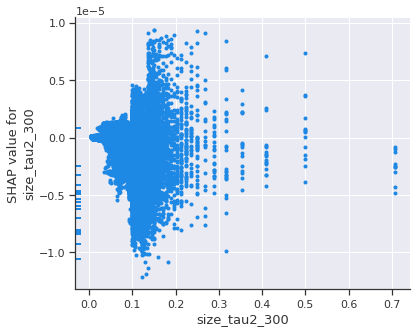

features =  size_tau2_200
LightGBM model1


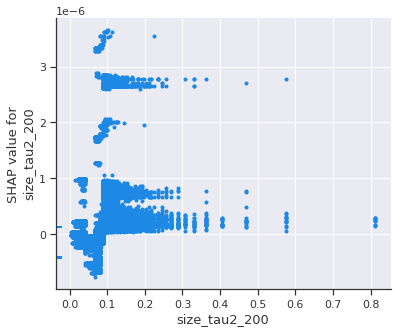

features =  size_tau2_d
LightGBM model1


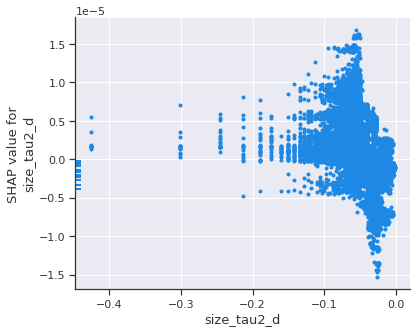

features =  log_return1_realized_volatility_0c1
LightGBM model1


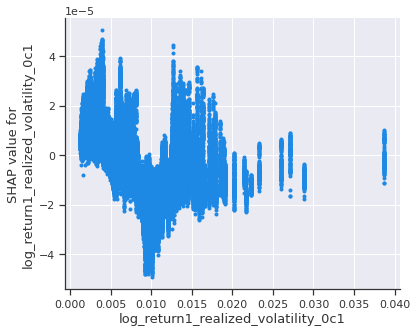

features =  log_return1_realized_volatility_1c1
LightGBM model1


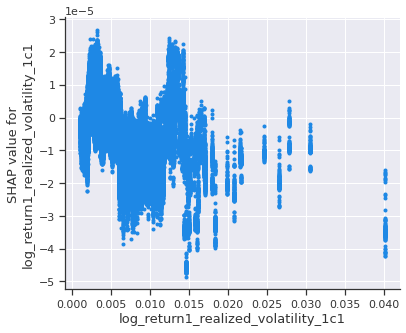

features =  log_return1_realized_volatility_3c1
LightGBM model1


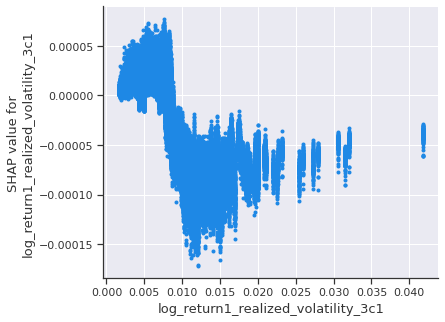

features =  log_return1_realized_volatility_4c1
LightGBM model1


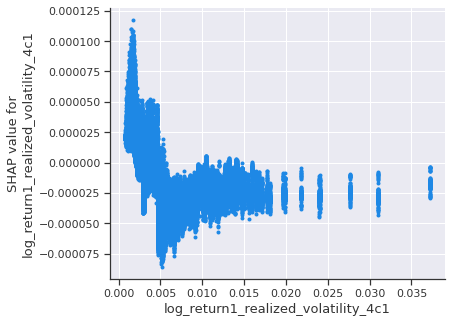

features =  log_return1_realized_volatility_6c1
LightGBM model1


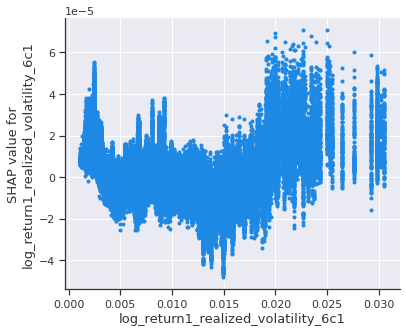

features =  total_volume_sum_0c1
LightGBM model1


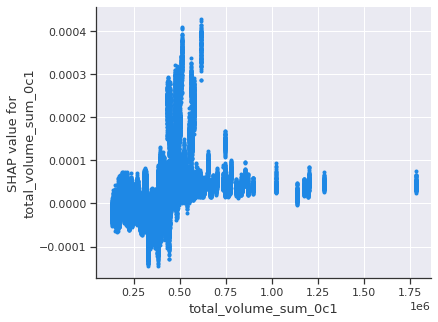

features =  total_volume_sum_1c1
LightGBM model1


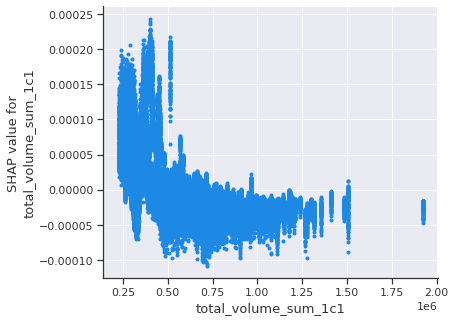

features =  total_volume_sum_3c1
LightGBM model1


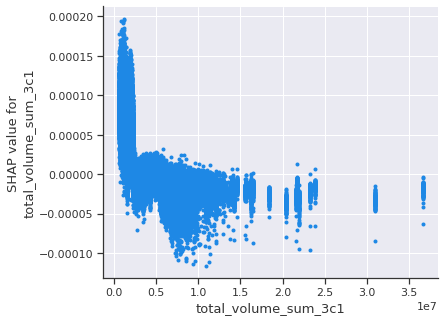

features =  total_volume_sum_4c1
LightGBM model1


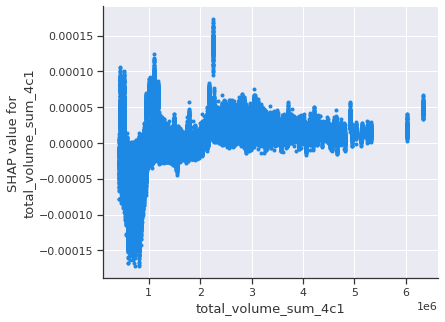

features =  total_volume_sum_6c1
LightGBM model1


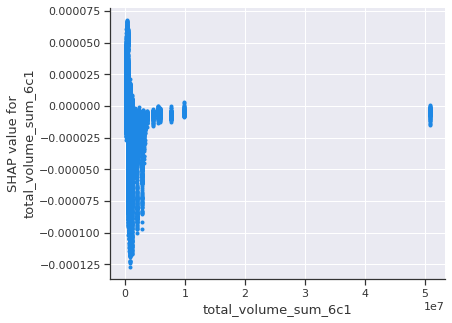

features =  trade_size_sum_0c1
LightGBM model1


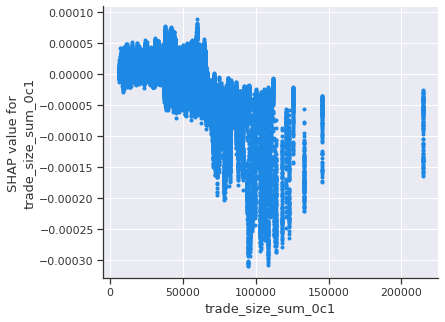

features =  trade_size_sum_1c1
LightGBM model1


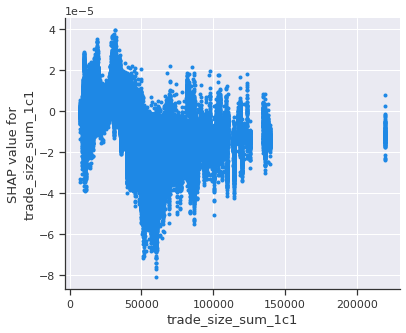

features =  trade_size_sum_3c1
LightGBM model1


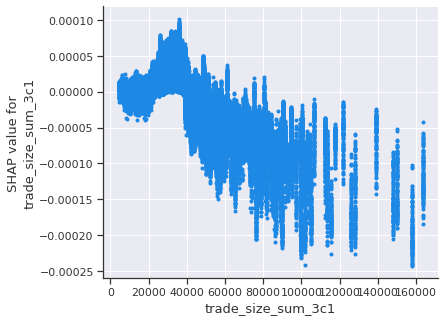

features =  trade_size_sum_4c1
LightGBM model1


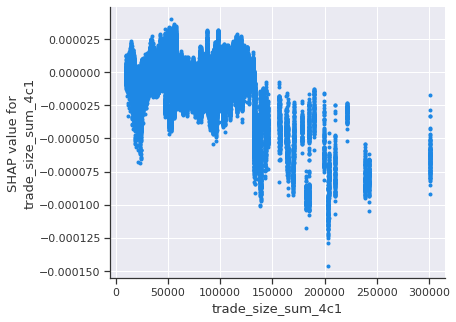

features =  trade_size_sum_6c1
LightGBM model1


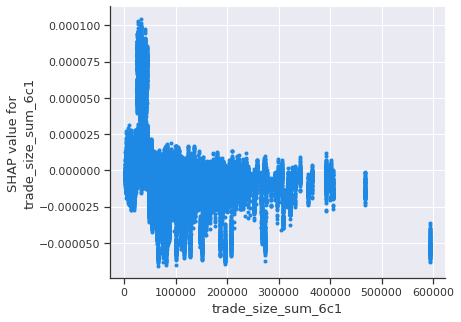

features =  trade_order_count_sum_0c1
LightGBM model1


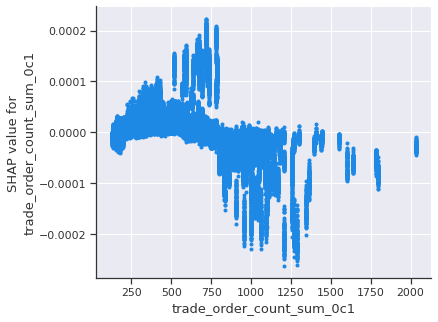

features =  trade_order_count_sum_1c1
LightGBM model1


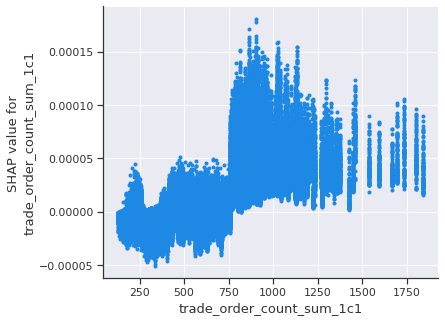

features =  trade_order_count_sum_3c1
LightGBM model1


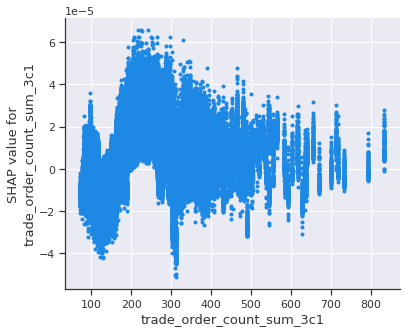

features =  trade_order_count_sum_4c1
LightGBM model1


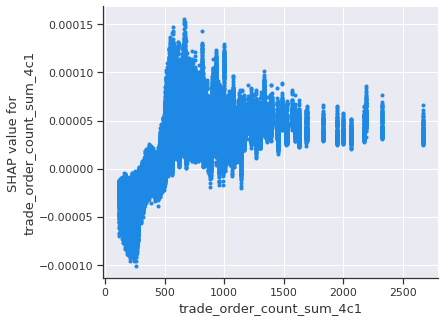

features =  trade_order_count_sum_6c1
LightGBM model1


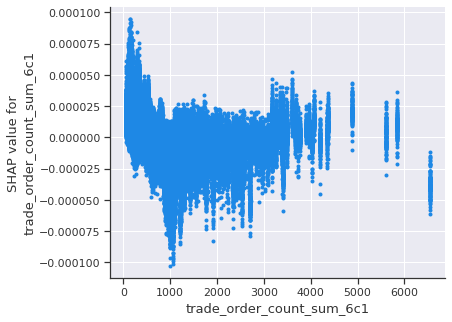

features =  price_spread_sum_0c1
LightGBM model1


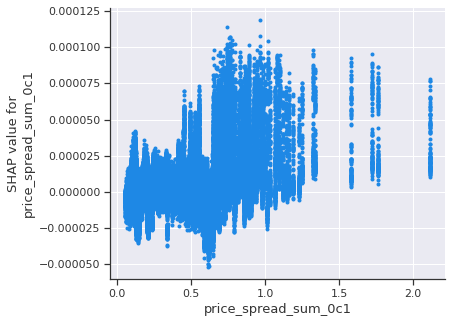

features =  price_spread_sum_1c1
LightGBM model1


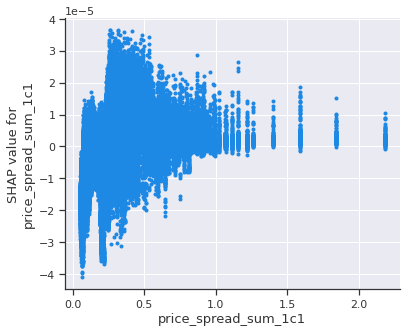

features =  price_spread_sum_3c1
LightGBM model1


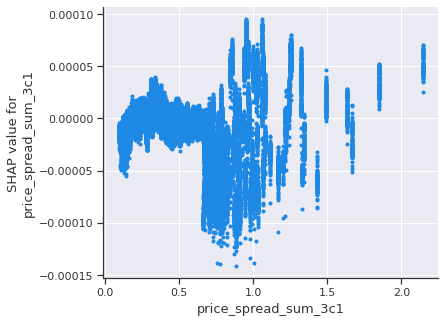

features =  price_spread_sum_4c1
LightGBM model1


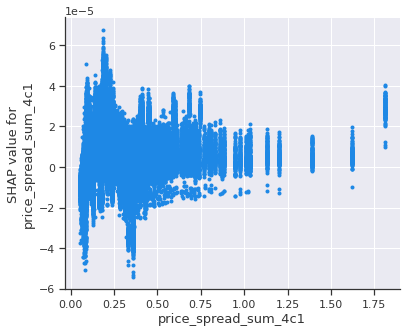

features =  price_spread_sum_6c1
LightGBM model1


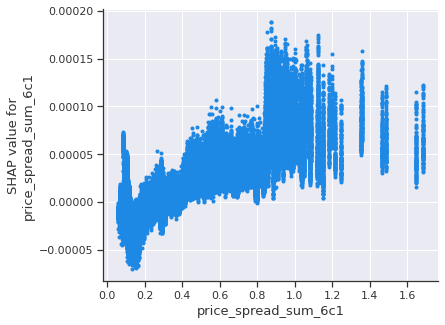

features =  bid_spread_sum_0c1
LightGBM model1


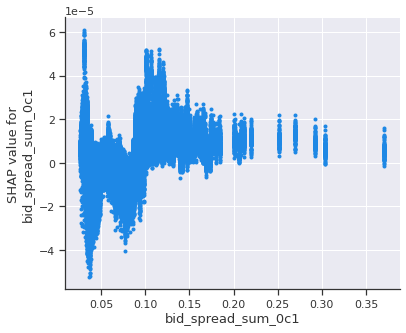

features =  bid_spread_sum_1c1
LightGBM model1


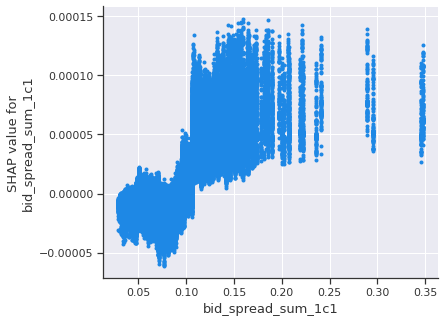

features =  bid_spread_sum_3c1
LightGBM model1


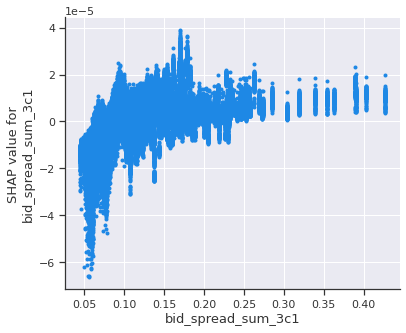

features =  bid_spread_sum_4c1
LightGBM model1


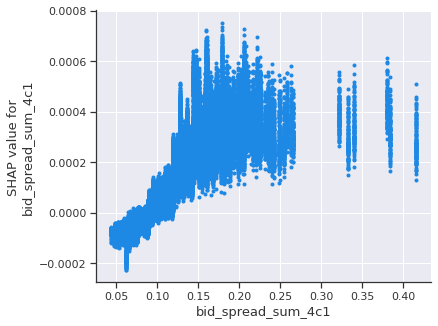

features =  bid_spread_sum_6c1
LightGBM model1


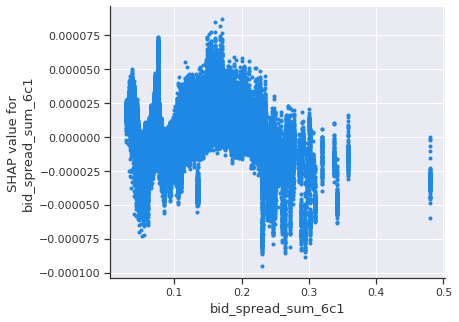

features =  ask_spread_sum_0c1
LightGBM model1


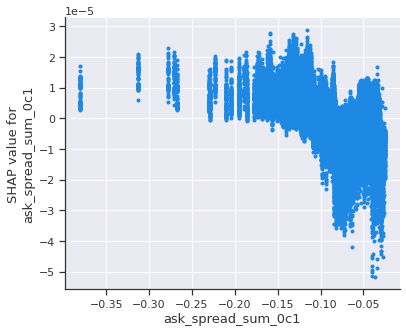

features =  ask_spread_sum_1c1
LightGBM model1


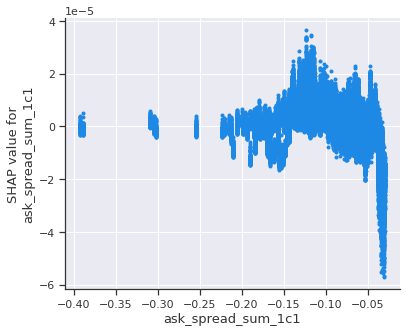

features =  ask_spread_sum_3c1
LightGBM model1


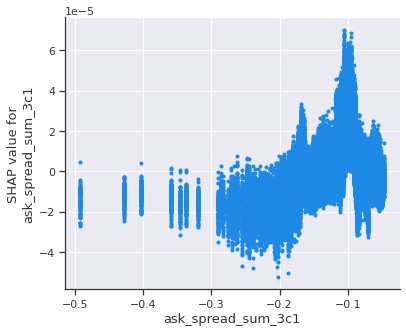

features =  ask_spread_sum_4c1
LightGBM model1


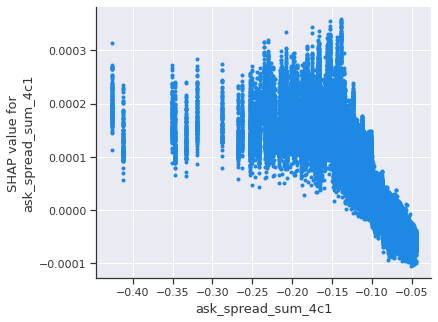

features =  ask_spread_sum_6c1
LightGBM model1


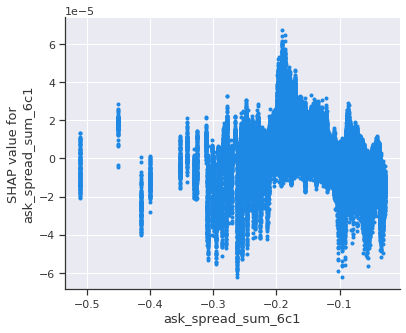

features =  volume_imbalance_sum_0c1
LightGBM model1


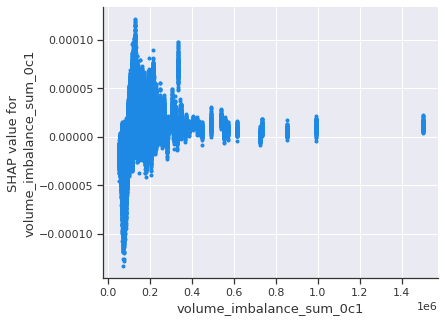

features =  volume_imbalance_sum_1c1
LightGBM model1


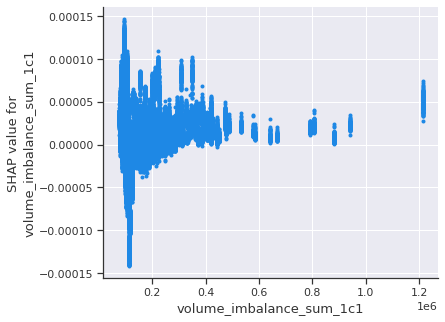

features =  volume_imbalance_sum_3c1
LightGBM model1


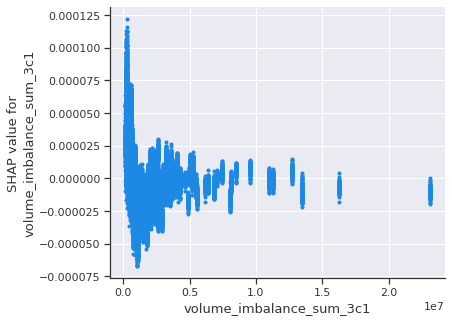

features =  volume_imbalance_sum_4c1
LightGBM model1


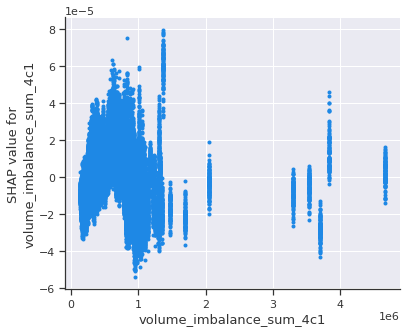

features =  volume_imbalance_sum_6c1
LightGBM model1


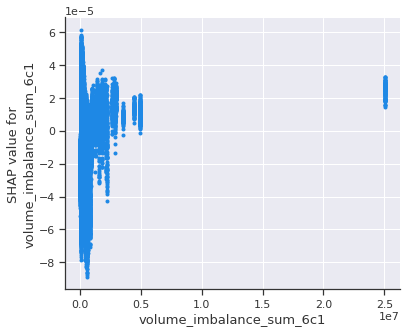

features =  bid_ask_spread_sum_0c1
LightGBM model1


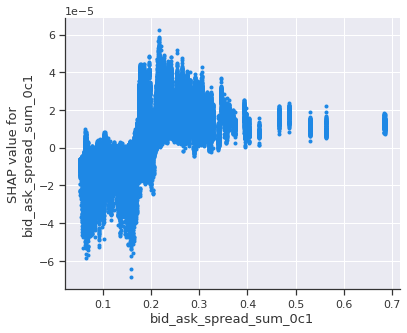

features =  bid_ask_spread_sum_1c1
LightGBM model1


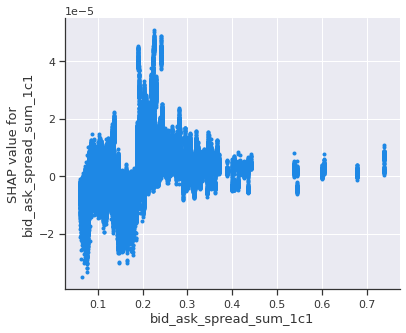

features =  bid_ask_spread_sum_3c1
LightGBM model1


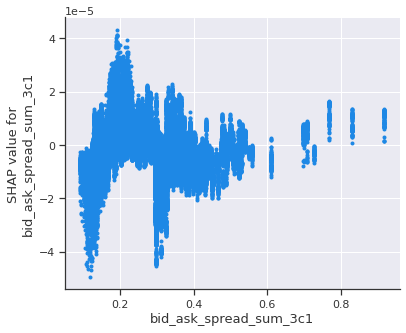

features =  bid_ask_spread_sum_4c1
LightGBM model1


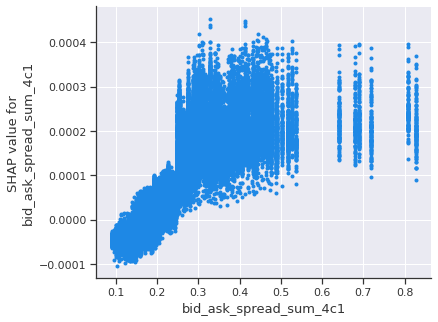

features =  bid_ask_spread_sum_6c1
LightGBM model1


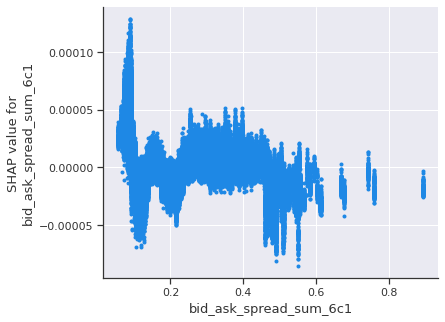

features =  size_tau2_0c1
LightGBM model1


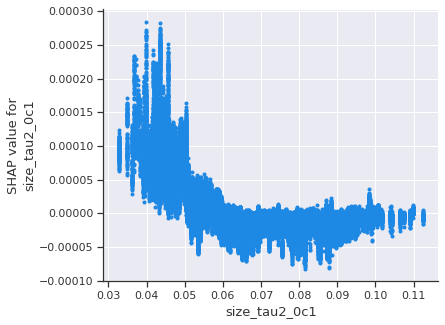

features =  size_tau2_1c1
LightGBM model1


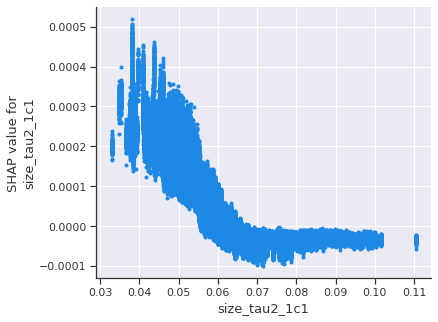

features =  size_tau2_3c1
LightGBM model1


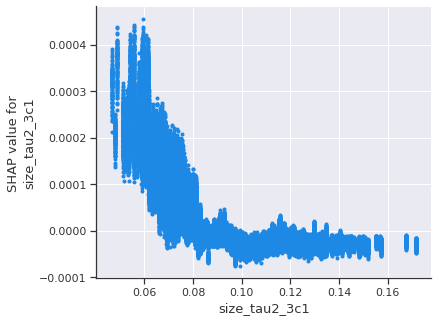

features =  size_tau2_4c1
LightGBM model1


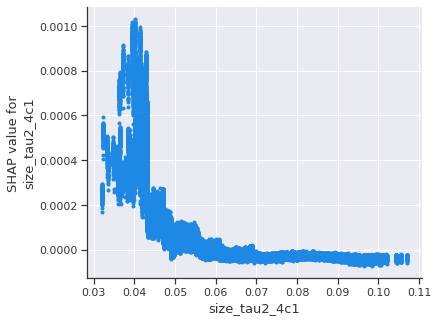

features =  size_tau2_6c1
LightGBM model1


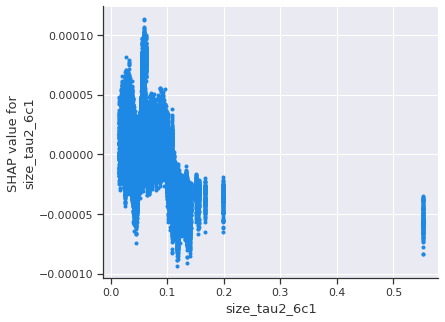

In [62]:
for column in features:
    print("features = ", column)
    print("LightGBM model1")
    shap.dependence_plot(ind=column,
                     interaction_index=None,
                     shap_values=shap_values,
                     features=train_temp1,
                     feature_names=train_temp1.columns)
    #print("LightGBM model2")
    #shap.dependence_plot(ind=column,
    #                 interaction_index=None,
    #                 shap_values=shap_values2,
    #                 features=train_temp1,
    #                 feature_names=train_temp1.columns)

### dependence plot(shap_value vs features vs additional features)

LightGBM model1


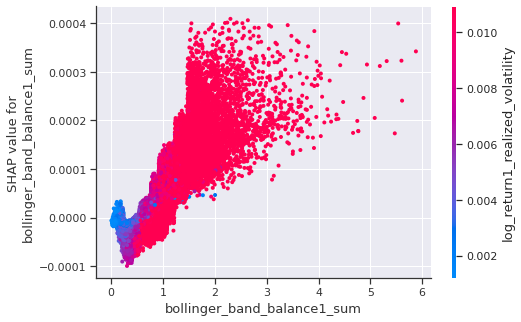

In [63]:
print("LightGBM model1")
shap.dependence_plot(ind='bollinger_band_balance1_sum',
                     interaction_index='log_return1_realized_volatility',
                     shap_values=shap_values,
                     features=train_temp1,
                     feature_names=train_temp1.columns)
#print("LightGBM model2")
##shap.dependence_plot(ind='bollinger_band_balance1_sum',
 #                    interaction_index='log_return1_realized_volatility',
 #                    shap_values=shap_values2,
 #                    features=train_temp1,
 #                    feature_names=train_temp1.columns)

### waterfall_lagacy

0
LightGBM model1


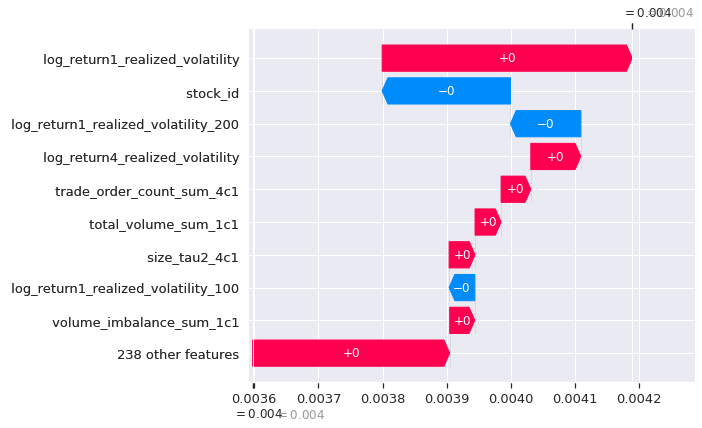

1
LightGBM model1


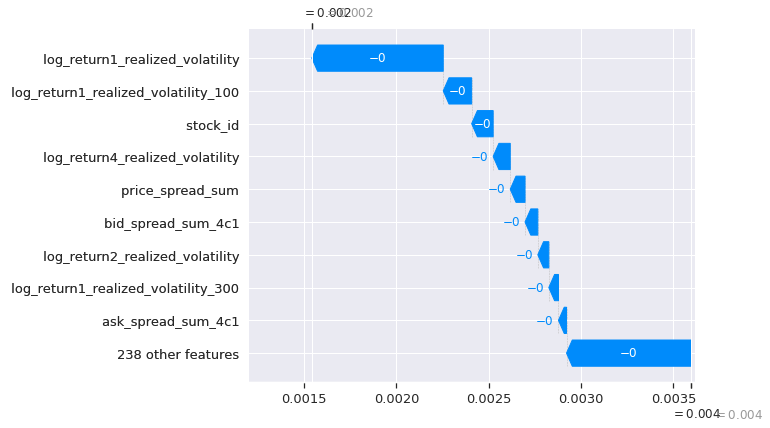

2
LightGBM model1


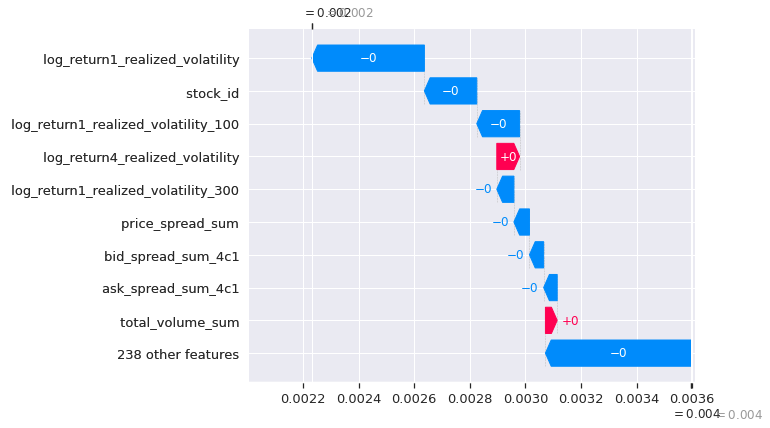

3
LightGBM model1


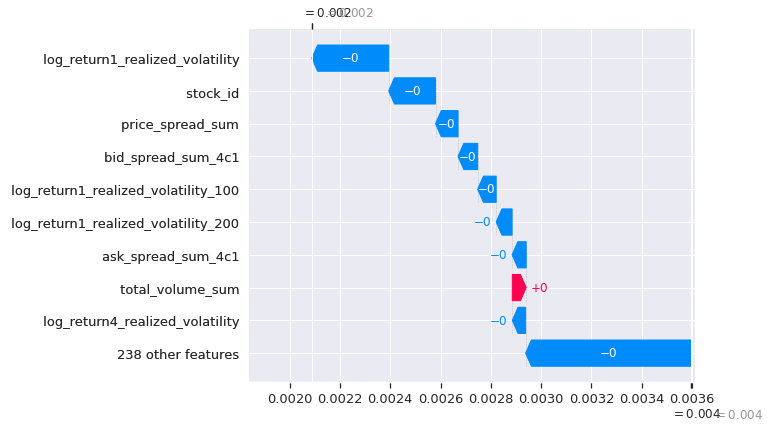

4
LightGBM model1


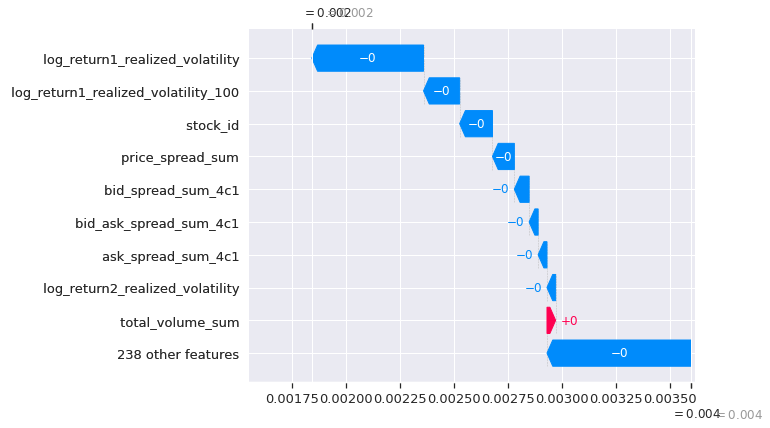

5
LightGBM model1


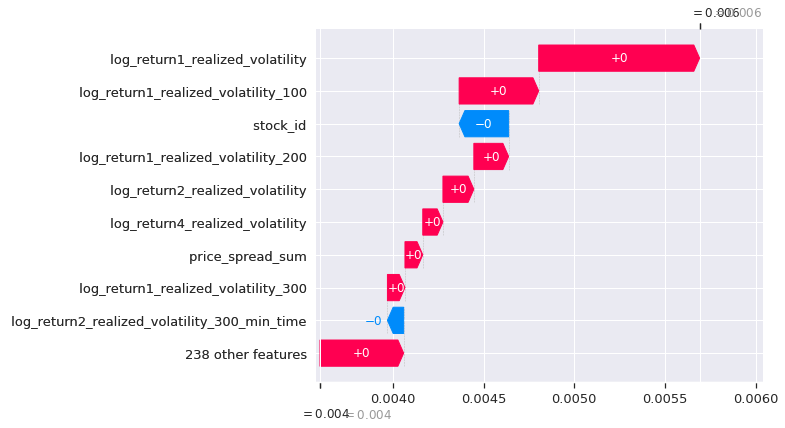

6
LightGBM model1


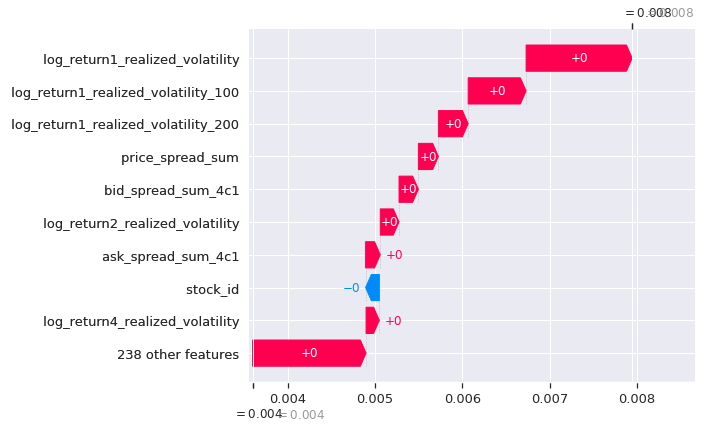

7
LightGBM model1


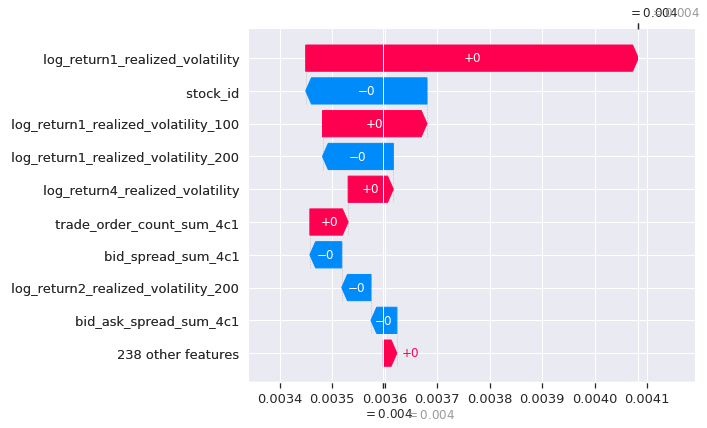

8
LightGBM model1


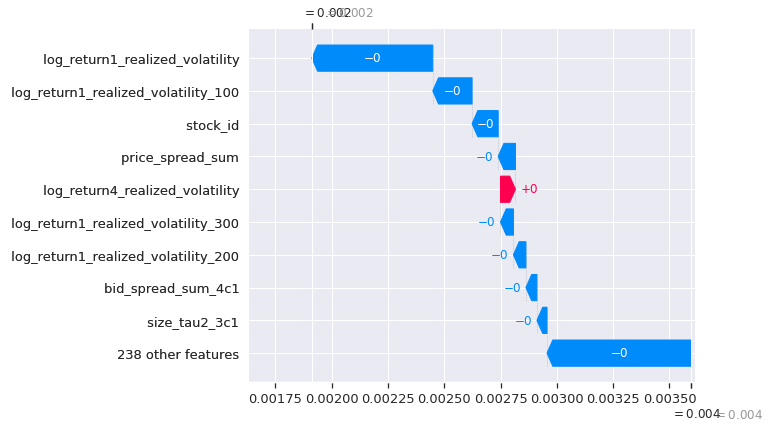

9
LightGBM model1


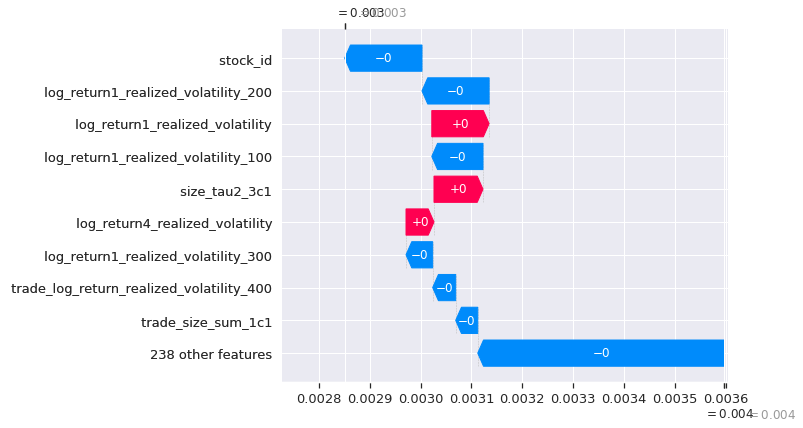

In [64]:
n = 0
for n in range(10):
    print(n)
    print("LightGBM model1")
    shap.plots._waterfall.waterfall_legacy(explainer.expected_value, 
                                           shap_values[n,:], 
                                           train_temp1.iloc[n,:]) 
   # print("LightGBM model2")
    #try:
    #    shap.plots._waterfall.waterfall_legacy(explainer2.expected_value, 
    #                                           shap_values2[n,:], 
    #                                           train_temp1.iloc[n,:]) 
        

### dicision plot

LightGBM model1


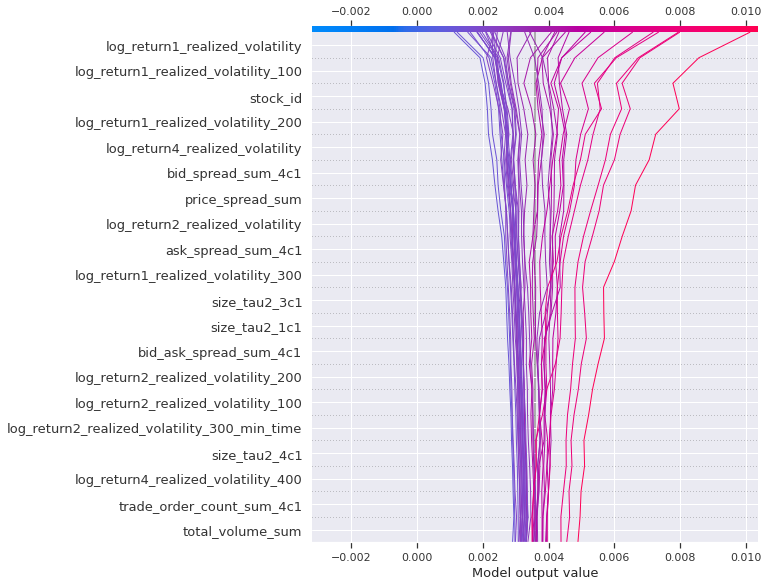

In [65]:
print("LightGBM model1")
shap.decision_plot(base_value=explainer.expected_value,
                shap_values=shap_values[:40],
                features=train_temp1[:40],
                feature_names=list(train_temp1.columns))
#print("LightGBM model2")
#try:
#    shap.decision_plot(base_value=explainer.expected_value,
#                    shap_values=shap_values[:40],
#                    features=train_temp1[:40],
#                    feature_names=list(train_temp1.columns))

In [66]:
model2_importance_gain = pd.read_pickle('lightGBM_model2_importance_gain.pkl')
model1_importance_gain = pd.read_pickle('lightGBM_model1_importance_gain.pkl')
model_importance_gain = model1_importance_gain.merge(model2_importance_gain, how = 'left', left_index=True, right_index=True)
model_importance_gain["importnce_xy"] = (model_importance_gain["importance_x"] +model_importance_gain["importance_y"])/2  

In [67]:
pd.set_option('display.max_rows', 250)
model_importance_gain[model_importance_gain["importnce_xy"] < 200]["importnce_xy"].sort_values()

size_tau2_200                                            2.547243
log_return1_realized_volatility_200_std_stock            3.081508
size_tau2_300                                            4.262564
size_tau2_d                                              6.376415
log_return1_realized_volatility_300_std_stock            7.052651
trade_log_return_realized_volatility_200_max_stock      10.381314
size_tau2_400                                           11.851416
log_return1_realized_volatility_300_max_stock           12.143816
trade_log_return_realized_volatility_max_stock          13.443348
trade_log_return_realized_volatility_300_max_stock      14.103230
log_return2_realized_volatility_300_max_stock           14.991835
log_return2_realized_volatility_200_mean_stock          15.062285
trade_log_return_realized_volatility_200_std_stock      16.184806
trade_log_return_realized_volatility_400_min_stock      16.610900
trade_log_return_realized_volatility_400_max_stock      16.810197
trade_log_